In [25]:
def reader(fn):
    gc = open(fn)
    while 1:
        line = gc.readline()
        if not line:
            break
        yield line[:-1]

def path_gen(lines):
    relative_extrude_mode = None
    current = {
        "X": 0.0,
        "Y": 0.0,
        "Z": 0.0,
        "E": 0.0
    }
    home_position = {
        "X": 12700.0/80,
        "Y": -20000.0/80,
        "Z": 20000.0/1600,
        "E": 0.0
    }
    current_feed = None
    
    path = []
    current_mode = None
    while 1:
        try:
            l = next(lines)
        except StopIteration:
            if path and current_mode:
                yield current_mode, path
            break

        if ';' in l:
            l = l.split(';')[0]
        l = l.strip()
        if not l:
            continue

        if l[0] == "M":
            parts = l.split()
            code = int(parts[0][1:])
            if code == 82:
                relative_extrude_mode = False
                continue
            elif code == 83:
                relative_extrude_mode = True
                continue
            elif code in (84, 104, 105, 106, 107, 109, 140, 190):
                continue
            else:
                print("Unknown M{} command".format(code))
                break
                
        if l[0] == "G":
            parts = l.split()
            code = int(parts[0][1:])
            if code == 28:
                if path and current_mode:
                    yield current_mode, path
                current_mode = None
                path = []
                print("Do Home")
                current = home_position.copy()
                continue
            elif code == 92:
                print("Set current", parts[1:])
                abort = False
                for p in parts[1:]:
                    axis = p[0]
                    value = float(p[1:])
                    assert axis == "E"
                    if axis in current:
                        current[axis] = value
                    else:
                        print("Unexpected G92 for {}".format(p))
                        abort = True
                        break
                if abort:
                    break
                continue
            elif code in (0, 1):
                if path and current_mode != code:
                    yield current_mode, path
                    path = []
                current_mode = code
                if not path:
                    path.append(current.copy())
                step = {}
                for p in parts[1:]:
                    axis = p[0]
                    value = float(p[1:])
                    if axis in current:
                        step[axis] = (value - current[axis])
                        current[axis] = value
                    elif axis == "F":
                        current_feed = value
                    else:
                        print("Unexpected G{} for {}".format(code, p))
                        abort = True
                        break
                step["F"] = current_feed

                path.append(step)
                continue
            else:
                print("Unknown G{} command".format(code))
                break
                
        print("Unknown command: {}".format(l))
        break
                    
    
lines = reader("test.gcode")
pg = path_gen(lines)
for i, path in enumerate(pg):
    if len(path[1]) < 6:
        print(i, path[0], len(path[1]), path[1])
    else:
        print(i, path[0], len(path[1]), path[1][:3], "....", path[1][-2:])




Do Home
Set current ['E0']
Set current ['E0']
Set current ['E0']
Set current ['E0']
0 1 4 [{'X': 158.75, 'Y': -250.0, 'Z': 12.5, 'E': 0.0}, {'Z': 2.5, 'F': 6000.0}, {'E': 3.0, 'F': 200.0}, {'E': -6.5, 'F': 1500.0}]
1 0 2 [{'X': 158.75, 'Y': -250.0, 'Z': 15.0, 'E': -6.5}, {'X': -156.977, 'Y': 203.188, 'Z': -14.7, 'F': 3600.0}]
2 1 265 [{'X': 1.773, 'Y': -46.812, 'Z': 0.3, 'E': -6.5}, {'E': 6.5, 'F': 1500.0}, {'X': 2.7620000000000005, 'Y': 0.03599999999999426, 'E': 0.13781, 'F': 1800.0}] .... [{'X': 2.7159999999999997, 'Y': 0.11200000000000188, 'E': 0.1356199999999994, 'F': 1800.0}, {'E': -6.5, 'F': 1500.0}]
3 0 5 [{'X': 1.773, 'Y': -46.812, 'Z': 0.3, 'E': 13.15427}, {'X': 6.870000000000001, 'Y': 3.5749999999999957, 'F': 3600.0}, {'X': 1.2439999999999998, 'Y': 0.31800000000000495, 'F': 3600.0}, {'X': 15.565000000000001, 'Y': 18.573999999999998, 'F': 3600.0}, {'X': 0.07499999999999929, 'Y': -0.06500000000000128, 'F': 3600.0}]
4 1 28 [{'X': 25.527, 'Y': -24.41, 'Z': 0.3, 'E': 13.15427}, {'

261 0 2 [{'X': 50.56, 'Y': 4.74, 'Z': 0.3, 'E': 179.04966}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 3600.0}]
262 1 2 [{'X': 50.56, 'Y': 5.306, 'Z': 0.3, 'E': 179.04966}, {'X': -13.239000000000004, 'Y': -13.239, 'E': 0.9340800000000229, 'F': 1800.0}]
263 0 2 [{'X': 37.321, 'Y': -7.933, 'Z': 0.3, 'E': 179.98374}, {'X': 0.03399999999999892, 'Y': 0.5990000000000002, 'F': 3600.0}]
264 1 2 [{'X': 37.355, 'Y': -7.334, 'Z': 0.3, 'E': 179.98374}, {'X': 13.205000000000005, 'Y': 13.205, 'E': 0.9316800000000001, 'F': 1800.0}]
265 0 2 [{'X': 50.56, 'Y': 5.871, 'Z': 0.3, 'E': 180.91542}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 3600.0}]
266 1 2 [{'X': 50.56, 'Y': 6.437, 'Z': 0.3, 'E': 180.91542}, {'X': -13.267000000000003, 'Y': -13.266, 'E': 0.9360299999999881, 'F': 1800.0}]
267 0 2 [{'X': 37.293, 'Y': -6.829, 'Z': 0.3, 'E': 181.85145}, {'X': -0.06099999999999994, 'Y': 0.5039999999999996, 'F': 3600.0}]
268 1 2 [{'X': 37.232, 'Y': -6.325, 'Z': 0.3, 'E': 181.85145}, {'X': 13.328000000000003, 'Y': 13.

505 0 2 [{'X': 40.762, 'Y': 44.722, 'Z': 0.3, 'E': 404.7288}, {'X': -0.3509999999999991, 'Y': 0.21399999999999864, 'F': 3600.0}]
506 1 2 [{'X': 40.411, 'Y': 44.936, 'Z': 0.3, 'E': 404.7288}, {'X': -29.973, 'Y': -29.973, 'E': 2.114750000000015, 'F': 1800.0}]
507 0 2 [{'X': 10.438, 'Y': 14.963, 'Z': 0.3, 'E': 406.84355}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 3600.0}]
508 1 2 [{'X': 10.438, 'Y': 15.529, 'Z': 0.3, 'E': 406.84355}, {'X': 29.607, 'Y': 29.607000000000003, 'E': 2.0889399999999796, 'F': 1800.0}]
509 0 2 [{'X': 40.045, 'Y': 45.136, 'Z': 0.3, 'E': 408.93249}, {'X': -0.3680000000000021, 'Y': 0.1980000000000004, 'F': 3600.0}]
510 1 2 [{'X': 39.677, 'Y': 45.334, 'Z': 0.3, 'E': 408.93249}, {'X': -29.238999999999997, 'Y': -29.239000000000004, 'E': 2.062970000000007, 'F': 1800.0}]
511 0 2 [{'X': 10.438, 'Y': 16.095, 'Z': 0.3, 'E': 410.99546}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 3600.0}]
512 1 2 [{'X': 10.438, 'Y': 16.66, 'Z': 0.3, 'E': 410.99546}, {'X': 28.852999999999994, 'Y':

629 0 2 [{'X': -50.56, 'Y': 33.726, 'Z': 0.3, 'E': 516.10413}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 3600.0}]
630 1 2 [{'X': -50.56, 'Y': 33.16, 'Z': 0.3, 'E': 516.10413}, {'X': 9.400000000000006, 'Y': 9.400000000000006, 'E': 0.6632199999999102, 'F': 1800.0}]
631 0 2 [{'X': -41.16, 'Y': 42.56, 'Z': 0.3, 'E': 516.76735}, {'X': 0.5649999999999977, 'Y': 0.0, 'F': 3600.0}]
632 1 2 [{'X': -40.595, 'Y': 42.56, 'Z': 0.3, 'E': 516.76735}, {'X': -9.965000000000003, 'Y': -9.966000000000001, 'E': 0.7031200000000126, 'F': 1800.0}]
633 0 2 [{'X': -50.56, 'Y': 32.594, 'Z': 0.3, 'E': 517.47047}, {'X': 0.0, 'Y': -0.5649999999999977, 'F': 3600.0}]
634 1 2 [{'X': -50.56, 'Y': 32.029, 'Z': 0.3, 'E': 517.47047}, {'X': 10.530999999999999, 'Y': 10.530999999999999, 'E': 0.7430200000000013, 'F': 1800.0}]
635 0 2 [{'X': -40.029, 'Y': 42.56, 'Z': 0.3, 'E': 518.21349}, {'X': 0.5660000000000025, 'Y': 0.0, 'F': 3600.0}]
636 1 2 [{'X': -39.463, 'Y': 42.56, 'Z': 0.3, 'E': 518.21349}, {'X': -11.097000000000001, '

879 0 2 [{'X': -10.439, 'Y': 4.268, 'Z': 0.3, 'E': 681.13448}, {'X': 0.0, 'Y': -0.565, 'F': 3600.0}]
880 1 2 [{'X': -10.439, 'Y': 3.703, 'Z': 0.3, 'E': 681.13448}, {'X': -38.651, 'Y': -38.651, 'E': 2.727039999999988, 'F': 1800.0}]
881 0 2 [{'X': -49.09, 'Y': -34.948, 'Z': 0.3, 'E': 683.86152}, {'X': 0.14800000000000324, 'Y': -0.4170000000000016, 'F': 3600.0}]
882 1 2 [{'X': -48.942, 'Y': -35.365, 'Z': 0.3, 'E': 683.86152}, {'X': 38.503, 'Y': 38.502, 'E': 2.7165599999999586, 'F': 1800.0}]
883 0 2 [{'X': -10.439, 'Y': 3.137, 'Z': 0.3, 'E': 686.57808}, {'X': 0.0, 'Y': -0.5659999999999998, 'F': 3600.0}]
884 1 2 [{'X': -10.439, 'Y': 2.571, 'Z': 0.3, 'E': 686.57808}, {'X': -38.321, 'Y': -38.32, 'E': 2.7037199999999757, 'F': 1800.0}]
885 0 2 [{'X': -48.76, 'Y': -35.749, 'Z': 0.3, 'E': 689.2818}, {'X': 0.1939999999999955, 'Y': -0.3719999999999999, 'F': 3600.0}]
886 1 2 [{'X': -48.566, 'Y': -36.121, 'Z': 0.3, 'E': 689.2818}, {'X': 38.127, 'Y': 38.127, 'E': 2.6900600000000168, 'F': 1800.0}]
887 

1181 0 11 [{'X': -32.802, 'Y': -0.79, 'Z': 0.6, 'E': 890.21881}, {'X': -0.026000000000003354, 'Y': -0.09599999999999997, 'F': 5400.0}, {'X': -1.7199999999999989, 'Y': 0.75, 'F': 5400.0}] .... [{'X': 3.4440000000000026, 'Y': 15.131999999999998, 'F': 5400.0}, {'X': 0.07399999999999807, 'Y': 0.0660000000000025, 'F': 5400.0}]
1182 1 27 [{'X': -35.444, 'Y': 24.37, 'Z': 0.6, 'E': 890.21881}, {'X': -0.9039999999999964, 'Y': 1.311, 'E': 0.0794500000000653, 'F': 2700.0}, {'X': -0.5649999999999977, 'Y': 1.4879999999999995, 'E': 0.07939999999996417, 'F': 2700.0}] .... [{'X': -1.4079999999999941, 'Y': 0.7390000000000008, 'E': 0.07933000000002721, 'F': 2700.0}, {'X': -1.193000000000005, 'Y': 1.056000000000001, 'E': 0.079490000000078, 'F': 2700.0}]
1183 0 7 [{'X': -35.444, 'Y': 24.37, 'Z': 0.6, 'E': 892.28411}, {'X': -0.07399999999999807, 'Y': -0.0660000000000025, 'F': 5400.0}, {'X': -3.423000000000002, 'Y': -14.945999999999998, 'F': 5400.0}] .... [{'X': 11.161000000000001, 'Y': -54.384, 'F': 5400.0

1372 1 2 [{'X': -21.653, 'Y': 5.248, 'Z': 0.6, 'E': 1023.33471}, {'X': 11.739999999999998, 'Y': -11.739, 'E': 0.8282800000000634, 'F': 1800.0}]
1373 0 2 [{'X': -9.913, 'Y': -6.491, 'Z': 0.6, 'E': 1024.16299}, {'X': 0.0, 'Y': -0.5650000000000004, 'F': 5400.0}]
1374 1 2 [{'X': -9.913, 'Y': -7.056, 'Z': 0.6, 'E': 1024.16299}, {'X': -11.841999999999999, 'Y': 11.84, 'E': 0.8354500000000371, 'F': 1800.0}]
1375 0 2 [{'X': -21.755, 'Y': 4.784, 'Z': 0.6, 'E': 1024.99844}, {'X': -0.14300000000000068, 'Y': -0.4219999999999997, 'F': 5400.0}]
1376 1 2 [{'X': -21.898, 'Y': 4.362, 'Z': 0.6, 'E': 1024.99844}, {'X': 11.985, 'Y': -11.984, 'E': 0.8455699999999524, 'F': 1800.0}]
1377 0 2 [{'X': -9.913, 'Y': -7.622, 'Z': 0.6, 'E': 1025.84401}, {'X': 0.0, 'Y': -0.5660000000000007, 'F': 5400.0}]
1378 1 2 [{'X': -9.913, 'Y': -8.188, 'Z': 0.6, 'E': 1025.84401}, {'X': -12.164000000000001, 'Y': 12.163, 'E': 0.858199999999897, 'F': 1800.0}]
1379 0 2 [{'X': -22.077, 'Y': 3.975, 'Z': 0.6, 'E': 1026.70221}, {'X': -0

1622 1 2 [{'X': -38.139, 'Y': 2.501, 'Z': 0.6, 'E': 1260.61341}, {'X': -12.951, 'Y': 12.951, 'E': 0.9137600000001385, 'F': 1800.0}]
1623 0 2 [{'X': -51.09, 'Y': 15.452, 'Z': 0.6, 'E': 1261.52717}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 5400.0}]
1624 1 3 [{'X': -51.09, 'Y': 16.018, 'Z': 0.6, 'E': 1261.52717}, {'X': 12.205000000000005, 'Y': -12.206000000000001, 'E': 0.8611599999999271, 'F': 1800.0}, {'X': 0.07000000000000028, 'Y': -0.06999999999999984, 'F': 1800.0}]
1625 0 2 [{'X': -38.815, 'Y': 3.742, 'Z': 0.6, 'E': 1262.38833}, {'X': -0.3569999999999993, 'Y': 0.923, 'F': 5400.0}]
1626 1 2 [{'X': -39.172, 'Y': 4.665, 'Z': 0.6, 'E': 1262.38833}, {'X': -11.918000000000006, 'Y': 11.918, 'E': 0.8408799999999701, 'F': 1800.0}]
1627 0 2 [{'X': -51.09, 'Y': 16.583, 'Z': 0.6, 'E': 1263.22921}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 5400.0}]
1628 1 2 [{'X': -51.09, 'Y': 17.149, 'Z': 0.6, 'E': 1263.22921}, {'X': 11.632000000000005, 'Y': -11.632000000000001, 'E': 0.820699999999988, 'F': 1800.0

1864 1 2 [{'X': 51.09, 'Y': 18.488, 'Z': 0.6, 'E': 1423.02649}, {'X': -28.155000000000005, 'Y': 28.155, 'E': 1.9864900000000034, 'F': 1800.0}]
1865 0 2 [{'X': 22.935, 'Y': 46.643, 'Z': 0.6, 'E': 1425.01298}, {'X': -0.4029999999999987, 'Y': -0.1630000000000038, 'F': 5400.0}]
1866 1 2 [{'X': 22.532, 'Y': 46.48, 'Z': 0.6, 'E': 1425.01298}, {'X': 28.558000000000003, 'Y': -28.557, 'E': 2.014889999999923, 'F': 1800.0}]
1867 0 2 [{'X': 51.09, 'Y': 17.923, 'Z': 0.6, 'E': 1427.02787}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 5400.0}]
1868 1 2 [{'X': 51.09, 'Y': 17.357, 'Z': 0.6, 'E': 1427.02787}, {'X': -28.944000000000003, 'Y': 28.944000000000003, 'E': 2.0421500000002197, 'F': 1800.0}]
1869 0 2 [{'X': 22.146, 'Y': 46.301, 'Z': 0.6, 'E': 1429.07002}, {'X': -0.38700000000000045, 'Y': -0.17900000000000205, 'F': 5400.0}]
1870 1 2 [{'X': 21.759, 'Y': 46.122, 'Z': 0.6, 'E': 1429.07002}, {'X': 29.331000000000003, 'Y': -29.331, 'E': 2.0694599999999355, 'F': 1800.0}]
1871 0 2 [{'X': 51.09, 'Y': 16.791, 

2114 1 2 [{'X': 9.908, 'Y': 17.244, 'Z': 0.6, 'E': 1663.85423}, {'X': 18.286, 'Y': -18.285, 'E': 1.290140000000065, 'F': 1800.0}]
2115 0 2 [{'X': 28.194, 'Y': -1.041, 'Z': 0.6, 'E': 1665.14437}, {'X': 0.4529999999999994, 'Y': 0.11299999999999988, 'F': 5400.0}]
2116 1 2 [{'X': 28.647, 'Y': -0.928, 'Z': 0.6, 'E': 1665.14437}, {'X': -18.738999999999997, 'Y': 18.737000000000002, 'E': 1.3220699999999397, 'F': 1800.0}]
2117 0 2 [{'X': 9.908, 'Y': 17.809, 'Z': 0.6, 'E': 1666.46644}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 5400.0}]
2118 1 2 [{'X': 9.908, 'Y': 18.375, 'Z': 0.6, 'E': 1666.46644}, {'X': 19.191000000000003, 'Y': -19.19, 'E': 1.353990000000067, 'F': 1800.0}]
2119 0 2 [{'X': 29.099, 'Y': -0.815, 'Z': 0.6, 'E': 1667.82043}, {'X': 0.4519999999999982, 'Y': 0.11399999999999999, 'F': 5400.0}]
2120 1 2 [{'X': 29.551, 'Y': -0.701, 'Z': 0.6, 'E': 1667.82043}, {'X': -19.643, 'Y': 19.642, 'E': 1.3858900000000176, 'F': 1800.0}]
2121 0 2 [{'X': 9.908, 'Y': 18.941, 'Z': 0.6, 'E': 1669.20632}, {'

2363 0 2 [{'X': 11.412, 'Y': -43.091, 'Z': 0.6, 'E': 1788.45436}, {'X': -0.5650000000000013, 'Y': 0.0, 'F': 5400.0}]
2364 1 2 [{'X': 10.847, 'Y': -43.091, 'Z': 0.6, 'E': 1788.45436}, {'X': -0.9390000000000001, 'Y': 0.9390000000000001, 'E': 0.06626000000005661, 'F': 1800.0}]
2365 0 2 [{'X': 9.908, 'Y': -42.152, 'Z': 0.6, 'E': 1788.52062}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 5400.0}]
2366 1 2 [{'X': 9.908, 'Y': -42.718, 'Z': 0.6, 'E': 1788.52062}, {'X': 0.3730000000000011, 'Y': -0.37299999999999756, 'E': 0.02630999999996675, 'F': 1800.0}]
2367 0 4 [{'X': 10.281, 'Y': -43.091, 'Z': 0.6, 'E': 1788.54693}, {'X': 0.0, 'Y': 0.0, 'Z': 0.30000000000000004, 'F': 600.0}, {'X': 13.991999999999999, 'Y': 37.065, 'F': 5400.0}, {'X': 0.0990000000000002, 'Y': -0.009999999999999787, 'F': 5400.0}]
2368 1 27 [{'X': 24.372, 'Y': -6.036, 'Z': 0.9, 'E': 1788.54693}, {'X': 0.5289999999999999, 'Y': 1.4239999999999995, 'E': 0.07579000000009728, 'F': 3600.0}, {'X': 0.8530000000000015, 'Y': 1.25600000000000

2608 1 2 [{'X': 51.39, 'Y': 14.62, 'Z': 0.9, 'E': 2076.61045}, {'X': -16.71, 'Y': -16.709, 'E': 1.1789499999999862, 'F': 1800.0}]
2609 0 2 [{'X': 34.68, 'Y': -2.089, 'Z': 0.9, 'E': 2077.7894}, {'X': 0.30100000000000193, 'Y': -0.26400000000000023, 'F': 7200.0}]
2610 1 2 [{'X': 34.981, 'Y': -2.353, 'Z': 0.9, 'E': 2077.7894}, {'X': 16.409, 'Y': 16.408, 'E': 1.1576999999997497, 'F': 1800.0}]
2611 0 2 [{'X': 51.39, 'Y': 14.055, 'Z': 0.9, 'E': 2078.9471}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
2612 1 2 [{'X': 51.39, 'Y': 13.489, 'Z': 0.9, 'E': 2078.9471}, {'X': -16.107, 'Y': -16.106, 'E': 1.1364000000003216, 'F': 1800.0}]
2613 0 2 [{'X': 35.283, 'Y': -2.617, 'Z': 0.9, 'E': 2080.0835}, {'X': 0.3019999999999996, 'Y': -0.2629999999999999, 'F': 7200.0}]
2614 1 2 [{'X': 35.585, 'Y': -2.88, 'Z': 0.9, 'E': 2080.0835}, {'X': 15.805, 'Y': 15.803, 'E': 1.1150599999996302, 'F': 1800.0}]
2615 0 2 [{'X': 51.39, 'Y': 12.923, 'Z': 0.9, 'E': 2081.19856}, {'X': 0.0, 'Y': -0.5649999999999995, 'F': 

2858 1 2 [{'X': 34.391, 'Y': -22.742, 'Z': 0.9, 'E': 2193.93043}, {'X': 16.999000000000002, 'Y': 16.999000000000002, 'E': 1.1993700000002718, 'F': 1800.0}]
2859 0 2 [{'X': 51.39, 'Y': -5.743, 'Z': 0.9, 'E': 2195.1298}, {'X': 0.0, 'Y': 0.5650000000000004, 'F': 7200.0}]
2860 1 2 [{'X': 51.39, 'Y': -5.178, 'Z': 0.9, 'E': 2195.1298}, {'X': -17.371000000000002, 'Y': -17.369999999999997, 'E': 1.225579999999809, 'F': 1800.0}]
2861 0 2 [{'X': 34.019, 'Y': -22.548, 'Z': 0.9, 'E': 2196.35538}, {'X': -0.3709999999999951, 'Y': 0.19399999999999906, 'F': 7200.0}]
2862 1 2 [{'X': 33.648, 'Y': -22.354, 'Z': 0.9, 'E': 2196.35538}, {'X': 17.741999999999997, 'Y': 17.741999999999997, 'E': 1.251800000000003, 'F': 1800.0}]
2863 0 2 [{'X': 51.39, 'Y': -4.612, 'Z': 0.9, 'E': 2197.60718}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
2864 1 2 [{'X': 51.39, 'Y': -4.046, 'Z': 0.9, 'E': 2197.60718}, {'X': -18.113999999999997, 'Y': -18.114, 'E': 1.2780400000001464, 'F': 1800.0}]
2865 0 2 [{'X': 33.276, 'Y': -2

2976 1 2 [{'X': -49.946, 'Y': 43.391, 'Z': 0.9, 'E': 2306.89004}, {'X': -1.4450000000000003, 'Y': -1.4450000000000003, 'E': 0.10194999999976062, 'F': 1800.0}]
2977 0 2 [{'X': -51.391, 'Y': 41.946, 'Z': 0.9, 'E': 2306.99199}, {'X': 0.0, 'Y': -0.5649999999999977, 'F': 7200.0}]
2978 1 2 [{'X': -51.391, 'Y': 41.381, 'Z': 0.9, 'E': 2306.99199}, {'X': 2.0109999999999957, 'Y': 2.009999999999998, 'E': 0.14184999999997672, 'F': 1800.0}]
2979 0 2 [{'X': -49.38, 'Y': 43.391, 'Z': 0.9, 'E': 2307.13384}, {'X': 0.5650000000000048, 'Y': 0.0, 'F': 7200.0}]
2980 1 2 [{'X': -48.815, 'Y': 43.391, 'Z': 0.9, 'E': 2307.13384}, {'X': -2.5760000000000005, 'Y': -2.5760000000000005, 'E': 0.1817500000001928, 'F': 1800.0}]
2981 0 2 [{'X': -51.391, 'Y': 40.815, 'Z': 0.9, 'E': 2307.31559}, {'X': 0.0, 'Y': -0.5659999999999954, 'F': 7200.0}]
2982 1 2 [{'X': -51.391, 'Y': 40.249, 'Z': 0.9, 'E': 2307.31559}, {'X': 3.141999999999996, 'Y': 3.141999999999996, 'E': 0.22168999999985317, 'F': 1800.0}]
2983 0 2 [{'X': -48.249

3225 0 2 [{'X': -9.608, 'Y': 34.514, 'Z': 0.9, 'E': 2425.9745}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
3226 1 2 [{'X': -9.608, 'Y': 33.948, 'Z': 0.9, 'E': 2425.9745}, {'X': -17.829, 'Y': -17.829, 'E': 1.257930000000215, 'F': 1800.0}]
3227 0 2 [{'X': -27.437, 'Y': 16.119, 'Z': 0.9, 'E': 2427.23243}, {'X': 0.4239999999999995, 'Y': -0.14100000000000001, 'F': 7200.0}]
3228 1 2 [{'X': -27.013, 'Y': 15.978, 'Z': 0.9, 'E': 2427.23243}, {'X': 17.405, 'Y': 17.405, 'E': 1.228020000000015, 'F': 1800.0}]
3229 0 2 [{'X': -9.608, 'Y': 33.383, 'Z': 0.9, 'E': 2428.46045}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
3230 1 2 [{'X': -9.608, 'Y': 32.817, 'Z': 0.9, 'E': 2428.46045}, {'X': -17.035, 'Y': -17.035, 'E': 1.2019099999997707, 'F': 1800.0}]
3231 0 2 [{'X': -26.643, 'Y': 15.782, 'Z': 0.9, 'E': 2429.66236}, {'X': 0.370000000000001, 'Y': -0.19599999999999973, 'F': 7200.0}]
3232 1 2 [{'X': -26.273, 'Y': 15.586, 'Z': 0.9, 'E': 2429.66236}, {'X': 16.665, 'Y': 16.665, 'E': 1.175810000

3475 0 2 [{'X': -13.323, 'Y': -39.344, 'Z': 0.9, 'E': 2660.45105}, {'X': -38.067, 'Y': 13.976000000000003, 'F': 7200.0}]
3476 1 3 [{'X': -51.39, 'Y': -25.368, 'Z': 0.9, 'E': 2660.45105}, {'X': 24.405, 'Y': 24.404999999999998, 'E': 1.7219099999997525, 'F': 1800.0}, {'X': 0.07000000000000028, 'Y': 0.06999999999999995, 'F': 1800.0}]
3477 0 2 [{'X': -26.915, 'Y': -0.893, 'Z': 0.9, 'E': 2662.17296}, {'X': -0.8960000000000008, 'Y': -0.33099999999999996, 'F': 7200.0}]
3478 1 2 [{'X': -27.811, 'Y': -1.224, 'Z': 0.9, 'E': 2662.17296}, {'X': -23.579, 'Y': -23.579, 'E': 1.6636200000002646, 'F': 1800.0}]
3479 0 2 [{'X': -51.39, 'Y': -24.803, 'Z': 0.9, 'E': 2663.83658}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
3480 1 2 [{'X': -51.39, 'Y': -24.237, 'Z': 0.9, 'E': 2663.83658}, {'X': 22.796, 'Y': 22.796, 'E': 1.60837999999967, 'F': 1800.0}]
3481 0 2 [{'X': -28.594, 'Y': -1.441, 'Z': 0.9, 'E': 2665.44496}, {'X': -0.6969999999999992, 'Y': -0.1319999999999999, 'F': 7200.0}]
3482 1 2 [{'X': -29.2

3717 0 2 [{'X': 51.484, 'Y': 28.842, 'Z': 1.2, 'E': 2850.3401}, {'X': -0.25500000000000256, 'Y': -0.3099999999999987, 'F': 7200.0}]
3718 1 2 [{'X': 51.229, 'Y': 28.532, 'Z': 1.2, 'E': 2850.3401}, {'X': 0.29700000000000415, 'Y': -0.2970000000000006, 'E': 0.0209500000000844, 'F': 1800.0}]
3719 0 2 [{'X': 51.526, 'Y': 28.235, 'Z': 1.2, 'E': 2850.36105}, {'X': -0.2560000000000002, 'Y': -0.3099999999999987, 'F': 7200.0}]
3720 1 2 [{'X': 51.27, 'Y': 27.925, 'Z': 1.2, 'E': 2850.36105}, {'X': 0.29699999999999704, 'Y': -0.2970000000000006, 'E': 0.02095999999983178, 'F': 1800.0}]
3721 0 2 [{'X': 51.567, 'Y': 27.628, 'Z': 1.2, 'E': 2850.38201}, {'X': -0.267000000000003, 'Y': -0.2989999999999995, 'F': 7200.0}]
3722 1 2 [{'X': 51.3, 'Y': 27.329, 'Z': 1.2, 'E': 2850.38201}, {'X': 0.28000000000000114, 'Y': -0.28000000000000114, 'E': 0.019750000000385626, 'F': 1800.0}]
3723 0 2 [{'X': 51.58, 'Y': 27.049, 'Z': 1.2, 'E': 2850.40176}, {'X': -0.28000000000000114, 'Y': -0.2859999999999978, 'F': 7200.0}]
37

3842 1 2 [{'X': 51.3, 'Y': -6.611, 'Z': 1.2, 'E': 2851.56452}, {'X': 0.27900000000000347, 'Y': -0.2789999999999999, 'E': 0.019679999999880238, 'F': 1800.0}]
3843 0 2 [{'X': 51.579, 'Y': -6.89, 'Z': 1.2, 'E': 2851.5842}, {'X': -0.27900000000000347, 'Y': -0.2869999999999999, 'F': 7200.0}]
3844 1 2 [{'X': 51.3, 'Y': -7.177, 'Z': 1.2, 'E': 2851.5842}, {'X': 0.27900000000000347, 'Y': -0.27800000000000047, 'E': 0.019650000000183354, 'F': 1800.0}]
3845 0 2 [{'X': 51.579, 'Y': -7.455, 'Z': 1.2, 'E': 2851.60385}, {'X': -0.2779999999999987, 'Y': -0.28800000000000026, 'F': 7200.0}]
3846 1 2 [{'X': 51.301, 'Y': -7.743, 'Z': 1.2, 'E': 2851.60385}, {'X': 0.277000000000001, 'Y': -0.27699999999999925, 'E': 0.019549999999981083, 'F': 1800.0}]
3847 0 2 [{'X': 51.578, 'Y': -8.02, 'Z': 1.2, 'E': 2851.6234}, {'X': -0.277000000000001, 'Y': -0.2889999999999997, 'F': 7200.0}]
3848 1 2 [{'X': 51.301, 'Y': -8.309, 'Z': 1.2, 'E': 2851.6234}, {'X': 0.277000000000001, 'Y': -0.277000000000001, 'E': 0.01954000000023

3967 0 2 [{'X': 51.577, 'Y': -41.96, 'Z': 1.2, 'E': 2852.79352}, {'X': -0.27599999999999625, 'Y': -0.28999999999999915, 'F': 7200.0}]
3968 1 2 [{'X': 51.301, 'Y': -42.25, 'Z': 1.2, 'E': 2852.79352}, {'X': 0.27599999999999625, 'Y': -0.27600000000000335, 'E': 0.019479999999930442, 'F': 1800.0}]
3969 0 2 [{'X': 51.577, 'Y': -42.526, 'Z': 1.2, 'E': 2852.813}, {'X': -0.27599999999999625, 'Y': -0.28999999999999915, 'F': 7200.0}]
3970 1 2 [{'X': 51.301, 'Y': -42.816, 'Z': 1.2, 'E': 2852.813}, {'X': 0.23999999999999488, 'Y': -0.23899999999999721, 'E': 0.016889999999875727, 'F': 1800.0}]
3971 0 2 [{'X': 51.541, 'Y': -43.055, 'Z': 1.2, 'E': 2852.82989}, {'X': -0.2049999999999983, 'Y': -0.3620000000000019, 'F': 7200.0}]
3972 1 2 [{'X': 51.336, 'Y': -43.417, 'Z': 1.2, 'E': 2852.82989}, {'X': -0.17199999999999704, 'Y': 0.17300000000000182, 'E': 0.01216999999996915, 'F': 1800.0}]
3973 0 2 [{'X': 51.164, 'Y': -43.244, 'Z': 1.2, 'E': 2852.84206}, {'X': -0.23499999999999943, 'Y': -0.33100000000000307, 

4092 1 2 [{'X': 17.56, 'Y': -43.581, 'Z': 1.2, 'E': 2854.0087}, {'X': -0.2809999999999988, 'Y': 0.28000000000000114, 'E': 0.019790000000284635, 'F': 1800.0}]
4093 0 2 [{'X': 17.279, 'Y': -43.301, 'Z': 1.2, 'E': 2854.02849}, {'X': -0.28600000000000136, 'Y': -0.28000000000000114, 'F': 7200.0}]
4094 1 2 [{'X': 16.993, 'Y': -43.581, 'Z': 1.2, 'E': 2854.02849}, {'X': -0.2799999999999976, 'Y': 0.28000000000000114, 'E': 0.019759999999678257, 'F': 1800.0}]
4095 0 2 [{'X': 16.713, 'Y': -43.301, 'Z': 1.2, 'E': 2854.04825}, {'X': -0.28500000000000014, 'Y': -0.28000000000000114, 'F': 7200.0}]
4096 1 2 [{'X': 16.428, 'Y': -43.581, 'Z': 1.2, 'E': 2854.04825}, {'X': -0.28000000000000114, 'Y': 0.28000000000000114, 'E': 0.019750000000385626, 'F': 1800.0}]
4097 0 2 [{'X': 16.148, 'Y': -43.301, 'Z': 1.2, 'E': 2854.068}, {'X': -0.28699999999999903, 'Y': -0.27899999999999636, 'F': 7200.0}]
4098 1 2 [{'X': 15.861, 'Y': -43.58, 'Z': 1.2, 'E': 2854.068}, {'X': -0.2789999999999999, 'Y': 0.27899999999999636, 'E

4217 0 2 [{'X': 9.418, 'Y': -15.641, 'Z': 1.2, 'E': 2855.25471}, {'X': 0.2789999999999999, 'Y': 0.2870000000000008, 'F': 7200.0}]
4218 1 2 [{'X': 9.697, 'Y': -15.354, 'Z': 1.2, 'E': 2855.25471}, {'X': -0.2789999999999999, 'Y': 0.2789999999999999, 'E': 0.019679999999880238, 'F': 1800.0}]
4219 0 2 [{'X': 9.418, 'Y': -15.075, 'Z': 1.2, 'E': 2855.27439}, {'X': 0.2789999999999999, 'Y': 0.2859999999999996, 'F': 7200.0}]
4220 1 2 [{'X': 9.697, 'Y': -14.789, 'Z': 1.2, 'E': 2855.27439}, {'X': -0.2789999999999999, 'Y': 0.27999999999999936, 'E': 0.019719999999779247, 'F': 1800.0}]
4221 0 2 [{'X': 9.418, 'Y': -14.509, 'Z': 1.2, 'E': 2855.29411}, {'X': 0.2789999999999999, 'Y': 0.2859999999999996, 'F': 7200.0}]
4222 1 2 [{'X': 9.697, 'Y': -14.223, 'Z': 1.2, 'E': 2855.29411}, {'X': -0.2789999999999999, 'Y': 0.2789999999999999, 'E': 0.019690000000082364, 'F': 1800.0}]
4223 0 2 [{'X': 9.418, 'Y': -13.944, 'Z': 1.2, 'E': 2855.3138}, {'X': 0.2789999999999999, 'Y': 0.2870000000000008, 'F': 7200.0}]
4224 1

4467 0 2 [{'X': 19.415, 'Y': 45.073, 'Z': 1.2, 'E': 2857.53347}, {'X': 0.3450000000000024, 'Y': 0.21999999999999886, 'F': 7200.0}]
4468 1 2 [{'X': 19.76, 'Y': 45.293, 'Z': 1.2, 'E': 2857.53347}, {'X': -0.20300000000000296, 'Y': 0.20300000000000296, 'E': 0.014329999999972642, 'F': 1800.0}]
4469 0 2 [{'X': 19.557, 'Y': 45.496, 'Z': 1.2, 'E': 2857.5478}, {'X': 0.3450000000000024, 'Y': 0.22099999999999653, 'F': 7200.0}]
4470 1 2 [{'X': 19.902, 'Y': 45.717, 'Z': 1.2, 'E': 2857.5478}, {'X': 0.2029999999999994, 'Y': -0.20299999999999585, 'E': 0.014320000000225264, 'F': 1800.0}]
4471 0 2 [{'X': 20.105, 'Y': 45.514, 'Z': 1.2, 'E': 2857.56212}, {'X': 0.36499999999999844, 'Y': 0.2010000000000005, 'F': 7200.0}]
4472 1 2 [{'X': 20.47, 'Y': 45.715, 'Z': 1.2, 'E': 2857.56212}, {'X': -0.2069999999999972, 'Y': 0.20599999999999596, 'E': 0.014569999999821448, 'F': 1800.0}]
4473 0 2 [{'X': 20.263, 'Y': 45.921, 'Z': 1.2, 'E': 2857.57669}, {'X': 0.36599999999999966, 'Y': 0.20000000000000284, 'F': 7200.0}]
4

4835 0 2 [{'X': -51.579, 'Y': 7.455, 'Z': 1.2, 'E': 2999.87836}, {'X': 0.2779999999999987, 'Y': 0.28800000000000026, 'F': 7200.0}]
4836 1 2 [{'X': -51.301, 'Y': 7.743, 'Z': 1.2, 'E': 2999.87836}, {'X': -0.277000000000001, 'Y': 0.27699999999999925, 'E': 0.019549999999981083, 'F': 1800.0}]
4837 0 2 [{'X': -51.578, 'Y': 8.02, 'Z': 1.2, 'E': 2999.89791}, {'X': 0.277000000000001, 'Y': 0.2889999999999997, 'F': 7200.0}]
4838 1 2 [{'X': -51.301, 'Y': 8.309, 'Z': 1.2, 'E': 2999.89791}, {'X': -0.277000000000001, 'Y': 0.277000000000001, 'E': 0.019539999999778956, 'F': 1800.0}]
4839 0 2 [{'X': -51.578, 'Y': 8.586, 'Z': 1.2, 'E': 2999.91745}, {'X': 0.277000000000001, 'Y': 0.28800000000000026, 'F': 7200.0}]
4840 1 2 [{'X': -51.301, 'Y': 8.874, 'Z': 1.2, 'E': 2999.91745}, {'X': -0.277000000000001, 'Y': 0.2779999999999987, 'E': 0.019580000000132713, 'F': 1800.0}]
4841 0 2 [{'X': -51.578, 'Y': 9.152, 'Z': 1.2, 'E': 2999.93703}, {'X': 0.277000000000001, 'Y': 0.28800000000000026, 'F': 7200.0}]
4842 1 2 [

5210 1 2 [{'X': -9.699, 'Y': 14.79, 'Z': 1.2, 'E': 3003.55529}, {'X': 0.2810000000000006, 'Y': -0.2809999999999988, 'E': 0.019820000000436266, 'F': 1800.0}]
5211 0 2 [{'X': -9.418, 'Y': 14.509, 'Z': 1.2, 'E': 3003.57511}, {'X': -0.2810000000000006, 'Y': -0.28500000000000014, 'F': 7200.0}]
5212 1 2 [{'X': -9.699, 'Y': 14.224, 'Z': 1.2, 'E': 3003.57511}, {'X': 0.2810000000000006, 'Y': -0.27999999999999936, 'E': 0.019789999999829888, 'F': 1800.0}]
5213 0 2 [{'X': -9.418, 'Y': 13.944, 'Z': 1.2, 'E': 3003.5949}, {'X': -0.2810000000000006, 'Y': -0.28500000000000014, 'F': 7200.0}]
5214 1 2 [{'X': -9.699, 'Y': 13.659, 'Z': 1.2, 'E': 3003.5949}, {'X': 0.2810000000000006, 'Y': -0.2810000000000006, 'E': 0.019829999999728898, 'F': 1800.0}]
5215 0 2 [{'X': -9.418, 'Y': 13.378, 'Z': 1.2, 'E': 3003.61473}, {'X': -0.2810000000000006, 'Y': -0.28500000000000014, 'F': 7200.0}]
5216 1 2 [{'X': -9.699, 'Y': 13.093, 'Z': 1.2, 'E': 3003.61473}, {'X': 0.2810000000000006, 'Y': -0.2810000000000006, 'E': 0.01983

5460 1 2 [{'X': -19.902, 'Y': -45.717, 'Z': 1.2, 'E': 3005.83306}, {'X': -0.2029999999999994, 'Y': 0.20299999999999585, 'E': 0.014329999999972642, 'F': 1800.0}]
5461 0 2 [{'X': -20.105, 'Y': -45.514, 'Z': 1.2, 'E': 3005.84739}, {'X': -0.36499999999999844, 'Y': -0.2010000000000005, 'F': 7200.0}]
5462 1 2 [{'X': -20.47, 'Y': -45.715, 'Z': 1.2, 'E': 3005.84739}, {'X': 0.2069999999999972, 'Y': -0.20599999999999596, 'E': 0.014570000000276195, 'F': 1800.0}]
5463 0 2 [{'X': -20.263, 'Y': -45.921, 'Z': 1.2, 'E': 3005.86196}, {'X': -0.36599999999999966, 'Y': -0.20000000000000284, 'F': 7200.0}]
5464 1 2 [{'X': -20.629, 'Y': -46.121, 'Z': 1.2, 'E': 3005.86196}, {'X': -0.20599999999999952, 'Y': 0.20600000000000307, 'E': 0.014529999999922438, 'F': 1800.0}]
5465 0 2 [{'X': -20.835, 'Y': -45.915, 'Z': 1.2, 'E': 3005.87649}, {'X': -0.3810000000000002, 'Y': -0.18500000000000227, 'F': 7200.0}]
5466 1 2 [{'X': -21.216, 'Y': -46.1, 'Z': 1.2, 'E': 3005.87649}, {'X': 0.21000000000000085, 'Y': -0.21000000000

5703 0 2 [{'X': -33.166, 'Y': -0.774, 'Z': 1.5, 'E': 3161.00911}, {'X': -1.1370000000000005, 'Y': 0.41200000000000003, 'F': 7200.0}]
5704 1 3 [{'X': -34.303, 'Y': -0.362, 'Z': 1.5, 'E': 3161.00911}, {'X': -17.815000000000005, 'Y': -17.814, 'E': 1.2569100000000617, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
5705 0 3 [{'X': -52.188, 'Y': -18.246, 'Z': 1.5, 'E': 3162.26602}, {'X': 0.010000000000005116, 'Y': 0.0009999999999976694, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': 2.4810000000000016, 'F': 7200.0}]
5706 1 3 [{'X': -52.117, 'Y': -15.764, 'Z': 1.5, 'E': 3162.26602}, {'X': 31.13, 'Y': -31.13, 'E': 2.196390000000065, 'F': 3600.0}, {'X': 0.06999999999999673, 'Y': -0.07000000000000028, 'F': 3600.0}]
5707 0 3 [{'X': -20.917, 'Y': -46.964, 'Z': 1.5, 'E': 3164.46241}, {'X': -0.013999999999999346, 'Y': 0.027999999999998693, 'F': 7200.0}, {'X': 3.4570000000000007, 'Y': 2.186, 'F': 7200.0}]
5708 1 3 [{'X': -17.474, 'Y': -44.75, 'Z': 1.5, 'E': 3164.462

5938 1 2 [{'X': -8.797, 'Y': -20.111, 'Z': 1.8, 'E': 3385.74255}, {'X': -28.104000000000003, 'Y': -28.104000000000003, 'E': 1.982890000000225, 'F': 3600.0}]
5939 0 2 [{'X': -36.901, 'Y': -48.215, 'Z': 1.8, 'E': 3387.72544}, {'X': 0.38400000000000034, 'Y': -0.11999999999999744, 'F': 7200.0}]
5940 1 2 [{'X': -36.517, 'Y': -48.335, 'Z': 1.8, 'E': 3387.72544}, {'X': -14.817, 'Y': 14.817, 'E': 1.0454199999999219, 'F': 3600.0}]
5941 0 2 [{'X': -51.334, 'Y': -33.518, 'Z': 1.8, 'E': 3388.77086}, {'X': 0.21700000000000585, 'Y': -0.6280000000000001, 'F': 7200.0}]
5942 1 2 [{'X': -51.117, 'Y': -34.146, 'Z': 1.8, 'E': 3388.77086}, {'X': 42.31999999999999, 'Y': 42.318, 'E': 2.9858399999998255, 'F': 3600.0}]
5943 0 2 [{'X': -8.797, 'Y': 8.172, 'Z': 1.8, 'E': 3391.7567}, {'X': -0.0009999999999994458, 'Y': 0.6259999999999994, 'F': 7200.0}]
5944 1 3 [{'X': -8.798, 'Y': 8.798, 'Z': 1.8, 'E': 3391.7567}, {'X': -16.158, 'Y': 16.158, 'E': 1.1400300000000243, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0

6177 0 3 [{'X': 52.794, 'Y': 19.579, 'Z': 2.1, 'E': 3614.80255}, {'X': 0.0, 'Y': 0.1999999999999993, 'F': 7200.0}, {'X': -0.7999999999999972, 'Y': 0.0, 'F': 7200.0}]
6178 1 2 [{'X': 51.994, 'Y': 19.779, 'Z': 2.1, 'E': 3614.80255}, {'E': -6.5, 'F': 1500.0}]
6179 0 6 [{'X': 51.994, 'Y': 19.779, 'Z': 2.1, 'E': 3608.30255}, {'X': -43.369, 'Y': -0.2710000000000008, 'F': 7200.0}, {'X': -1.2649999999999997, 'Y': 0.0010000000000012221, 'F': 7200.0}] .... [{'X': -1.2649999999999997, 'Y': 0.0010000000000012221, 'F': 7200.0}, {'X': -0.15799999999999947, 'Y': 0.0, 'F': 7200.0}]
6180 1 4 [{'X': -8.77, 'Y': 19.513, 'Z': 2.1, 'E': 3608.30255}, {'E': 6.5, 'F': 1500.0}, {'X': -13.030000000000001, 'Y': -13.030000000000001, 'E': 0.9193399999999201, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.0699999999999994, 'F': 3600.0}]
6181 0 2 [{'X': -21.87, 'Y': 6.413, 'Z': 2.1, 'E': 3615.72189}, {'X': -0.2289999999999992, 'Y': -1.2850000000000001, 'F': 7200.0}]
6182 1 2 [{'X': -22.099, 'Y': 5.128, 'Z': 2.1, 

6420 1 2 [{'X': -52.239, 'Y': -1.327, 'Z': 2.4, 'E': 3815.05987}, {'X': 23.624, 'Y': 23.622999999999998, 'E': 1.666769999999815, 'F': 3600.0}]
6421 0 2 [{'X': -28.615, 'Y': 22.296, 'Z': 2.4, 'E': 3816.72664}, {'X': 0.5289999999999999, 'Y': 0.13400000000000034, 'F': 7200.0}]
6422 1 3 [{'X': -28.086, 'Y': 22.43, 'Z': 2.4, 'E': 3816.72664}, {'X': 19.326, 'Y': -19.326999999999998, 'E': 1.363589999999931, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
6423 0 3 [{'X': -8.69, 'Y': 3.033, 'Z': 2.4, 'E': 3818.09023}, {'X': -0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': -25.016000000000002, 'Y': 19.819, 'F': 7200.0}]
6424 1 3 [{'X': -33.716, 'Y': 22.852, 'Z': 2.4, 'E': 3818.09023}, {'X': -18.522999999999996, 'Y': -18.524, 'E': 1.306930000000193, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
6425 0 3 [{'X': -52.309, 'Y': 4.258, 'Z': 2.4, 'E': 3819.39716}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199

6659 0 3 [{'X': -27.546, 'Y': 34.678, 'Z': 2.7, 'E': 4042.94682}, {'X': 0.015000000000000568, 'Y': 0.030000000000001137, 'F': 7200.0}, {'X': -2.277000000000001, 'Y': 0.7560000000000002, 'F': 7200.0}]
6660 1 3 [{'X': -29.808, 'Y': 35.464, 'Z': 2.7, 'E': 4042.94682}, {'X': -8.774999999999999, 'Y': 8.776000000000003, 'E': 0.6191599999997379, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
6661 0 4 [{'X': -38.653, 'Y': 44.31, 'Z': 2.7, 'E': 4043.56598}, {'X': 0.0, 'Y': -0.010000000000005116, 'F': 7200.0}, {'X': 1.7019999999999982, 'Y': -17.138999999999996, 'F': 7200.0}, {'X': 0.42600000000000193, 'Y': -1.4619999999999997, 'F': 7200.0}]
6662 1 3 [{'X': -36.525, 'Y': 25.699, 'Z': 2.7, 'E': 4043.56598}, {'X': -15.713999999999999, 'Y': -15.714000000000002, 'E': 1.1087099999999737, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
6663 0 3 [{'X': -52.309, 'Y': 9.915, 'Z': 2.7, 'E': 4044.67469}, {'X': 0.009000000000000341, 'Y': 0

6939 0 3 [{'X': -8.69, 'Y': 3.033, 'Z': 3.0, 'E': 147.74634}, {'X': -0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': -25.016000000000002, 'Y': 19.819, 'F': 7200.0}]
6940 1 3 [{'X': -33.716, 'Y': 22.852, 'Z': 3.0, 'E': 147.74634}, {'X': -18.522999999999996, 'Y': -18.524, 'E': 1.3069299999999942, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
6941 0 3 [{'X': -52.309, 'Y': 4.258, 'Z': 3.0, 'E': 149.05327}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.726, 'F': 7200.0}]
6942 1 3 [{'X': -52.238, 'Y': 6.984, 'Z': 3.0, 'E': 149.05327}, {'X': 42.069, 'Y': -42.069, 'E': 2.968199999999996, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
6943 0 4 [{'X': -10.099, 'Y': -35.155, 'Z': 3.0, 'E': 152.02147}, {'X': -0.0259999999999998, 'Y': 0.008000000000002672, 'F': 7200.0}, {'X': -14.796, 'Y': -13.423000000000002, 'F': 7200.0}, {'X': 0.02499999999999858, 'Y': -0.09599999999999653, 'F': 72

7135 0 3 [{'X': -29.929, 'Y': -49.266, 'Z': 3.3, 'E': 348.85459}, {'X': -0.0010000000000012221, 'Y': 0.012000000000000455, 'F': 7200.0}, {'X': -2.2220000000000013, 'Y': 0.1319999999999979, 'F': 7200.0}]
7136 1 2 [{'X': -32.152, 'Y': -49.122, 'Z': 3.3, 'E': 348.85459}, {'X': 23.392000000000003, 'Y': 23.392, 'E': 1.6504300000000285, 'F': 3600.0}]
7137 0 2 [{'X': -8.76, 'Y': -25.73, 'Z': 3.3, 'E': 350.50502}, {'X': 0.0, 'Y': 0.5500000000000007, 'F': 7200.0}]
7138 1 3 [{'X': -8.76, 'Y': -25.18, 'Z': 3.3, 'E': 350.50502}, {'X': -24.336, 'Y': 24.336, 'E': 1.7170399999999972, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.06999999999999995, 'F': 3600.0}]
7139 0 2 [{'X': -33.166, 'Y': -0.774, 'Z': 3.3, 'E': 352.22206}, {'X': -1.1370000000000005, 'Y': 0.41200000000000003, 'F': 7200.0}]
7140 1 3 [{'X': -34.303, 'Y': -0.362, 'Z': 3.3, 'E': 352.22206}, {'X': -17.936, 'Y': -17.936, 'E': 1.265480000000025, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
7141 0 3 

7374 1 2 [{'X': -8.759, 'Y': -20.073, 'Z': 3.6, 'E': 577.75165}, {'X': -28.153999999999996, 'Y': -28.153999999999996, 'E': 1.9864199999999528, 'F': 3600.0}]
7375 0 2 [{'X': -36.913, 'Y': -48.227, 'Z': 3.6, 'E': 579.73807}, {'X': 0.4369999999999976, 'Y': -0.1490000000000009, 'F': 7200.0}]
7376 1 2 [{'X': -36.476, 'Y': -48.376, 'Z': 3.6, 'E': 579.73807}, {'X': -14.886000000000003, 'Y': 14.887, 'E': 1.050320000000056, 'F': 3600.0}]
7377 0 2 [{'X': -51.362, 'Y': -33.489, 'Z': 3.6, 'E': 580.78839}, {'X': 0.2259999999999991, 'Y': -0.6760000000000019, 'F': 7200.0}]
7378 1 2 [{'X': -51.136, 'Y': -34.165, 'Z': 3.6, 'E': 580.78839}, {'X': 42.377, 'Y': 42.375, 'E': 2.989859999999908, 'F': 3600.0}]
7379 0 2 [{'X': -8.759, 'Y': 8.21, 'Z': 3.6, 'E': 583.77825}, {'X': -0.0009999999999994458, 'Y': 0.5499999999999989, 'F': 7200.0}]
7380 1 3 [{'X': -8.76, 'Y': 8.76, 'Z': 3.6, 'E': 583.77825}, {'X': -16.195999999999998, 'Y': 16.195999999999998, 'E': 1.1427100000000792, 'F': 3600.0}, {'X': -0.070000000000

7613 0 5 [{'X': -38.637, 'Y': 10.353, 'Z': 3.9, 'E': 808.47628}, {'X': -0.028999999999996362, 'Y': 0.009000000000000341, 'F': 7200.0}, {'X': 0.32099999999999795, 'Y': 0.766, 'F': 7200.0}, {'X': 0.7809999999999988, 'Y': 1.2970000000000006, 'F': 7200.0}, {'X': 1.0829999999999984, 'Y': 1.427999999999999, 'F': 7200.0}]
7614 1 3 [{'X': -36.481, 'Y': 13.853, 'Z': 3.9, 'E': 808.47628}, {'X': -15.756999999999998, 'Y': 15.758000000000001, 'E': 1.1117699999999786, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
7615 0 3 [{'X': -52.308, 'Y': 29.681, 'Z': 3.9, 'E': 809.58805}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7250000000000014, 'F': 7200.0}]
7616 1 3 [{'X': -52.239, 'Y': 26.956, 'Z': 3.9, 'E': 809.58805}, {'X': 17.282999999999994, 'Y': 17.282999999999998, 'E': 1.219410000000039, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
7617 0 3 [{'X': -34.886, 'Y': 44.309, 'Z': 3.9, 'E': 8

7853 0 6 [{'X': 24.478, 'Y': -30.234, 'Z': 3.9, 'E': 1039.01436}, {'X': -0.02300000000000324, 'Y': 0.1980000000000004, 'F': 7200.0}, {'X': -0.49599999999999866, 'Y': -0.06099999999999994, 'F': 7200.0}] .... [{'X': 1.8840000000000003, 'Y': 17.097, 'F': 7200.0}, {'X': 0.3309999999999995, 'Y': 0.37400000000000055, 'F': 7200.0}]
7854 1 27 [{'X': 26.082, 'Y': -11.414, 'Z': 3.9, 'E': 1039.01436}, {'X': -0.8070000000000022, 'Y': 1.1709999999999994, 'E': 0.07096000000001368, 'F': 1800.0}, {'X': -0.504999999999999, 'Y': 1.3309999999999995, 'E': 0.07102000000008957, 'F': 1800.0}] .... [{'X': -1.2600000000000016, 'Y': 0.6610000000000014, 'E': 0.07099000000016531, 'F': 1800.0}, {'X': -1.065999999999999, 'Y': 0.9429999999999996, 'E': 0.07099999999991269, 'F': 1800.0}]
7855 0 3 [{'X': 26.082, 'Y': -11.414, 'Z': 3.9, 'E': 1040.85978}, {'X': -0.11299999999999955, 'Y': 0.1639999999999997, 'F': 7200.0}, {'X': -0.6580000000000013, 'Y': -0.4540000000000006, 'F': 7200.0}]
7856 1 2 [{'X': 25.311, 'Y': -11.7

8095 0 2 [{'X': -36.41, 'Y': 10.954, 'Z': 4.2, 'E': 1172.09184}, {'X': 0.22999999999999687, 'Y': 0.3359999999999985, 'F': 7200.0}]
8096 1 2 [{'X': -36.18, 'Y': 11.29, 'Z': 4.2, 'E': 1172.09184}, {'X': -1.1370000000000005, 'Y': 1.1370000000000005, 'E': 0.08022000000005391, 'F': 1800.0}]
8097 0 2 [{'X': -37.317, 'Y': 12.427, 'Z': 4.2, 'E': 1172.17206}, {'X': 0.24499999999999744, 'Y': 0.3200000000000003, 'F': 7200.0}]
8098 1 2 [{'X': -37.072, 'Y': 12.747, 'Z': 4.2, 'E': 1172.17206}, {'X': 1.1219999999999999, 'Y': -1.1219999999999999, 'E': 0.07916999999997643, 'F': 1800.0}]
8099 0 2 [{'X': -35.95, 'Y': 11.625, 'Z': 4.2, 'E': 1172.25123}, {'X': 0.23100000000000165, 'Y': 0.33500000000000085, 'F': 7200.0}]
8100 1 2 [{'X': -35.719, 'Y': 11.96, 'Z': 4.2, 'E': 1172.25123}, {'X': -1.0779999999999959, 'Y': 1.0779999999999994, 'E': 0.07604999999989559, 'F': 1800.0}]
8101 0 2 [{'X': -36.797, 'Y': 13.038, 'Z': 4.2, 'E': 1172.32728}, {'X': 0.2749999999999986, 'Y': 0.28999999999999915, 'F': 7200.0}]
81

8456 1 2 [{'X': -33.644, 'Y': -0.268, 'Z': 4.5, 'E': 1424.88725}, {'X': 1.2119999999999962, 'Y': 1.2109999999999999, 'E': 0.08546999999998661, 'F': 1800.0}]
8457 0 2 [{'X': -32.432, 'Y': 0.943, 'Z': 4.5, 'E': 1424.97272}, {'X': 0.45600000000000307, 'Y': -0.10999999999999999, 'F': 7200.0}]
8458 1 2 [{'X': -31.976, 'Y': 0.833, 'Z': 4.5, 'E': 1424.97272}, {'X': -1.2629999999999981, 'Y': -1.262, 'E': 0.08907999999996719, 'F': 1800.0}]
8459 0 2 [{'X': -33.239, 'Y': -0.429, 'Z': 4.5, 'E': 1425.0618}, {'X': 0.40499999999999403, 'Y': -0.16099999999999998, 'F': 7200.0}]
8460 1 2 [{'X': -32.834, 'Y': -0.59, 'Z': 4.5, 'E': 1425.0618}, {'X': 1.3140000000000036, 'Y': 1.313, 'E': 0.092679999999973, 'F': 1800.0}]
8461 0 2 [{'X': -31.52, 'Y': 0.723, 'Z': 4.5, 'E': 1425.15448}, {'X': 0.5139999999999993, 'Y': -0.051999999999999935, 'F': 7200.0}]
8462 1 2 [{'X': -31.006, 'Y': 0.671, 'Z': 4.5, 'E': 1425.15448}, {'X': -1.360999999999997, 'Y': -1.359, 'E': 0.09595000000012988, 'F': 1800.0}]
8463 0 2 [{'X': 

8818 1 3 [{'X': -27.025, 'Y': 15.146, 'Z': 4.8, 'E': 1679.32606}, {'X': 4.138999999999999, 'Y': -4.139000000000001, 'E': 0.2920299999998406, 'F': 1800.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 1800.0}]
8819 0 2 [{'X': -22.816, 'Y': 10.937, 'Z': 4.8, 'E': 1679.61809}, {'X': 0.34299999999999997, 'Y': -0.9089999999999989, 'F': 7200.0}]
8820 1 3 [{'X': -22.473, 'Y': 10.028, 'Z': 4.8, 'E': 1679.61809}, {'X': -5.459, 'Y': 5.459, 'E': 0.3851600000000417, 'F': 1800.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 1800.0}]
8821 0 2 [{'X': -28.002, 'Y': 15.557, 'Z': 4.8, 'E': 1680.00325}, {'X': -0.713000000000001, 'Y': 0.14700000000000024, 'F': 7200.0}]
8822 1 2 [{'X': -28.715, 'Y': 15.704, 'Z': 4.8, 'E': 1680.00325}, {'X': 6.402999999999999, 'Y': -6.4030000000000005, 'E': 0.45177000000012413, 'F': 1800.0}]
8823 0 2 [{'X': -22.312, 'Y': 9.301, 'Z': 4.8, 'E': 1680.45502}, {'X': 0.16000000000000014, 'Y': -0.7260000000000009, 'F': 7200.0}]
8824 1 3 [{'X': -22.152,

9185 0 2 [{'X': -8.759, 'Y': -20.073, 'Z': 5.1, 'E': 1883.63108}, {'X': -0.0009999999999994458, 'Y': 0.5500000000000007, 'F': 7200.0}]
9186 1 3 [{'X': -8.76, 'Y': -19.523, 'Z': 5.1, 'E': 1883.63108}, {'X': -20.677999999999997, 'Y': 20.676, 'E': 1.4588699999999335, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000006, 'F': 3600.0}]
9187 0 5 [{'X': -29.508, 'Y': 1.223, 'Z': 5.1, 'E': 1885.08995}, {'X': 0.006000000000000227, 'Y': -0.02200000000000002, 'F': 7200.0}, {'X': 1.311, 'Y': 0.3979999999999999, 'F': 7200.0}, {'X': 1.0889999999999986, 'Y': 0.5850000000000002, 'F': 7200.0}, {'X': 1.3369999999999997, 'Y': 0.9539999999999997, 'F': 7200.0}]
9188 1 2 [{'X': -25.765, 'Y': 3.138, 'Z': 5.1, 'E': 1885.08995}, {'X': 17.005000000000003, 'Y': -17.005000000000003, 'E': 1.1997999999998683, 'F': 3600.0}]
9189 0 2 [{'X': -8.76, 'Y': -13.867, 'Z': 5.1, 'E': 1886.28975}, {'X': 0.0009999999999994458, 'Y': -0.5489999999999995, 'F': 7200.0}]
9190 1 3 [{'X': -8.759, 'Y': -14.416, 'Z': 5.1,

9544 1 2 [{'X': -32.104, 'Y': 34.932, 'Z': 5.4, 'E': 2186.44917}, {'X': 1.5429999999999993, 'Y': -1.5420000000000016, 'E': 0.10884000000032756, 'F': 1800.0}]
9545 0 2 [{'X': -30.561, 'Y': 33.39, 'Z': 5.4, 'E': 2186.55801}, {'X': -0.5549999999999997, 'Y': -0.011000000000002785, 'F': 7200.0}]
9546 1 2 [{'X': -31.116, 'Y': 33.379, 'Z': 5.4, 'E': 2186.55801}, {'X': -1.4420000000000002, 'Y': 1.4410000000000025, 'E': 0.10169999999970969, 'F': 1800.0}]
9547 0 2 [{'X': -32.558, 'Y': 34.82, 'Z': 5.4, 'E': 2186.65971}, {'X': -0.41100000000000136, 'Y': -0.15400000000000347, 'F': 7200.0}]
9548 1 2 [{'X': -32.969, 'Y': 34.666, 'Z': 5.4, 'E': 2186.65971}, {'X': 1.4000000000000021, 'Y': -1.3999999999999986, 'E': 0.09878000000026077, 'F': 1800.0}]
9549 0 2 [{'X': -31.569, 'Y': 33.266, 'Z': 5.4, 'E': 2186.75849}, {'X': -0.4529999999999994, 'Y': -0.11299999999999955, 'F': 7200.0}]
9550 1 2 [{'X': -32.022, 'Y': 33.153, 'Z': 5.4, 'E': 2186.75849}, {'X': -1.318000000000005, 'Y': 1.3190000000000026, 'E': 0.

9788 1 2 [{'X': 32.022, 'Y': -33.153, 'Z': 5.4, 'E': 2318.99326}, {'X': 1.318000000000005, 'Y': -1.3190000000000026, 'E': 0.09301999999979671, 'F': 1800.0}]
9789 0 2 [{'X': 33.34, 'Y': -34.472, 'Z': 5.4, 'E': 2319.08628}, {'X': 0.3709999999999951, 'Y': 0.19500000000000028, 'F': 7200.0}]
9790 1 2 [{'X': 33.711, 'Y': -34.277, 'Z': 5.4, 'E': 2319.08628}, {'X': -1.2920000000000016, 'Y': 1.2920000000000016, 'E': 0.09115999999994528, 'F': 1800.0}]
9791 0 2 [{'X': 32.419, 'Y': -32.985, 'Z': 5.4, 'E': 2319.17744}, {'X': 0.3689999999999998, 'Y': 0.19700000000000273, 'F': 7200.0}]
9792 1 2 [{'X': 32.788, 'Y': -32.788, 'Z': 5.4, 'E': 2319.17744}, {'X': 1.294000000000004, 'Y': -1.294000000000004, 'E': 0.09130000000004657, 'F': 1800.0}]
9793 0 2 [{'X': 34.082, 'Y': -34.082, 'Z': 5.4, 'E': 2319.26874}, {'X': 0.3130000000000024, 'Y': 0.2530000000000001, 'F': 7200.0}]
9794 1 2 [{'X': 34.395, 'Y': -33.829, 'Z': 5.4, 'E': 2319.26874}, {'X': -1.2380000000000067, 'Y': 1.2379999999999995, 'E': 0.0873500000

10032 1 2 [{'X': -26.655, 'Y': 33.873, 'Z': 5.7, 'E': 2451.58671}, {'X': -1.2409999999999997, 'Y': -1.2419999999999973, 'E': 0.08759999999983847, 'F': 1800.0}]
10033 0 2 [{'X': -27.896, 'Y': 32.631, 'Z': 5.7, 'E': 2451.67431}, {'X': 0.3049999999999997, 'Y': -0.259999999999998, 'F': 7200.0}]
10034 1 2 [{'X': -27.591, 'Y': 32.371, 'Z': 5.7, 'E': 2451.67431}, {'X': 1.2360000000000007, 'Y': 1.235999999999997, 'E': 0.08719999999993888, 'F': 1800.0}]
10035 0 2 [{'X': -26.355, 'Y': 33.607, 'Z': 5.7, 'E': 2451.76151}, {'X': 0.30100000000000193, 'Y': -0.26500000000000057, 'F': 7200.0}]
10036 1 2 [{'X': -26.054, 'Y': 33.342, 'Z': 5.7, 'E': 2451.76151}, {'X': -1.2340000000000018, 'Y': -1.2340000000000018, 'E': 0.08707000000003973, 'F': 1800.0}]
10037 0 2 [{'X': -27.288, 'Y': 32.108, 'Z': 5.7, 'E': 2451.84858}, {'X': 0.2920000000000016, 'Y': -0.27399999999999736, 'F': 7200.0}]
10038 1 2 [{'X': -26.996, 'Y': 31.834, 'Z': 5.7, 'E': 2451.84858}, {'X': 1.2419999999999973, 'Y': 1.2420000000000009, 'E':

10399 0 3 [{'X': -24.151, 'Y': 7.18, 'Z': 6.0, 'E': 2666.55058}, {'X': 0.018000000000000682, 'Y': -0.0019999999999997797, 'F': 7200.0}, {'X': 15.373, 'Y': -4.074999999999999, 'F': 7200.0}]
10400 1 3 [{'X': -8.76, 'Y': 3.103, 'Z': 6.0, 'E': 2666.55058}, {'X': -19.488999999999997, 'Y': 19.488999999999997, 'E': 1.3750599999998485, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
10401 0 4 [{'X': -28.319, 'Y': 22.662, 'Z': 6.0, 'E': 2667.92564}, {'X': -4.480999999999998, 'Y': 2.6479999999999997, 'F': 7200.0}, {'X': -0.757000000000005, 'Y': 0.6500000000000021, 'F': 7200.0}, {'X': -3.0700000000000003, 'Y': 5.009999999999998, 'F': 7200.0}]
10402 1 3 [{'X': -36.627, 'Y': 30.97, 'Z': 6.0, 'E': 2667.92564}, {'X': -13.268999999999998, 'Y': 13.270000000000003, 'E': 0.9362300000002506, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
10403 0 3 [{'X': -49.966, 'Y': 44.31, 'Z': 6.0, 'E': 2668.86187}, {'X': 0.0, 'Y': -0.0100000000000051

10642 1 3 [{'X': 8.759, 'Y': 8.759, 'Z': 6.0, 'E': 2800.96823}, {'X': 35.512, 'Y': 35.512, 'E': 2.5055600000000595, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
10643 0 3 [{'X': 44.341, 'Y': 44.341, 'Z': 6.0, 'E': 2803.47379}, {'X': -0.02300000000000324, 'Y': -0.027999999999998693, 'F': 7200.0}, {'X': -3.4199999999999946, 'Y': 2.2419999999999973, 'F': 7200.0}]
10644 1 2 [{'X': 40.898, 'Y': 46.555, 'Z': 6.0, 'E': 2803.47379}, {'X': -32.139, 'Y': -32.138999999999996, 'E': 2.2675899999999274, 'F': 3600.0}]
10645 0 2 [{'X': 8.759, 'Y': 14.416, 'Z': 6.0, 'E': 2805.74138}, {'X': 0.0009999999999994458, 'Y': -0.5489999999999995, 'F': 7200.0}]
10646 1 3 [{'X': 8.76, 'Y': 13.867, 'Z': 6.0, 'E': 2805.74138}, {'X': 16.994, 'Y': -16.994, 'E': 1.1990100000002712, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
10647 0 9 [{'X': 25.824, 'Y': -3.197, 'Z': 6.0, 'E': 2806.94039}, {'X': -0.02500000000000213, 'Y': 0.027000000000000135, '

10700 1 2 [{'X': 26.679, 'Y': -26.114, 'Z': 6.0, 'E': 2844.9983}, {'X': -1.2530000000000001, 'Y': 1.2540000000000013, 'E': 0.08843999999999141, 'F': 1800.0}]
10701 0 2 [{'X': 25.426, 'Y': -24.86, 'Z': 6.0, 'E': 2845.08674}, {'X': -0.2309999999999981, 'Y': -0.33500000000000085, 'F': 7200.0}]
10702 1 2 [{'X': 25.195, 'Y': -25.195, 'Z': 6.0, 'E': 2845.08674}, {'X': 1.2570000000000014, 'Y': -1.2570000000000014, 'E': 0.0886899999995876, 'F': 1800.0}]
10703 0 2 [{'X': 26.452, 'Y': -26.452, 'Z': 6.0, 'E': 2845.17543}, {'X': -0.1910000000000025, 'Y': -0.3739999999999988, 'F': 7200.0}]
10704 1 2 [{'X': 26.261, 'Y': -26.826, 'Z': 6.0, 'E': 2845.17543}, {'X': -1.2970000000000006, 'Y': 1.2959999999999994, 'E': 0.09147000000029948, 'F': 1800.0}]
10705 0 2 [{'X': 24.964, 'Y': -25.53, 'Z': 6.0, 'E': 2845.2669}, {'X': -0.2079999999999984, 'Y': -0.3569999999999993, 'F': 7200.0}]
10706 1 2 [{'X': 24.756, 'Y': -25.887, 'Z': 6.0, 'E': 2845.2669}, {'X': 1.3550000000000004, 'Y': -1.3550000000000004, 'E': 0.

10788 1 2 [{'X': -8.759, 'Y': 36.495, 'Z': 6.3, 'E': 2861.0003}, {'X': -22.596, 'Y': -22.595999999999997, 'E': 1.5942700000000514, 'F': 3600.0}]
10789 0 2 [{'X': -31.355, 'Y': 13.899, 'Z': 6.3, 'E': 2862.59457}, {'X': 0.46699999999999875, 'Y': 0.018000000000000682, 'F': 7200.0}]
10790 1 3 [{'X': -30.888, 'Y': 13.917, 'Z': 6.3, 'E': 2862.59457}, {'X': -21.349999999999998, 'Y': 21.351, 'E': 1.5063900000000103, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
10791 0 3 [{'X': -52.308, 'Y': 35.338, 'Z': 6.3, 'E': 2864.10096}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7250000000000014, 'F': 7200.0}]
10792 1 3 [{'X': -52.239, 'Y': 32.613, 'Z': 6.3, 'E': 2864.10096}, {'X': 11.625999999999998, 'Y': 11.625999999999998, 'E': 0.8202799999999115, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
10793 0 3 [{'X': -40.543, 'Y': 44.309, 'Z': 6.3, 'E': 2864.92124}, {'X': 0.0, 'Y': -0.0090000000

11003 0 4 [{'X': 34.605, 'Y': -28.744, 'Z': 6.3, 'E': 3067.47611}, {'X': 0.09900000000000375, 'Y': 0.0010000000000012221, 'F': 7200.0}, {'X': 16.86, 'Y': -15.425, 'F': 7200.0}, {'X': 0.04299999999999926, 'Y': -0.09000000000000341, 'F': 7200.0}]
11004 1 47 [{'X': 51.607, 'Y': -44.258, 'Z': 6.3, 'E': 3067.47611}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015559999999823049, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999999997468, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.017669999999725405, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015539999999873544, 'F': 3600.0}]
11005 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 6.3, 'E': 3080.20416}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
11006 1 47 [{'X': 51.784, 'Y': -44.619, 'Z': 6.3, 'E': 3080.20416}, {'X': 0.33800000000000097, 'Y': 0.2120000000000033, 'E': 0.019900000000234286, 'F': 1800.0}, {'X': 0.28499

11244 1 47 [{'X': 51.607, 'Y': -44.258, 'Z': 6.6, 'E': 3313.74238}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015559999999823049, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999999997468, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.017670000000180153, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015539999999873544, 'F': 3600.0}]
11245 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 6.6, 'E': 3326.47041}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
11246 1 47 [{'X': 51.784, 'Y': -44.619, 'Z': 6.6, 'E': 3326.47041}, {'X': 0.33800000000000097, 'Y': 0.2120000000000033, 'E': 0.019909999999981665, 'F': 1800.0}, {'X': 0.2849999999999966, 'Y': 0.2849999999999966, 'E': 0.02010999999993146, 'F': 1800.0}] .... [{'X': 0.4129999999999967, 'Y': 0.045999999999999375, 'E': 0.020729999999730353, 'F': 1800.0}, {'X': 0.38400000000000034, 'Y': 0.134999999999998, 'E': 0.020300000

11604 1 29 [{'X': -33.569, 'Y': 26.023, 'Z': 7.2, 'E': 3694.58229}, {'X': -0.5649999999999977, 'Y': 0.8189999999999991, 'E': 0.04964000000018132, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9239999999999995, 'E': 0.04930999999987762, 'F': 3600.0}] .... [{'X': -0.757000000000005, 'Y': 0.397000000000002, 'E': 0.042639999999664724, 'F': 3600.0}, {'X': -0.8569999999999993, 'Y': 0.7139999999999986, 'E': 0.05565000000024156, 'F': 3600.0}]
11605 0 2 [{'X': -33.569, 'Y': 26.023, 'Z': 7.2, 'E': 3695.86515}, {'X': 0.2980000000000018, 'Y': 0.272000000000002, 'F': 7200.0}]
11606 1 29 [{'X': -33.271, 'Y': 26.295, 'Z': 7.2, 'E': 3695.86515}, {'X': -0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.04448000000002139, 'F': 1800.0}, {'X': -0.31700000000000017, 'Y': 0.8339999999999996, 'E': 0.044509999999718275, 'F': 1800.0}] .... [{'X': -0.676999999999996, 'Y': 0.3549999999999969, 'E': 0.03813999999965745, 'F': 1800.0}, {'X': -0.7820000000000036, 'Y': 0.6510000000000034, 'E': 0.05076000000008207,

11843 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 7.5, 'E': 3940.8488}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 4.686999999999998, 'Y': 15.953999999999999, 'F': 7200.0}, {'X': 0.03500000000000014, 'Y': 0.09299999999999997, 'F': 7200.0}]
11844 1 27 [{'X': -31.956, 'Y': 24.912, 'Z': 7.5, 'E': 3940.8488}, {'X': -0.8760000000000012, 'Y': 0.4610000000000021, 'E': 0.04937999999992826, 'F': 3600.0}, {'X': -0.7409999999999997, 'Y': 0.6549999999999976, 'E': 0.04934000000002925, 'F': 3600.0}] .... [{'X': -0.9890000000000008, 'Y': 0.0, 'E': 0.04934000000002925, 'F': 3600.0}, {'X': -0.9619999999999997, 'Y': 0.23600000000000065, 'E': 0.04941999999982727, 'F': 3600.0}]
11845 0 2 [{'X': -31.956, 'Y': 24.912, 'Z': 7.5, 'E': 3942.13229}, {'X': 0.14300000000000068, 'Y': 0.37700000000000244, 'F': 7200.0}]
11846 1 27 [{'X': -31.813, 'Y': 25.289, 'Z': 7.5, 'E': 3942.13229}, {'X': -0.7900000000000027, 'Y': 0.4

12084 1 27 [{'X': -31.956, 'Y': 24.912, 'Z': 7.8, 'E': 27.17209}, {'X': -0.8750000000000036, 'Y': 0.46000000000000085, 'E': 0.04931999999999803, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000000173, 'F': 3600.0}] .... [{'X': -0.9899999999999984, 'Y': 0.0, 'E': 0.04939000000000249, 'F': 3600.0}, {'X': -0.9619999999999997, 'Y': 0.23600000000000065, 'E': 0.0494199999999978, 'F': 3600.0}]
12085 0 4 [{'X': -31.956, 'Y': 24.912, 'Z': 7.8, 'E': 28.45554}, {'X': -0.03500000000000014, 'Y': -0.09299999999999997, 'F': 7200.0}, {'X': -1.6099999999999994, 'Y': 1.1020000000000003, 'F': 7200.0}, {'X': 0.3299999999999983, 'Y': 0.37400000000000233, 'F': 7200.0}]
12086 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 7.8, 'E': 28.45554}, {'X': -0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.044470000000000454, 'F': 1800.0}, {'X': -0.31700000000000017, 'Y': 0.8339999999999996, 'E': 0.04452000000000211, 'F': 1800.0}] .... [{'X': -0.7889999999999979, 'Y': 0.4149999999999991

12444 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 8.1, 'E': 385.13504}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015559999999993579, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999999997468, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.017670000000009622, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.01553999999998723, 'F': 3600.0}]
12445 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 8.1, 'E': 397.86339}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
12446 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 8.1, 'E': 397.86339}, {'X': 0.33800000000000097, 'Y': 0.2120000000000033, 'E': 0.019910000000038508, 'F': 1800.0}, {'X': 0.2849999999999966, 'Y': 0.2849999999999966, 'E': 0.020109999999988304, 'F': 1800.0}] .... [{'X': 0.4129999999999967, 'Y': 0.045999999999999375, 'E': 0.02073000000001457, 'F': 1800.0}, {'X': 0.38400000000000034, 'Y': 0.134999999999998, 'E': 0.0203099999999

12804 1 27 [{'X': -34.605, 'Y': 28.749, 'Z': 8.7, 'E': 765.98844}, {'X': 0.12099999999999511, 'Y': 0.985000000000003, 'E': 0.04951000000005479, 'F': 3600.0}, {'X': 0.3500000000000014, 'Y': 0.9239999999999995, 'E': 0.04930000000001655, 'F': 3600.0}] .... [{'X': -0.3509999999999991, 'Y': 0.9250000000000007, 'E': 0.049359999999978754, 'F': 3600.0}, {'X': -0.11999999999999744, 'Y': 0.9819999999999993, 'E': 0.049359999999978754, 'F': 3600.0}]
12805 0 6 [{'X': -34.605, 'Y': 28.749, 'Z': 8.7, 'E': 767.27195}, {'X': -0.10000000000000142, 'Y': 0.0, 'F': 7200.0}, {'X': 0.18299999999999983, 'Y': 0.9939999999999998, 'F': 7200.0}] .... [{'X': 0.6350000000000051, 'Y': 1.0799999999999983, 'F': 7200.0}, {'X': 0.33099999999999596, 'Y': -0.3730000000000011, 'F': 7200.0}]
12806 1 27 [{'X': -33.271, 'Y': 31.205, 'Z': 8.7, 'E': 767.27195}, {'X': 0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.04453000000000884, 'F': 1800.0}, {'X': 0.7889999999999979, 'Y': 0.41499999999999915, 'E': 0.04448000000002139, '

13164 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 9.0, 'E': 1123.95173}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015560000000050422, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.015599999999949432, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.01766999999995278, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015539999999873544, 'F': 3600.0}]
13165 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 9.0, 'E': 1136.68007}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
13166 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 9.0, 'E': 1136.68007}, {'X': 0.33800000000000097, 'Y': 0.2120000000000033, 'E': 0.019910000000209038, 'F': 1800.0}, {'X': 0.2849999999999966, 'Y': 0.2849999999999966, 'E': 0.02010999999993146, 'F': 1800.0}] .... [{'X': 0.4129999999999967, 'Y': 0.045999999999999375, 'E': 0.020729999999957727, 'F': 1800.0}, {'X': 0.38400000000000034, 'Y': 0.134999999999998, 'E': 0.020310000

13524 1 27 [{'X': -31.955, 'Y': 32.589, 'Z': 9.6, 'E': 1504.80452}, {'X': 0.9599999999999973, 'Y': 0.23499999999999943, 'E': 0.04931000000010499, 'F': 3600.0}, {'X': 0.9890000000000008, 'Y': 0.0, 'E': 0.04934000000002925, 'F': 3600.0}] .... [{'X': 0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}, {'X': 0.8760000000000048, 'Y': 0.4609999999999985, 'E': 0.04937999999992826, 'F': 3600.0}]
13525 0 2 [{'X': -31.955, 'Y': 32.589, 'Z': 9.6, 'E': 1506.08801}, {'X': 0.14299999999999713, 'Y': -0.37699999999999534, 'F': 7200.0}]
13526 1 27 [{'X': -31.812, 'Y': 32.212, 'Z': 9.6, 'E': 1506.08801}, {'X': 0.865000000000002, 'Y': 0.2119999999999962, 'E': 0.04444000000012238, 'F': 1800.0}, {'X': 0.8930000000000007, 'Y': 0.0, 'E': 0.04454999999984466, 'F': 1800.0}] .... [{'X': 0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.04452999999989515, 'F': 1800.0}, {'X': 0.7899999999999956, 'Y': 0.4160000000000039, 'E': 0.04454000000009728, 'F': 1800.0}]
13527 0 12 [{'X': -3

13884 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 9.9, 'E': 1862.76783}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.01555000000007567, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.015599999999949432, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.01766999999995278, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015539999999873544, 'F': 3600.0}]
13885 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 9.9, 'E': 1875.49616}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
13886 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 9.9, 'E': 1875.49616}, {'X': 0.33800000000000097, 'Y': 0.2120000000000033, 'E': 0.019909999999981665, 'F': 1800.0}, {'X': 0.2849999999999966, 'Y': 0.2849999999999966, 'E': 0.020110000000158834, 'F': 1800.0}] .... [{'X': 0.4129999999999967, 'Y': 0.045999999999999375, 'E': 0.02073999999993248, 'F': 1800.0}, {'X': 0.38400000000000034, 'Y': 0.134999999999998, 'E': 0.0203000000

14124 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 10.2, 'E': 2109.04011}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015560000000277796, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999999997468, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.017670000000180153, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015539999999873544, 'F': 3600.0}]
14125 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 10.2, 'E': 2121.76844}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
14126 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 10.2, 'E': 2121.76844}, {'X': 0.33800000000000097, 'Y': 0.2120000000000033, 'E': 0.019909999999981665, 'F': 1800.0}, {'X': 0.2849999999999966, 'Y': 0.2849999999999966, 'E': 0.020110000000386208, 'F': 1800.0}] .... [{'X': 0.4129999999999967, 'Y': 0.045999999999999375, 'E': 0.020729999999730353, 'F': 1800.0}, {'X': 0.38400000000000034, 'Y': 0.134999999999998, 'E': 0.02030

14484 1 27 [{'X': -33.573, 'Y': 31.472, 'Z': 10.8, 'E': 2489.89292}, {'X': 0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}, {'X': 0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.049359999999978754, 'F': 3600.0}] .... [{'X': 0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04940999999962514, 'F': 3600.0}, {'X': 0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}]
14485 0 2 [{'X': -33.573, 'Y': 31.472, 'Z': 10.8, 'E': 2491.17638}, {'X': 0.3019999999999996, 'Y': -0.267000000000003, 'F': 7200.0}]
14486 1 27 [{'X': -33.271, 'Y': 31.205, 'Z': 10.8, 'E': 2491.17638}, {'X': 0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.04453000000012253, 'F': 1800.0}, {'X': 0.7899999999999956, 'Y': 0.41499999999999915, 'E': 0.0445199999999204, 'F': 1800.0}] .... [{'X': 0.31700000000000017, 'Y': 0.8350000000000009, 'E': 0.04455999999981941, 'F': 1800.0}, {'X': 0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.04448000000002139, 

14844 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 11.1, 'E': 2847.8559}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015559999999823049, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999999997468, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.017669999999725405, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015540000000328291, 'F': 3600.0}]
14845 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 11.1, 'E': 2860.58424}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
14846 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 11.1, 'E': 2860.58424}, {'X': 0.33800000000000097, 'Y': 0.2120000000000033, 'E': 0.019909999999981665, 'F': 1800.0}, {'X': 0.2849999999999966, 'Y': 0.2849999999999966, 'E': 0.020099999999729334, 'F': 1800.0}] .... [{'X': 0.4129999999999967, 'Y': 0.045999999999999375, 'E': 0.020729999999730353, 'F': 1800.0}, {'X': 0.38400000000000034, 'Y': 0.134999999999998, 'E': 0.020309

15204 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 11.7, 'E': 3228.70866}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.04933000000028187, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.049399999999877764, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.049359999999978754, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}]
15205 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 11.7, 'E': 3229.99213}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
15206 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 11.7, 'E': 3229.99213}, {'X': -0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.04448000000002139, 'F': 1800.0}, {'X': -0.31700000000000017, 'Y': 0.8350000000000009, 'E': 0.04455999999981941, 'F': 1800.0}] .... [{'X': -0.7899999999999956, 'Y': 0.41499999999999915, 'E': 0.0445199999999204, 'F': 1800.0}, {'X': -0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.044530000000

15444 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 12.0, 'E': 3474.98061}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.049399999999877764, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.049359999999978754, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}]
15445 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 12.0, 'E': 3476.26407}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
15446 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 12.0, 'E': 3476.26407}, {'X': -0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.04448000000002139, 'F': 1800.0}, {'X': -0.31700000000000017, 'Y': 0.8350000000000009, 'E': 0.04455999999981941, 'F': 1800.0}] .... [{'X': -0.7899999999999956, 'Y': 0.41499999999999915, 'E': 0.0445199999999204, 'F': 1800.0}, {'X': -0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.04453000000

15684 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 12.3, 'E': 3721.25256}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04941000000007989, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.049359999999978754, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}]
15685 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 12.3, 'E': 3722.53603}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
15686 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 12.3, 'E': 3722.53603}, {'X': -0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.044479999999566644, 'F': 1800.0}, {'X': -0.31700000000000017, 'Y': 0.8350000000000009, 'E': 0.04456000000027416, 'F': 1800.0}] .... [{'X': -0.7899999999999956, 'Y': 0.41499999999999915, 'E': 0.0445199999999204, 'F': 1800.0}, {'X': -0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.04453000000

15924 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 12.6, 'E': 3967.52452}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04941000000007989, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.04937000000018088, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04940999999962514, 'F': 3600.0}]
15925 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 12.6, 'E': 3968.80799}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
15926 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 12.6, 'E': 3968.80799}, {'X': -0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.04448000000002139, 'F': 1800.0}, {'X': -0.31700000000000017, 'Y': 0.8350000000000009, 'E': 0.04456000000027416, 'F': 1800.0}] .... [{'X': -0.7899999999999956, 'Y': 0.41499999999999915, 'E': 0.0445199999999204, 'F': 1800.0}, {'X': -0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.0445400000003

16163 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 12.9, 'E': 54.14533}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
16164 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 12.9, 'E': 54.14533}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000001585, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.049409999999994625, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.04936000000000007, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000000173, 'F': 3600.0}]
16165 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 12.9, 'E': 55.4288}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
16166 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 12.9, 'E': 55.4288}, {'X': -0.5060000000000002, 'Y': 0.73

16403 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 13.2, 'E': 300.41729}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
16404 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 13.2, 'E': 300.41729}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.0493200000000229, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04941000000002305, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.04936999999995351, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000002305, 'F': 3600.0}]
16405 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 13.2, 'E': 301.70076}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
16406 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 13.2, 'E': 301.70076}, {'X': -0.5060000000000002, 'Y': 0

16643 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 13.5, 'E': 546.68925}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
16644 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 13.5, 'E': 546.68925}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.04931999999996606, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04939999999999145, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.04936000000009244, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.049419999999940956, 'F': 3600.0}]
16645 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 13.5, 'E': 547.97272}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
16646 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 13.5, 'E': 547.97272}, {'X': -0.5060000000000002, 'Y':

17003 0 5 [{'X': 27.427, 'Y': -31.472, 'Z': 13.8, 'E': 904.65233}, {'X': -0.07399999999999807, 'Y': -0.06599999999999895, 'F': 7200.0}, {'X': 0.7139999999999986, 'Y': -0.559000000000001, 'F': 7200.0}, {'X': 23.497, 'Y': -12.070999999999998, 'F': 7200.0}, {'X': 0.04299999999999926, 'Y': -0.09000000000000341, 'F': 7200.0}]
17004 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 13.8, 'E': 904.65233}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015560000000050422, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999999997468, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.017670000000066466, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.01553999999998723, 'F': 3600.0}]
17005 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 13.8, 'E': 917.38067}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
17006 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 13.8, 'E': 917.38067}, {'X': 0.33800000000000097, 'Y

17363 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 14.4, 'E': 1285.50512}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
17364 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 14.4, 'E': 1285.50512}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.049409999999852516, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.04936999999995351, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}]
17365 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 14.4, 'E': 1286.78859}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
17366 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 14.4, 'E': 1286.78859}, {'X': -0.5060000000000002,

17723 0 5 [{'X': 27.427, 'Y': -31.472, 'Z': 14.7, 'E': 1643.4682}, {'X': -0.07399999999999807, 'Y': -0.06599999999999895, 'F': 7200.0}, {'X': 0.7139999999999986, 'Y': -0.559000000000001, 'F': 7200.0}, {'X': 23.497, 'Y': -12.070999999999998, 'F': 7200.0}, {'X': 0.04299999999999926, 'Y': -0.09000000000000341, 'F': 7200.0}]
17724 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 14.7, 'E': 1643.4682}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015560000000050422, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.015599999999949432, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.01766999999995278, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015539999999873544, 'F': 3600.0}]
17725 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 14.7, 'E': 1656.19654}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
17726 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 14.7, 'E': 1656.19654}, {'X': 0.33800000000000097,

18083 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 15.3, 'E': 2024.32099}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
18084 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 15.3, 'E': 2024.32099}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04941000000007989, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.049359999999978754, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}]
18085 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 15.3, 'E': 2025.60446}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
18086 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 15.3, 'E': 2025.60446}, {'X': -0.5060000000000002,

18323 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 15.6, 'E': 2270.59295}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
18324 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 15.6, 'E': 2270.59295}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049319999999625, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04941000000007989, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.04937000000018088, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}]
18325 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 15.6, 'E': 2271.87642}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
18326 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 15.6, 'E': 2271.87642}, {'X': -0.5060000000000002, 'Y'

18564 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 15.9, 'E': 2516.86491}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04941000000007989, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.049359999999978754, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.049420000000282016, 'F': 3600.0}]
18565 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 15.9, 'E': 2518.14838}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
18566 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 15.9, 'E': 2518.14838}, {'X': -0.5060000000000002, 'Y': 0.7339999999999982, 'E': 0.044469999999819265, 'F': 1800.0}, {'X': -0.31700000000000017, 'Y': 0.8350000000000009, 'E': 0.04456000000027416, 'F': 1800.0}] .... [{'X': -0.7899999999999956, 'Y': 0.41499999999999915, 'E': 0.04452000000037515, 'F': 1800.0}, {'X': -0.669000000000004, 'Y': 0.5910000000000011, 'E': 0.044539999

18923 0 5 [{'X': 27.427, 'Y': -31.472, 'Z': 16.2, 'E': 2874.82724}, {'X': -0.07399999999999807, 'Y': -0.06599999999999895, 'F': 7200.0}, {'X': 0.7139999999999986, 'Y': -0.559000000000001, 'F': 7200.0}, {'X': 23.497, 'Y': -12.070999999999998, 'F': 7200.0}, {'X': 0.04299999999999926, 'Y': -0.09000000000000341, 'F': 7200.0}]
18924 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 16.2, 'E': 2874.82724}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015559999999823049, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999999997468, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.03900000000000148, 'E': 0.017670000000180153, 'F': 3600.0}, {'X': 0.29399999999999693, 'Y': 0.10299999999999443, 'E': 0.015539999999873544, 'F': 3600.0}]
18925 0 2 [{'X': 51.607, 'Y': -44.258, 'Z': 16.2, 'E': 2887.55557}, {'X': 0.1769999999999996, 'Y': -0.3609999999999971, 'F': 7200.0}]
18926 1 42 [{'X': 51.784, 'Y': -44.619, 'Z': 16.2, 'E': 2887.55557}, {'X': 0.3380000000000009

19162 1 28 [{'X': 27.427, 'Y': -31.472, 'Z': 16.5, 'E': 3119.81543}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.04940999999962514, 'F': 3600.0}] .... [{'X': -0.8760000000000012, 'Y': 0.46000000000000085, 'E': 0.049359999999978754, 'F': 3600.0}, {'X': -0.7420000000000009, 'Y': 0.6559999999999988, 'E': 0.04941000000007989, 'F': 3600.0}]
19163 0 5 [{'X': 27.427, 'Y': -31.472, 'Z': 16.5, 'E': 3121.09877}, {'X': -0.07399999999999807, 'Y': -0.06599999999999895, 'F': 7200.0}, {'X': 0.7139999999999986, 'Y': -0.559000000000001, 'F': 7200.0}, {'X': 23.497, 'Y': -12.070999999999998, 'F': 7200.0}, {'X': 0.04299999999999926, 'Y': -0.09000000000000341, 'F': 7200.0}]
19164 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 16.5, 'E': 3121.09877}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.015559999999823049, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.01558999

19522 1 27 [{'X': -35.22, 'Y': 3.319, 'Z': 17.1, 'E': 3499.97962}, {'X': -0.8620000000000019, 'Y': 1.2510000000000003, 'E': 0.0757899999998699, 'F': 3600.0}, {'X': -0.5390000000000015, 'Y': 1.4219999999999997, 'E': 0.07587000000012267, 'F': 3600.0}] .... [{'X': -1.3460000000000036, 'Y': 0.706, 'E': 0.07583000000022366, 'F': 3600.0}, {'X': -1.1389999999999958, 'Y': 1.008, 'E': 0.07589000000007218, 'F': 3600.0}]
19523 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 17.1, 'E': 3501.95107}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
19524 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 17.1, 'E': 3501.95107}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.049399999999877764, 'F': 3600.0}] ....

19882 1 27 [{'X': 34.488, 'Y': -29.725, 'Z': 17.4, 'E': 3858.63137}, {'X': -0.3539999999999992, 'Y': -0.9329999999999998, 'E': 0.04979000000002998, 'F': 3600.0}, {'X': -0.5609999999999999, 'Y': -0.8140000000000001, 'E': 0.049320000000079744, 'F': 3600.0}] .... [{'X': 0.10500000000000398, 'Y': -0.8689999999999998, 'E': 0.04367000000002008, 'F': 3600.0}, {'X': -0.10200000000000387, 'Y': -1.088000000000001, 'E': 0.05452000000013868, 'F': 3600.0}]
19883 0 4 [{'X': 34.488, 'Y': -29.725, 'Z': 17.4, 'E': 3859.91471}, {'X': 0.09700000000000131, 'Y': -0.021999999999998465, 'F': 7200.0}, {'X': 16.979, 'Y': -14.421, 'F': 7200.0}, {'X': 0.04299999999999926, 'Y': -0.09000000000000341, 'F': 7200.0}]
19884 1 42 [{'X': 51.607, 'Y': -44.258, 'Z': 17.4, 'E': 3859.91471}, {'X': 0.2640000000000029, 'Y': 0.16600000000000392, 'E': 0.01555000000007567, 'F': 3600.0}, {'X': 0.22099999999999653, 'Y': 0.22099999999999653, 'E': 0.015599999999722058, 'F': 3600.0}] .... [{'X': 0.35200000000000387, 'Y': 0.0390000000

20243 0 8 [{'X': -35.22, 'Y': 3.319, 'Z': 18.0, 'E': 82.48472}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8230000000000004, 'Y': 1.2989999999999995, 'F': 7200.0}] .... [{'X': 3.0930000000000035, 'Y': 17.603, 'F': 7200.0}, {'X': 0.07399999999999807, 'Y': 0.06599999999999895, 'F': 7200.0}]
20244 1 27 [{'X': -33.573, 'Y': 26.028, 'Z': 18.0, 'E': 82.48472}, {'X': -0.5609999999999999, 'Y': 0.8140000000000001, 'E': 0.04932000000000869, 'F': 3600.0}, {'X': -0.3509999999999991, 'Y': 0.9260000000000019, 'E': 0.049409999999994625, 'F': 3600.0}] .... [{'X': -0.8760000000000048, 'Y': 0.46000000000000085, 'E': 0.04936999999999614, 'F': 3600.0}, {'X': -0.7419999999999973, 'Y': 0.6559999999999988, 'E': 0.049410000000008836, 'F': 3600.0}]
20245 0 2 [{'X': -33.573, 'Y': 26.028, 'Z': 18.0, 'E': 83.76819}, {'X': 0.3019999999999996, 'Y': 0.267000000000003, 'F': 7200.0}]
20246 1 27 [{'X': -33.271, 'Y': 26.295, 'Z': 18.0, 'E': 83.76819}, {'X': -0.5060000000000002, 'Y': 0.

20603 0 2 [{'X': -39.146, 'Y': 36.089, 'Z': 18.3, 'E': 367.46278}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
20604 1 2 [{'X': -39.146, 'Y': 36.655, 'Z': 18.3, 'E': 367.46278}, {'X': 7.1739999999999995, 'Y': 7.1739999999999995, 'E': 0.5061599999999657, 'F': 1800.0}]
20605 0 2 [{'X': -31.972, 'Y': 43.829, 'Z': 18.3, 'E': 367.96894}, {'X': -0.5659999999999954, 'Y': 0.0, 'F': 7200.0}]
20606 1 2 [{'X': -32.538, 'Y': 43.829, 'Z': 18.3, 'E': 367.96894}, {'X': -6.608000000000004, 'Y': -6.609000000000002, 'E': 0.4662700000000086, 'F': 1800.0}]
20607 0 2 [{'X': -39.146, 'Y': 37.22, 'Z': 18.3, 'E': 368.43521}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
20608 1 2 [{'X': -39.146, 'Y': 37.786, 'Z': 18.3, 'E': 368.43521}, {'X': 6.042999999999999, 'Y': 6.042999999999999, 'E': 0.4263599999999883, 'F': 1800.0}]
20609 0 2 [{'X': -33.103, 'Y': 43.829, 'Z': 18.3, 'E': 368.86157}, {'X': -0.5659999999999954, 'Y': 0.0, 'F': 7200.0}]
20610 1 2 [{'X': -33.669, 'Y': 43.829, 'Z': 18.3, 'E': 368.861

20972 1 4 [{'X': 21.852, 'Y': -31.322, 'Z': 18.3, 'E': 537.06145}, {'X': 4.358999999999998, 'Y': 4.358999999999998, 'E': 0.307549999999992, 'F': 1800.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 1800.0}, {'E': -6.5, 'F': 1500.0}]
20973 0 7 [{'X': 26.281, 'Y': -26.893, 'Z': 18.3, 'E': 530.869}, {'X': 0.0, 'Y': 0.0, 'Z': 0.3000000000000007, 'F': 600.0}, {'X': -17.661, 'Y': 29.447, 'F': 7200.0}] .... [{'X': -1.2849999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': -0.13900000000000112, 'Y': 0.0, 'F': 7200.0}]
20974 1 4 [{'X': -8.759, 'Y': 2.554, 'Z': 18.6, 'E': 530.869}, {'E': 6.5, 'F': 1500.0}, {'X': -40.684, 'Y': -40.684000000000005, 'E': 2.8704799999999295, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
20975 0 3 [{'X': -49.513, 'Y': -38.2, 'Z': 18.6, 'E': 540.23948}, {'X': 0.027999999999998693, 'Y': 0.015000000000000568, 'F': 7200.0}, {'X': 2.3729999999999976, 'Y': -3.269999999999996, 'F': 7200.0}]
20976 1 2 [{'X': -47.112, 'Y': -41.455, '

21340 1 3 [{'X': 39.276, 'Y': -33.62, 'Z': 18.6, 'E': 741.12152}, {'X': 10.619999999999997, 'Y': -10.620000000000005, 'E': 0.7492999999999483, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
21341 0 3 [{'X': 49.966, 'Y': -44.31, 'Z': 18.6, 'E': 741.87082}, {'X': 0.0, 'Y': 0.010000000000005116, 'F': 7200.0}, {'X': 2.2719999999999985, 'Y': 9.031999999999996, 'F': 7200.0}]
21342 1 3 [{'X': 52.238, 'Y': -35.268, 'Z': 18.6, 'E': 741.87082}, {'X': -21.349999999999998, 'Y': 21.351, 'E': 1.5063900000000103, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
21343 0 5 [{'X': 30.818, 'Y': -13.847, 'Z': 18.6, 'E': 743.37721}, {'X': 0.0, 'Y': -0.011000000000001009, 'F': 7200.0}, {'X': -1.0820000000000007, 'Y': 0.06099999999999994, 'F': 7200.0}, {'X': -1.336000000000002, 'Y': 0.3280000000000012, 'F': 7200.0}, {'X': -1.5999999999999979, 'Y': 0.6719999999999988, 'F': 7200.0}]
21344 1 2 [{'X': 26.8, 'Y': -12.797, 'Z': 18.6, 'E': 743.3772

21703 0 2 [{'X': -24.738, 'Y': 22.779, 'Z': 18.9, 'E': 972.34464}, {'X': 0.49099999999999966, 'Y': 1.056000000000001, 'F': 7200.0}]
21704 1 2 [{'X': -24.247, 'Y': 23.835, 'Z': 18.9, 'E': 972.34464}, {'X': -2.7650000000000006, 'Y': -2.7650000000000006, 'E': 0.19507999999996173, 'F': 1800.0}]
21705 0 2 [{'X': -27.012, 'Y': 21.07, 'Z': 18.9, 'E': 972.53972}, {'X': -0.565999999999999, 'Y': 0.0, 'F': 7200.0}]
21706 1 3 [{'X': -27.578, 'Y': 21.07, 'Z': 18.9, 'E': 972.53972}, {'X': 3.8909999999999982, 'Y': 3.8909999999999982, 'E': 0.27453000000002703, 'F': 1800.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 1800.0}]
21707 0 2 [{'X': -23.617, 'Y': 25.031, 'Z': 18.9, 'E': 972.81425}, {'X': 0.49099999999999966, 'Y': 1.056000000000001, 'F': 7200.0}]
21708 1 2 [{'X': -23.126, 'Y': 26.087, 'Z': 18.9, 'E': 972.81425}, {'X': -5.017999999999997, 'Y': -5.0169999999999995, 'E': 0.3540100000000166, 'F': 1800.0}]
21709 0 2 [{'X': -28.144, 'Y': 21.07, 'Z': 18.9, 'E': 973.16826}, {'X': -0.565

22072 1 2 [{'X': 38.799, 'Y': -27.951, 'Z': 18.9, 'E': 1140.45199}, {'X': -15.878, 'Y': -15.878, 'E': 1.1202699999998913, 'F': 1800.0}]
22073 0 2 [{'X': 22.921, 'Y': -43.829, 'Z': 18.9, 'E': 1141.57226}, {'X': 0.565999999999999, 'Y': 0.0, 'F': 7200.0}]
22074 1 2 [{'X': 23.487, 'Y': -43.829, 'Z': 18.9, 'E': 1141.57226}, {'X': 15.500000000000004, 'Y': 15.501000000000001, 'E': 1.093650000000025, 'F': 1800.0}]
22075 0 2 [{'X': 38.987, 'Y': -28.328, 'Z': 18.9, 'E': 1142.66591}, {'X': 0.15899999999999892, 'Y': -0.40700000000000003, 'F': 7200.0}]
22076 1 2 [{'X': 39.146, 'Y': -28.735, 'Z': 18.9, 'E': 1142.66591}, {'X': -15.094000000000001, 'Y': -15.094000000000001, 'E': 1.0649600000001556, 'F': 1800.0}]
22077 0 2 [{'X': 24.052, 'Y': -43.829, 'Z': 18.9, 'E': 1143.73087}, {'X': 0.565999999999999, 'Y': 0.0, 'F': 7200.0}]
22078 1 2 [{'X': 24.618, 'Y': -43.829, 'Z': 18.9, 'E': 1143.73087}, {'X': 14.528000000000002, 'Y': 14.528000000000002, 'E': 1.0250300000000152, 'F': 1800.0}]
22079 0 2 [{'X': 39

22318 1 3 [{'X': -14.461, 'Y': -42.107, 'Z': 19.2, 'E': 1305.64451}, {'X': -37.777, 'Y': 37.778, 'E': 2.665399999999863, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.0699999999999994, 'F': 3600.0}]
22319 0 3 [{'X': -52.308, 'Y': -4.259, 'Z': 19.2, 'E': 1308.30991}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7249999999999996, 'F': 7200.0}]
22320 1 2 [{'X': -52.239, 'Y': -6.984, 'Z': 19.2, 'E': 1308.30991}, {'X': 15.385999999999996, 'Y': 15.385, 'E': 1.0855300000000625, 'F': 3600.0}]
22321 0 2 [{'X': -36.853, 'Y': 8.401, 'Z': 19.2, 'E': 1309.39544}, {'X': 0.017000000000003013, 'Y': 0.15000000000000036, 'F': 7200.0}]
22322 1 3 [{'X': -36.836, 'Y': 8.551, 'Z': 19.2, 'E': 1309.39544}, {'X': -15.402000000000001, 'Y': 15.403, 'E': 1.0867299999999886, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
22323 0 3 [{'X': -52.308, 'Y': 24.024, 'Z': 19.2, 'E': 1310.48217}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.

22559 0 3 [{'X': -52.308, 'Y': -4.259, 'Z': 19.5, 'E': 1541.28771}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7249999999999996, 'F': 7200.0}]
22560 1 2 [{'X': -52.239, 'Y': -6.984, 'Z': 19.5, 'E': 1541.28771}, {'X': 15.385999999999996, 'Y': 15.385, 'E': 1.0855299999998351, 'F': 3600.0}]
22561 0 2 [{'X': -36.853, 'Y': 8.401, 'Z': 19.5, 'E': 1542.37324}, {'X': 0.017000000000003013, 'Y': 0.15000000000000036, 'F': 7200.0}]
22562 1 3 [{'X': -36.836, 'Y': 8.551, 'Z': 19.5, 'E': 1542.37324}, {'X': -15.402000000000001, 'Y': 15.403, 'E': 1.086730000000216, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
22563 0 3 [{'X': -52.308, 'Y': 24.024, 'Z': 19.5, 'E': 1543.45997}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7250000000000014, 'F': 7200.0}]
22564 1 2 [{'X': -52.239, 'Y': 21.299, 'Z': 19.5, 'E': 1543.45997}, {'X': 12.763999999999996, 'Y': 12.764000000000003, 'E': 0.900559

22922 1 3 [{'X': 8.759, 'Y': 25.73, 'Z': 20.1, 'E': 1888.88875}, {'X': 23.399, 'Y': 23.398999999999997, 'E': 1.6509199999998145, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
22923 0 3 [{'X': 32.228, 'Y': 49.199, 'Z': 20.1, 'E': 1890.53967}, {'X': 0.0, 'Y': -0.012999999999998124, 'F': 7200.0}, {'X': -2.237000000000002, 'Y': 0.018000000000000682, 'F': 7200.0}]
22924 1 3 [{'X': 29.991, 'Y': 49.204, 'Z': 20.1, 'E': 1890.53967}, {'X': 22.247, 'Y': -22.247, 'E': 1.5696500000001379, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
22925 0 3 [{'X': 52.308, 'Y': 26.887, 'Z': 20.1, 'E': 1892.10932}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.1909999999999954, 'Y': 2.594999999999999, 'F': 7200.0}]
22926 1 2 [{'X': 52.109, 'Y': 29.482, 'Z': 20.1, 'E': 1892.10932}, {'X': -43.35, 'Y': -43.349000000000004, 'E': 3.0585399999999936, 'F': 3600.0}]
22927 0 2 [{'X': 8.759, 'Y': -13.867, 'Z': 20.1, 'E': 1895.16786}, {'X

23285 0 2 [{'X': -39.475, 'Y': 34.063, 'Z': 20.4, 'E': 2243.29387}, {'X': -0.0009999999999976694, 'Y': -0.24399999999999977, 'F': 7200.0}]
23286 1 3 [{'X': -39.476, 'Y': 33.819, 'Z': 20.4, 'E': 2243.29387}, {'X': -10.420000000000002, 'Y': 10.421, 'E': 0.7352200000000266, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
23287 0 3 [{'X': -49.966, 'Y': 44.31, 'Z': 20.4, 'E': 2244.02909}, {'X': 0.0, 'Y': -0.010000000000005116, 'F': 7200.0}, {'X': 3.695999999999998, 'Y': -0.06099999999999994, 'F': 7200.0}]
23288 1 3 [{'X': -46.27, 'Y': 44.239, 'Z': 20.4, 'E': 2244.02909}, {'X': -5.968999999999994, 'Y': -5.968999999999994, 'E': 0.42115000000012515, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
23289 0 3 [{'X': -52.309, 'Y': 38.2, 'Z': 20.4, 'E': 2244.45024}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.7249999999999943, 'F': 7200.0}]
23290 1 2 [{'X': -52.238, 'Y': 40.925, 'Z': 20.4,

23648 1 3 [{'X': 8.76, 'Y': -14.417, 'Z': 21.0, 'E': 2594.10119}, {'X': 13.224000000000002, 'Y': -13.223999999999998, 'E': 0.9330300000001444, 'F': 3600.0}, {'X': 0.06999999999999673, 'Y': -0.07000000000000028, 'F': 3600.0}]
23649 0 3 [{'X': 22.054, 'Y': -27.711, 'Z': 21.0, 'E': 2595.03422}, {'X': -0.028999999999999915, 'Y': 0.012999999999998124, 'F': 7200.0}, {'X': -0.5030000000000001, 'Y': -1.6900000000000013, 'F': 7200.0}]
23650 1 2 [{'X': 21.522, 'Y': -29.388, 'Z': 21.0, 'E': 2595.03422}, {'X': -12.762999999999998, 'Y': -12.764, 'E': 0.9005299999998897, 'F': 3600.0}]
23651 0 2 [{'X': 8.759, 'Y': -42.152, 'Z': 21.0, 'E': 2595.93475}, {'X': 0.0009999999999994458, 'Y': -0.5489999999999995, 'F': 7200.0}]
23652 1 3 [{'X': 8.76, 'Y': -42.701, 'Z': 21.0, 'E': 2595.93475}, {'X': 1.5380000000000003, 'Y': -1.5379999999999967, 'E': 0.10852000000022599, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
23653 0 3 [{'X': 10.368, 'Y': -44.309, 'Z': 21.0, 'E': 2596.

23890 1 2 [{'X': 21.522, 'Y': -29.388, 'Z': 21.3, 'E': 2828.01199}, {'X': -12.762999999999998, 'Y': -12.764, 'E': 0.9005400000000918, 'F': 3600.0}]
23891 0 2 [{'X': 8.759, 'Y': -42.152, 'Z': 21.3, 'E': 2828.91253}, {'X': 0.0009999999999994458, 'Y': -0.5489999999999995, 'F': 7200.0}]
23892 1 3 [{'X': 8.76, 'Y': -42.701, 'Z': 21.3, 'E': 2828.91253}, {'X': 1.5380000000000003, 'Y': -1.5379999999999967, 'E': 0.10851000000002387, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
23893 0 3 [{'X': 10.368, 'Y': -44.309, 'Z': 21.3, 'E': 2829.02104}, {'X': 0.0, 'Y': 0.009000000000000341, 'F': 7200.0}, {'X': 1.9610000000000003, 'Y': 0.06099999999999994, 'F': 7200.0}]
23894 1 3 [{'X': 12.329, 'Y': -44.239, 'Z': 21.3, 'E': 2829.02104}, {'X': 9.192999999999998, 'Y': 9.193999999999996, 'E': 0.6486500000000888, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
23895 0 3 [{'X': 21.592, 'Y': -34.975, 'Z': 21.3, 'E': 2829.66969}, {'X': -0.0090

24132 1 3 [{'X': 8.76, 'Y': -42.701, 'Z': 21.6, 'E': 3061.89031}, {'X': 1.5380000000000003, 'Y': -1.5379999999999967, 'E': 0.10850999999956912, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
24133 0 3 [{'X': 10.368, 'Y': -44.309, 'Z': 21.6, 'E': 3061.99882}, {'X': 0.0, 'Y': 0.009000000000000341, 'F': 7200.0}, {'X': 1.9610000000000003, 'Y': 0.06099999999999994, 'F': 7200.0}]
24134 1 3 [{'X': 12.329, 'Y': -44.239, 'Z': 21.6, 'E': 3061.99882}, {'X': 9.192999999999998, 'Y': 9.193999999999996, 'E': 0.6486500000000888, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
24135 0 3 [{'X': 21.592, 'Y': -34.975, 'Z': 21.6, 'E': 3062.64747}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 2.139000000000003, 'F': 7200.0}]
24136 1 2 [{'X': 21.522, 'Y': -32.836, 'Z': 21.6, 'E': 3062.64747}, {'X': -12.761999999999999, 'Y': 12.761999999999997, 'E': 0.9004300000001422, 'F': 3600.0}]
24137 0 2 [{'X': 8.

24373 0 3 [{'X': 10.368, 'Y': -44.309, 'Z': 21.9, 'E': 3294.9766}, {'X': 0.0, 'Y': 0.009000000000000341, 'F': 7200.0}, {'X': 1.9610000000000003, 'Y': 0.06099999999999994, 'F': 7200.0}]
24374 1 3 [{'X': 12.329, 'Y': -44.239, 'Z': 21.9, 'E': 3294.9766}, {'X': 9.192999999999998, 'Y': 9.193999999999996, 'E': 0.6486500000000888, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
24375 0 3 [{'X': 21.592, 'Y': -34.975, 'Z': 21.9, 'E': 3295.62525}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 2.139000000000003, 'F': 7200.0}]
24376 1 2 [{'X': 21.522, 'Y': -32.836, 'Z': 21.9, 'E': 3295.62525}, {'X': -12.761999999999999, 'Y': 12.761999999999997, 'E': 0.9004300000001422, 'F': 3600.0}]
24377 0 2 [{'X': 8.76, 'Y': -20.074, 'Z': 21.9, 'E': 3296.52568}, {'X': -0.0009999999999994458, 'Y': 0.5500000000000007, 'F': 7200.0}]
24378 1 3 [{'X': 8.759, 'Y': -19.524, 'Z': 21.9, 'E': 3296.52568}, {'X': 43.48, 'Y': 43.479, 'E': 3.067709999999

24736 1 3 [{'X': -8.759, 'Y': -25.73, 'Z': 22.2, 'E': 3647.21807}, {'X': -23.399, 'Y': -23.398999999999997, 'E': 1.650920000000042, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
24737 0 3 [{'X': -32.228, 'Y': -49.199, 'Z': 22.2, 'E': 3648.86899}, {'X': 0.0, 'Y': 0.012999999999998124, 'F': 7200.0}, {'X': 2.237000000000002, 'Y': -0.018000000000000682, 'F': 7200.0}]
24738 1 3 [{'X': -29.991, 'Y': -49.204, 'Z': 22.2, 'E': 3648.86899}, {'X': -22.247, 'Y': 22.247, 'E': 1.5696499999999105, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
24739 0 3 [{'X': -52.308, 'Y': -26.887, 'Z': 22.2, 'E': 3650.43864}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.1909999999999954, 'Y': -2.594999999999999, 'F': 7200.0}]
24740 1 2 [{'X': -52.109, 'Y': -29.482, 'Z': 22.2, 'E': 3650.43864}, {'X': 43.35, 'Y': 43.349000000000004, 'E': 3.0585399999999936, 'F': 3600.0}]
24741 0 2 [{'X': -8.759, 'Y': 13.867, 'Z': 22.2, 'E': 3653.49

25099 0 3 [{'X': 52.309, 'Y': 24.025, 'Z': 22.8, 'E': 3998.52672}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.724999999999998, 'F': 7200.0}]
25100 1 3 [{'X': 52.238, 'Y': 21.3, 'Z': 22.8, 'E': 3998.52672}, {'X': -27.224999999999998, 'Y': 27.224999999999998, 'E': 1.9208700000003773, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
25101 0 3 [{'X': 24.943, 'Y': 48.595, 'Z': 22.8, 'E': 4000.44759}, {'X': 0.003999999999997783, 'Y': -0.021000000000000796, 'F': 7200.0}, {'X': 1.1709999999999994, 'Y': 0.17099999999999937, 'F': 7200.0}]
25102 1 3 [{'X': 26.118, 'Y': 48.745, 'Z': 22.8, 'E': 4000.44759}, {'X': -16.865, 'Y': -16.865, 'E': 1.1899199999998018, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
25103 0 2 [{'X': 9.183, 'Y': 31.81, 'Z': 22.8, 'E': 4001.63751}, {'X': -0.18599999999999994, 'Y': -1.2099999999999973, 'F': 7200.0}]
25104 1 3 [{'X': 8.997, 'Y': 30.6, 'Z': 22.8, 'E'

25462 1 3 [{'X': -8.76, 'Y': 14.417, 'Z': 23.1, 'E': 194.08852}, {'X': -13.224000000000002, 'Y': 13.223999999999998, 'E': 0.9330300000000022, 'F': 3600.0}, {'X': -0.06999999999999673, 'Y': 0.07000000000000028, 'F': 3600.0}]
25463 0 3 [{'X': -22.054, 'Y': 27.711, 'Z': 23.1, 'E': 195.02155}, {'X': 0.028999999999999915, 'Y': -0.012999999999998124, 'F': 7200.0}, {'X': 0.5030000000000001, 'Y': 1.6900000000000013, 'F': 7200.0}]
25464 1 2 [{'X': -21.522, 'Y': 29.388, 'Z': 23.1, 'E': 195.02155}, {'X': 12.762999999999998, 'Y': 12.764, 'E': 0.9005300000000034, 'F': 3600.0}]
25465 0 2 [{'X': -8.759, 'Y': 42.152, 'Z': 23.1, 'E': 195.92208}, {'X': -0.0009999999999994458, 'Y': 0.5489999999999995, 'F': 7200.0}]
25466 1 3 [{'X': -8.76, 'Y': 42.701, 'Z': 23.1, 'E': 195.92208}, {'X': -1.5380000000000003, 'Y': 1.5379999999999967, 'E': 0.10851999999999862, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
25467 0 3 [{'X': -10.368, 'Y': 44.309, 'Z': 23.1, 'E': 196.0306}, {'X

25704 1 2 [{'X': -21.522, 'Y': 29.388, 'Z': 23.4, 'E': 427.99844}, {'X': 12.762999999999998, 'Y': 12.764, 'E': 0.9005300000000034, 'F': 3600.0}]
25705 0 2 [{'X': -8.759, 'Y': 42.152, 'Z': 23.4, 'E': 428.89897}, {'X': -0.0009999999999994458, 'Y': 0.5489999999999995, 'F': 7200.0}]
25706 1 3 [{'X': -8.76, 'Y': 42.701, 'Z': 23.4, 'E': 428.89897}, {'X': -1.5380000000000003, 'Y': 1.5379999999999967, 'E': 0.10850999999996702, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
25707 0 3 [{'X': -10.368, 'Y': 44.309, 'Z': 23.4, 'E': 429.00748}, {'X': 0.0, 'Y': -0.009000000000000341, 'F': 7200.0}, {'X': -1.9610000000000003, 'Y': -0.06099999999999994, 'F': 7200.0}]
25708 1 3 [{'X': -12.329, 'Y': 44.239, 'Z': 23.4, 'E': 429.00748}, {'X': -9.192999999999998, 'Y': -9.193999999999996, 'E': 0.6486500000000319, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
25709 0 3 [{'X': -21.592, 'Y': 34.975, 'Z': 23.4, 'E': 429.65613}, {'X': 0.009000

26006 1 30 [{'X': -35.22, 'Y': 3.319, 'Z': 23.7, 'E': 717.11138}, {'X': -0.7550000000000026, 'Y': 1.096, 'E': 0.06639999999993051, 'F': 3600.0}, {'X': -0.1739999999999995, 'Y': 0.33199999999999985, 'E': 0.018699999999967076, 'F': 3600.0}] .... [{'X': -1.179000000000002, 'Y': 0.6199999999999999, 'E': 0.06645000000003165, 'F': 3600.0}, {'X': -1.1389999999999958, 'Y': 1.008, 'E': 0.07588999999995849, 'F': 3600.0}]
26007 0 9 [{'X': -35.22, 'Y': 3.319, 'Z': 23.7, 'E': 719.08245}, {'X': -0.07399999999999807, 'Y': -0.06599999999999984, 'F': 7200.0}, {'X': -0.8910000000000053, 'Y': 1.4779999999999998, 'F': 7200.0}] .... [{'X': 0.921999999999997, 'Y': 1.482000000000001, 'F': 7200.0}, {'X': 0.33200000000000074, 'Y': -0.3730000000000011, 'F': 7200.0}]
26008 1 30 [{'X': -34.918, 'Y': 11.414, 'Z': 23.7, 'E': 719.08245}, {'X': 1.0660000000000025, 'Y': 0.9429999999999996, 'E': 0.07100000000002638, 'F': 1800.0}, {'X': 1.259999999999998, 'Y': 0.6610000000000014, 'E': 0.07098999999993794, 'F': 1800.0}] 

26189 0 3 [{'X': -21.592, 'Y': 34.975, 'Z': 24.0, 'E': 895.60994}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.139000000000003, 'F': 7200.0}]
26190 1 2 [{'X': -21.522, 'Y': 32.836, 'Z': 24.0, 'E': 895.60994}, {'X': 12.761999999999999, 'Y': -12.761999999999997, 'E': 0.9004299999999148, 'F': 3600.0}]
26191 0 2 [{'X': -8.76, 'Y': 20.074, 'Z': 24.0, 'E': 896.51037}, {'X': 0.0009999999999994458, 'Y': -0.5500000000000007, 'F': 7200.0}]
26192 1 3 [{'X': -8.759, 'Y': 19.524, 'Z': 24.0, 'E': 896.51037}, {'X': -43.48, 'Y': -43.479, 'E': 3.0677100000000337, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
26193 0 3 [{'X': -52.309, 'Y': -24.025, 'Z': 24.0, 'E': 899.57808}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.724999999999998, 'F': 7200.0}]
26194 1 3 [{'X': -52.238, 'Y': -21.3, 'Z': 24.0, 'E': 899.57808}, {'X': 27.224999999999998, 'Y': -27.224999999999998, 'E': 1.92087000000

26554 1 3 [{'X': 52.239, 'Y': 12.641, 'Z': 24.6, 'E': 1251.84272}, {'X': -16.473, 'Y': -16.472, 'E': 1.1622299999999086, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.06999999999999984, 'F': 3600.0}]
26555 0 4 [{'X': 35.696, 'Y': -3.901, 'Z': 24.6, 'E': 1253.00495}, {'X': 0.030999999999998806, 'Y': 0.020999999999999908, 'F': 7200.0}, {'X': -1.5089999999999932, 'Y': 1.499, 'F': 7200.0}, {'X': -1.6700000000000017, 'Y': 0.9879999999999998, 'F': 7200.0}]
26556 1 3 [{'X': 32.548, 'Y': -1.393, 'Z': 24.6, 'E': 1253.00495}, {'X': 19.690999999999995, 'Y': 19.691, 'E': 1.3893000000000484, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
26557 0 3 [{'X': 52.309, 'Y': 18.368, 'Z': 24.6, 'E': 1254.39425}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.724999999999998, 'F': 7200.0}]
26558 1 3 [{'X': 52.238, 'Y': 15.643, 'Z': 24.6, 'E': 1254.39425}, {'X': -31.317999999999998, 'Y': 31.317999999999998, 'E': 2.2096599999999853

26917 0 3 [{'X': -37.47, 'Y': 24.755, 'Z': 24.9, 'E': 1603.05199}, {'X': -0.030999999999998806, 'Y': -0.015999999999998238, 'F': 7200.0}, {'X': 1.841000000000001, 'Y': -3.8320000000000007, 'F': 7200.0}]
26918 1 3 [{'X': -35.66, 'Y': 20.907, 'Z': 24.9, 'E': 1603.05199}, {'X': -16.579, 'Y': -16.579, 'E': 1.169740000000047, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
26919 0 3 [{'X': -52.309, 'Y': 4.258, 'Z': 24.9, 'E': 1604.22173}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.726, 'F': 7200.0}]
26920 1 3 [{'X': -52.238, 'Y': 6.984, 'Z': 24.9, 'E': 1604.22173}, {'X': 42.069, 'Y': -42.069, 'E': 2.9681900000000496, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
26921 0 3 [{'X': -10.099, 'Y': -35.155, 'Z': 24.9, 'E': 1607.18992}, {'X': -0.0259999999999998, 'Y': 0.008000000000002672, 'F': 7200.0}, {'X': -7.268999999999998, 'Y': -9.684000000000005, 'F': 7200.0}]
26922 1 3 [{'X': -

27280 1 3 [{'X': 8.76, 'Y': 25.18, 'Z': 25.5, 'E': 1922.46583}, {'X': 7.6800000000000015, 'Y': -7.68, 'E': 0.5418700000000172, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
27281 0 2 [{'X': 16.51, 'Y': 17.43, 'Z': 25.5, 'E': 1923.0077}, {'X': -0.07000000000000028, 'Y': -0.9899999999999984, 'F': 7200.0}]
27282 1 2 [{'X': 16.44, 'Y': 16.44, 'Z': 25.5, 'E': 1923.0077}, {'X': -7.681000000000001, 'Y': -7.681000000000001, 'E': 0.5419299999998657, 'F': 3600.0}]
27283 0 2 [{'X': 8.759, 'Y': 8.759, 'Z': 25.5, 'E': 1923.54963}, {'X': 0.0009999999999994458, 'Y': -0.5489999999999995, 'F': 7200.0}]
27284 1 3 [{'X': 8.76, 'Y': 8.21, 'Z': 25.5, 'E': 1923.54963}, {'X': 7.6800000000000015, 'Y': -7.680000000000001, 'E': 0.5418700000000172, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07, 'F': 3600.0}]
27285 0 2 [{'X': 16.51, 'Y': 0.46, 'Z': 25.5, 'E': 1924.0915}, {'X': -0.07000000000000028, 'Y': -0.99, 'F': 7200.0}]
27286 1 2 [{'X': 16.44, 'Y': -0.53, 'Z': 25.5, '

27652 1 2 [{'X': 34.717, 'Y': 27.929, 'Z': 25.5, 'E': 2120.38352}, {'X': -18.147, 'Y': -18.147, 'E': 1.280369999999948, 'F': 1800.0}]
27653 0 2 [{'X': 16.57, 'Y': 9.782, 'Z': 25.5, 'E': 2121.66389}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
27654 1 2 [{'X': 16.57, 'Y': 10.347, 'Z': 25.5, 'E': 2121.66389}, {'X': 17.581000000000003, 'Y': 17.582, 'E': 1.2404700000001867, 'F': 1800.0}]
27655 0 2 [{'X': 34.151, 'Y': 27.929, 'Z': 25.5, 'E': 2122.90436}, {'X': -0.5650000000000048, 'Y': 0.0, 'F': 7200.0}]
27656 1 2 [{'X': 33.586, 'Y': 27.929, 'Z': 25.5, 'E': 2122.90436}, {'X': -17.016, 'Y': -17.016, 'E': 1.2005699999999706, 'F': 1800.0}]
27657 0 2 [{'X': 16.57, 'Y': 10.913, 'Z': 25.5, 'E': 2124.10493}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
27658 1 2 [{'X': 16.57, 'Y': 11.479, 'Z': 25.5, 'E': 2124.10493}, {'X': 16.450000000000003, 'Y': 16.45, 'E': 1.1606400000000576, 'F': 1800.0}]
27659 0 2 [{'X': 33.02, 'Y': 27.929, 'Z': 25.5, 'E': 2125.26557}, {'X': -0.5660000000000025, 'Y'

28022 1 2 [{'X': -44.429, 'Y': 38.16, 'Z': 25.5, 'E': 2269.00339}, {'X': 4.542999999999999, 'Y': 4.543000000000006, 'E': 0.3205400000001646, 'F': 1800.0}]
28023 0 2 [{'X': -39.886, 'Y': 42.703, 'Z': 25.5, 'E': 2269.32393}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
28024 1 2 [{'X': -39.886, 'Y': 42.137, 'Z': 25.5, 'E': 2269.32393}, {'X': -4.542999999999999, 'Y': -4.542999999999999, 'E': 0.32052999999996246, 'F': 1800.0}]
28025 0 2 [{'X': -44.429, 'Y': 37.594, 'Z': 25.5, 'E': 2269.64446}, {'X': 0.0, 'Y': -0.5649999999999977, 'F': 7200.0}]
28026 1 2 [{'X': -44.429, 'Y': 37.029, 'Z': 25.5, 'E': 2269.64446}, {'X': 4.542999999999999, 'Y': 4.542999999999999, 'E': 0.32052999999996246, 'F': 1800.0}]
28027 0 2 [{'X': -39.886, 'Y': 41.572, 'Z': 25.5, 'E': 2269.96499}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
28028 1 2 [{'X': -39.886, 'Y': 41.006, 'Z': 25.5, 'E': 2269.96499}, {'X': -4.542999999999999, 'Y': -4.542999999999999, 'E': 0.3205400000001646, 'F': 1800.0}]
28029 0 2 [{'X

28397 0 2 [{'X': -27.231, 'Y': 13.497, 'Z': 25.5, 'E': 2427.6772}, {'X': -0.3719999999999999, 'Y': 0.19400000000000084, 'F': 7200.0}]
28398 1 2 [{'X': -27.603, 'Y': 13.691, 'Z': 25.5, 'E': 2427.6772}, {'X': 11.033000000000001, 'Y': 11.033, 'E': 0.778440000000046, 'F': 1800.0}]
28399 0 2 [{'X': -16.57, 'Y': 24.724, 'Z': 25.5, 'E': 2428.45564}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
28400 1 2 [{'X': -16.57, 'Y': 25.29, 'Z': 25.5, 'E': 2428.45564}, {'X': -11.404, 'Y': -11.404, 'E': 0.8046099999996841, 'F': 1800.0}]
28401 0 2 [{'X': -27.974, 'Y': 13.886, 'Z': 25.5, 'E': 2429.26025}, {'X': -0.43400000000000105, 'Y': 0.13100000000000023, 'F': 7200.0}]
28402 1 2 [{'X': -28.408, 'Y': 14.017, 'Z': 25.5, 'E': 2429.26025}, {'X': 11.838000000000001, 'Y': 11.839000000000002, 'E': 0.8352700000000368, 'F': 1800.0}]
28403 0 2 [{'X': -16.57, 'Y': 25.856, 'Z': 25.5, 'E': 2430.09552}, {'X': 0.0, 'Y': 0.5649999999999977, 'F': 7200.0}]
28404 1 2 [{'X': -16.57, 'Y': 26.421, 'Z': 25.5, 'E': 2430.09

28768 1 2 [{'X': 16.57, 'Y': -7.519, 'Z': 25.8, 'E': 2565.74454}, {'X': 12.809999999999999, 'Y': -12.810999999999998, 'E': 0.903849999999693, 'F': 1800.0}]
28769 0 2 [{'X': 29.38, 'Y': -20.33, 'Z': 25.8, 'E': 2566.64839}, {'X': 0.5660000000000025, 'Y': 0.0, 'F': 7200.0}]
28770 1 2 [{'X': 29.946, 'Y': -20.33, 'Z': 25.8, 'E': 2566.64839}, {'X': -13.376000000000001, 'Y': 13.376999999999999, 'E': 0.9437800000000607, 'F': 1800.0}]
28771 0 2 [{'X': 16.57, 'Y': -6.953, 'Z': 25.8, 'E': 2567.59217}, {'X': 0.0, 'Y': 0.5650000000000004, 'F': 7200.0}]
28772 1 2 [{'X': 16.57, 'Y': -6.388, 'Z': 25.8, 'E': 2567.59217}, {'X': 13.942, 'Y': -13.941999999999998, 'E': 0.9836900000000242, 'F': 1800.0}]
28773 0 2 [{'X': 30.512, 'Y': -20.33, 'Z': 25.8, 'E': 2568.57586}, {'X': 0.565999999999999, 'Y': 0.0, 'F': 7200.0}]
28774 1 2 [{'X': 31.078, 'Y': -20.33, 'Z': 25.8, 'E': 2568.57586}, {'X': -14.508, 'Y': 14.508, 'E': 1.0236100000001898, 'F': 1800.0}]
28775 0 2 [{'X': 16.57, 'Y': -5.822, 'Z': 25.8, 'E': 2569.5

29143 0 3 [{'X': -52.308, 'Y': 12.71, 'Z': 25.8, 'E': 2727.05271}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7250000000000014, 'F': 7200.0}]
29144 1 3 [{'X': -52.239, 'Y': 9.985, 'Z': 25.8, 'E': 2727.05271}, {'X': 7.68, 'Y': 7.681000000000001, 'E': 0.5419000000001688, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
29145 0 2 [{'X': -44.489, 'Y': 17.736, 'Z': 25.8, 'E': 2727.59461}, {'X': -0.07000000000000028, 'Y': -1.461000000000002, 'F': 7200.0}]
29146 1 3 [{'X': -44.559, 'Y': 16.275, 'Z': 25.8, 'E': 2727.59461}, {'X': -7.679000000000002, 'Y': 7.679000000000002, 'E': 0.5417899999997644, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
29147 0 3 [{'X': -52.308, 'Y': 24.024, 'Z': 25.8, 'E': 2728.1364}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7250000000000014, 'F': 7200.0}]
29148 1 3 [{'X': -52.239, 'Y': 21.299, 'Z': 25.8, 'E': 2728

29514 1 2 [{'X': -16.57, 'Y': -23.027, 'Z': 25.8, 'E': 2895.07187}, {'X': -27.859, 'Y': 27.858, 'E': 1.9655699999998433, 'F': 1800.0}]
29515 0 2 [{'X': -44.429, 'Y': 4.831, 'Z': 25.8, 'E': 2897.03744}, {'X': 0.0, 'Y': -0.5660000000000007, 'F': 7200.0}]
29516 1 2 [{'X': -44.429, 'Y': 4.265, 'Z': 25.8, 'E': 2897.03744}, {'X': 27.859, 'Y': -27.858, 'E': 1.965560000000096, 'F': 1800.0}]
29517 0 2 [{'X': -16.57, 'Y': -23.593, 'Z': 25.8, 'E': 2899.003}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
29518 1 2 [{'X': -16.57, 'Y': -24.159, 'Z': 25.8, 'E': 2899.003}, {'X': -27.859, 'Y': 27.858999999999998, 'E': 1.9656099999997423, 'F': 1800.0}]
29519 0 2 [{'X': -44.429, 'Y': 3.7, 'Z': 25.8, 'E': 2900.96861}, {'X': 0.0, 'Y': -0.5660000000000003, 'F': 7200.0}]
29520 1 2 [{'X': -44.429, 'Y': 3.134, 'Z': 25.8, 'E': 2900.96861}, {'X': 27.859, 'Y': -27.858, 'E': 1.965570000000298, 'F': 1800.0}]
29521 0 2 [{'X': -16.57, 'Y': -24.724, 'Z': 25.8, 'E': 2902.93418}, {'X': 0.0, 'Y': -0.565999999999999, 

29888 1 3 [{'X': 49.443, 'Y': 38.13, 'Z': 26.1, 'E': 3035.36148}, {'X': -10.07, 'Y': -10.070000000000004, 'E': 0.7104899999999361, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
29889 0 2 [{'X': 39.303, 'Y': 27.99, 'Z': 26.1, 'E': 3036.07197}, {'X': -22.107999999999997, 'Y': 0.06900000000000261, 'F': 7200.0}]
29890 1 3 [{'X': 17.195, 'Y': 28.059, 'Z': 26.1, 'E': 3036.07197}, {'X': -7.026, 'Y': 7.026, 'E': 0.495719999999892, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
29891 0 3 [{'X': 10.099, 'Y': 35.155, 'Z': 26.1, 'E': 3036.56769}, {'X': 0.0259999999999998, 'Y': -0.008000000000002672, 'F': 7200.0}, {'X': -1.3650000000000002, 'Y': -38.25, 'F': 7200.0}]
29892 1 3 [{'X': 8.76, 'Y': -3.103, 'Z': 26.1, 'E': 3036.56769}, {'X': 7.6800000000000015, 'Y': -7.68, 'E': 0.5418700000000172, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
29893 0 2 [{'X': 16.51, 'Y': -10.853, 'Z': 26.1, 'E': 3

30159 0 2 [{'X': 44.429, 'Y': 24.63, 'Z': 26.1, 'E': 3175.90326}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
30160 1 2 [{'X': 44.429, 'Y': 25.196, 'Z': 26.1, 'E': 3175.90326}, {'X': -27.859, 'Y': -27.858, 'E': 1.9655699999998433, 'F': 1800.0}]
30161 0 2 [{'X': 16.57, 'Y': -2.662, 'Z': 26.1, 'E': 3177.86883}, {'X': 0.0, 'Y': 0.565, 'F': 7200.0}]
30162 1 2 [{'X': 16.57, 'Y': -2.097, 'Z': 26.1, 'E': 3177.86883}, {'X': 27.859, 'Y': 27.859, 'E': 1.965599999999995, 'F': 1800.0}]
30163 0 2 [{'X': 44.429, 'Y': 25.762, 'Z': 26.1, 'E': 3179.83443}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
30164 1 2 [{'X': 44.429, 'Y': 26.327, 'Z': 26.1, 'E': 3179.83443}, {'X': -27.859, 'Y': -27.858, 'E': 1.965570000000298, 'F': 1800.0}]
30165 0 2 [{'X': 16.57, 'Y': -1.531, 'Z': 26.1, 'E': 3181.8}, {'X': 0.0, 'Y': 0.566, 'F': 7200.0}]
30166 1 2 [{'X': 16.57, 'Y': -0.965, 'Z': 26.1, 'E': 3181.8}, {'X': 27.859, 'Y': 27.858, 'E': 1.9655699999998433, 'F': 1800.0}]
30167 0 2 [{'X': 44.429, 'Y': 26.893,

30509 0 3 [{'X': -47.182, 'Y': -41.525, 'Z': 26.1, 'E': 3301.54842}, {'X': 0.027999999999998693, 'Y': 0.02499999999999858, 'F': 7200.0}, {'X': -2.2889999999999944, 'Y': 3.3699999999999974, 'F': 7200.0}]
30510 1 2 [{'X': -49.443, 'Y': -38.13, 'Z': 26.1, 'E': 3301.54842}, {'X': 10.07, 'Y': 10.070000000000004, 'E': 0.7105000000001382, 'F': 3600.0}]
30511 0 2 [{'X': -39.373, 'Y': -28.06, 'Z': 26.1, 'E': 3302.25892}, {'X': -0.4490000000000052, 'Y': 0.0009999999999976694, 'F': 7200.0}]
30512 1 3 [{'X': -39.822, 'Y': -28.059, 'Z': 26.1, 'E': 3302.25892}, {'X': 18.902, 'Y': -18.901999999999997, 'E': 1.333639999999832, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
30513 0 3 [{'X': -20.85, 'Y': -47.031, 'Z': 26.1, 'E': 3303.59256}, {'X': -0.014999999999997016, 'Y': 0.027999999999998693, 'F': 7200.0}, {'X': -9.126000000000001, 'Y': -2.2010000000000005, 'F': 7200.0}]
30514 1 3 [{'X': -29.991, 'Y': -49.204, 'Z': 26.1, 'E': 3303.59256}, {'X': -22.247, 'Y': 22.247,

30881 0 2 [{'X': -23.969, 'Y': -27.929, 'Z': 26.1, 'E': 3504.97443}, {'X': 0.5660000000000025, 'Y': 0.0, 'F': 7200.0}]
30882 1 2 [{'X': -23.403, 'Y': -27.929, 'Z': 26.1, 'E': 3504.97443}, {'X': 6.832999999999998, 'Y': 6.834, 'E': 0.48213999999961743, 'F': 1800.0}]
30883 0 2 [{'X': -16.57, 'Y': -21.095, 'Z': 26.1, 'E': 3505.45657}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
30884 1 2 [{'X': -16.57, 'Y': -21.661, 'Z': 26.1, 'E': 3505.45657}, {'X': -6.268000000000001, 'Y': -6.267999999999997, 'E': 0.44224000000031083, 'F': 1800.0}]
30885 0 2 [{'X': -22.838, 'Y': -27.929, 'Z': 26.1, 'E': 3505.89881}, {'X': 0.5660000000000025, 'Y': 0.0, 'F': 7200.0}]
30886 1 2 [{'X': -22.272, 'Y': -27.929, 'Z': 26.1, 'E': 3505.89881}, {'X': 5.701999999999998, 'Y': 5.701999999999998, 'E': 0.402299999999741, 'F': 1800.0}]
30887 0 2 [{'X': -16.57, 'Y': -22.227, 'Z': 26.1, 'E': 3506.30111}, {'X': 0.0, 'Y': -0.5650000000000013, 'F': 7200.0}]
30888 1 2 [{'X': -16.57, 'Y': -22.792, 'Z': 26.1, 'E': 3506.301

31130 1 3 [{'X': 8.759, 'Y': -30.838, 'Z': 26.4, 'E': 3567.11719}, {'X': 7.480999999999998, 'Y': 7.481000000000002, 'E': 0.5278200000002471, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
31131 0 3 [{'X': 16.31, 'Y': -23.287, 'Z': 26.4, 'E': 3567.64501}, {'X': -0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': -0.060000000000002274, 'Y': 1.3909999999999982, 'F': 7200.0}]
31132 1 2 [{'X': 16.24, 'Y': -21.896, 'Z': 26.4, 'E': 3567.64501}, {'X': -7.479999999999999, 'Y': 7.479000000000001, 'E': 0.5277199999995901, 'F': 3600.0}]
31133 0 2 [{'X': 8.76, 'Y': -14.417, 'Z': 26.4, 'E': 3568.17273}, {'X': -0.0009999999999994458, 'Y': 0.5499999999999989, 'F': 7200.0}]
31134 1 3 [{'X': 8.759, 'Y': -13.867, 'Z': 26.4, 'E': 3568.17273}, {'X': 7.480999999999998, 'Y': 7.480000000000001, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.0699999999999994, 'F': 3600.0}]
31135 0 3 [{'X': 16.31, 'Y': -6.317, 'Z': 26.4, 'E': 3568.70052}, {'X': -0.0099

31501 0 3 [{'X': -52.308, 'Y': 18.367, 'Z': 26.7, 'E': 3803.6628}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7250000000000014, 'F': 7200.0}]
31502 1 3 [{'X': -52.239, 'Y': 15.642, 'Z': 26.7, 'E': 3803.6628}, {'X': 7.479999999999997, 'Y': 7.481000000000002, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
31503 0 3 [{'X': -44.689, 'Y': 23.193, 'Z': 26.7, 'E': 3804.19059}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': -1.0620000000000012, 'F': 7200.0}]
31504 1 3 [{'X': -44.759, 'Y': 22.131, 'Z': 26.7, 'E': 3804.19059}, {'X': -7.478999999999999, 'Y': 7.48, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
31505 0 3 [{'X': -52.308, 'Y': 29.681, 'Z': 26.7, 'E': 3804.71831}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7250000000000014, 'F': 7200.0}]
31506

31748 1 48 [{'X': 16.8, 'Y': 27.7, 'Z': 27.0, 'E': 3941.86388}, {'X': 27.400000000000002, 'Y': 0.0, 'E': 1.366989999999987, 'F': 1800.0}, {'X': 0.0, 'Y': -70.618, 'E': 3.523149999999987, 'F': 1800.0}] .... [{'X': 1.8820000000000014, 'Y': 1.881999999999998, 'E': 0.13277999999991152, 'F': 1800.0}, {'X': 0.0, 'Y': 70.618, 'E': 3.523149999999987, 'F': 1800.0}]
31749 0 3 [{'X': 16.8, 'Y': 27.7, 'Z': 27.0, 'E': 3961.84202}, {'X': 0.1999999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0, 'Y': 0.8000000000000007, 'F': 7200.0}]
31750 1 2 [{'X': 17.0, 'Y': 28.5, 'Z': 27.0, 'E': 3961.84202}, {'E': -6.5, 'F': 1500.0}]
31751 0 6 [{'X': 17.0, 'Y': 28.5, 'Z': 27.0, 'E': 3955.34202}, {'X': -8.255, 'Y': 1.1990000000000016, 'F': 7200.0}, {'X': -1.2609999999999992, 'Y': 0.08199999999999719, 'F': 7200.0}] .... [{'X': -1.2849999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': -0.13900000000000112, 'Y': 1.1389999999999993, 'F': 7200.0}]
31752 1 4 [{'X': -8.759, 'Y': 30.838, 'Z': 27.0, 'E': 3955.34202}, {'E': 6.5, 'F':

31996 1 2 [{'X': 16.945, 'Y': 28.259, 'Z': 27.3, 'E': 4076.24595}, {'X': 19.969, 'Y': 19.969, 'E': 1.4089199999998527, 'F': 3600.0}]
31997 0 2 [{'X': 36.914, 'Y': 48.228, 'Z': 27.3, 'E': 4077.65487}, {'X': -0.4410000000000025, 'Y': 0.14999999999999858, 'F': 7200.0}]
31998 1 2 [{'X': 36.473, 'Y': 48.378, 'Z': 27.3, 'E': 4077.65487}, {'X': 14.904000000000003, 'Y': -14.902999999999999, 'E': 1.0515199999999822, 'F': 3600.0}]
31999 0 2 [{'X': 51.377, 'Y': 33.475, 'Z': 27.3, 'E': 4078.70639}, {'X': -0.2360000000000042, 'Y': 0.6950000000000003, 'F': 7200.0}]
32000 1 3 [{'X': 51.141, 'Y': 34.17, 'Z': 27.3, 'E': 4078.70639}, {'X': -6.381999999999998, 'Y': -6.3820000000000014, 'E': 0.4502900000002228, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
32001 0 3 [{'X': 44.689, 'Y': 27.718, 'Z': 27.3, 'E': 4079.15668}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -5.078000000000003, 'Y': 0.5410000000000004, 'F': 7200.0}]
32002 1 3 [{'X': 39.622, 'Y': 28

32242 1 2 [{'X': 32.158, 'Y': 49.129, 'Z': 27.6, 'E': 76.34501}, {'X': -23.399, 'Y': -23.398999999999997, 'E': 1.6509199999999993, 'F': 3600.0}]
32243 0 2 [{'X': 8.759, 'Y': 25.73, 'Z': 27.6, 'E': 77.99593}, {'X': 0.0009999999999994458, 'Y': -0.5500000000000007, 'F': 7200.0}]
32244 1 3 [{'X': 8.76, 'Y': 25.18, 'Z': 27.6, 'E': 77.99593}, {'X': 7.479000000000001, 'Y': -7.478999999999999, 'E': 0.5276899999999927, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
32245 0 3 [{'X': 16.309, 'Y': 17.631, 'Z': 27.6, 'E': 78.52362}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.060000000000002274, 'Y': -1.3910000000000018, 'F': 7200.0}]
32246 1 2 [{'X': 16.24, 'Y': 16.24, 'Z': 27.6, 'E': 78.52362}, {'X': -7.480999999999998, 'Y': -7.480999999999998, 'E': 0.5278200000000055, 'F': 3600.0}]
32247 0 2 [{'X': 8.759, 'Y': 8.759, 'Z': 27.6, 'E': 79.05144}, {'X': 0.0009999999999994458, 'Y': -0.5489999999999995, 'F': 7200.0}]
32248 1 3 [{'X': 8.76, 'Y': 8.21

32613 0 3 [{'X': -16.31, 'Y': -10.653, 'Z': 27.9, 'E': 312.01562}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.391, 'F': 7200.0}]
32614 1 2 [{'X': -16.239, 'Y': -12.044, 'Z': 27.9, 'E': 312.01562}, {'X': 7.479000000000001, 'Y': -7.478999999999999, 'E': 0.5276799999999753, 'F': 3600.0}]
32615 0 2 [{'X': -8.76, 'Y': -19.523, 'Z': 27.9, 'E': 312.5433}, {'X': 0.0009999999999994458, 'Y': -0.5500000000000007, 'F': 7200.0}]
32616 1 3 [{'X': -8.759, 'Y': -20.073, 'Z': 27.9, 'E': 312.5433}, {'X': -7.480999999999998, 'Y': -7.48, 'E': 0.5277900000000386, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
32617 0 2 [{'X': -16.31, 'Y': -27.623, 'Z': 27.9, 'E': 313.07109}, {'X': -0.6350000000000016, 'Y': -0.6359999999999992, 'F': 7200.0}]
32618 1 2 [{'X': -16.945, 'Y': -28.259, 'Z': 27.9, 'E': 313.07109}, {'X': -19.969, 'Y': -19.969, 'E': 1.408929999999998, 'F': 3600.0}]
32619 0 2 [{'X': -36.914, 'Y': -48.228, 'Z': 27.9, 'E': 

32861 0 2 [{'X': 28.259, 'Y': 28.259, 'Z': 28.2, 'E': 431.24103}, {'X': 0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
32862 1 3 [{'X': 28.309, 'Y': 28.259, 'Z': 28.2, 'E': 431.24103}, {'X': -13.848, 'Y': 13.847999999999999, 'E': 0.9770499999999629, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
32863 0 3 [{'X': 14.391, 'Y': 42.177, 'Z': 28.2, 'E': 432.21808}, {'X': 0.028999999999999915, 'Y': -0.022999999999996135, 'F': 7200.0}, {'X': -2.3979999999999997, 'Y': -3.2650000000000006, 'F': 7200.0}]
32864 1 2 [{'X': 12.022, 'Y': 38.889, 'Z': 28.2, 'E': 432.21808}, {'X': 10.63, 'Y': -10.630000000000003, 'E': 0.75, 'F': 3600.0}]
32865 0 2 [{'X': 22.652, 'Y': 28.259, 'Z': 28.2, 'E': 432.96808}, {'X': -0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
32866 1 3 [{'X': 22.602, 'Y': 28.259, 'Z': 28.2, 'E': 432.96808}, {'X': 18.297, 'Y': 18.296999999999997, 'E': 1.2909500000000094, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
32867 0 

33108 1 3 [{'X': 8.76, 'Y': -25.73, 'Z': 28.5, 'E': 586.59719}, {'X': 7.479000000000001, 'Y': -7.479000000000003, 'E': 0.5276800000000321, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
33109 0 3 [{'X': 16.309, 'Y': -33.279, 'Z': 28.5, 'E': 587.12487}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.060000000000002274, 'Y': -1.391999999999996, 'F': 7200.0}]
33110 1 2 [{'X': 16.24, 'Y': -34.671, 'Z': 28.5, 'E': 587.12487}, {'X': -7.480999999999998, 'Y': -7.481000000000002, 'E': 0.5278200000000197, 'F': 3600.0}]
33111 0 2 [{'X': 8.759, 'Y': -42.152, 'Z': 28.5, 'E': 587.65269}, {'X': 0.0009999999999994458, 'Y': -0.5489999999999995, 'F': 7200.0}]
33112 1 3 [{'X': 8.76, 'Y': -42.701, 'Z': 28.5, 'E': 587.65269}, {'X': 1.5380000000000003, 'Y': -1.5379999999999967, 'E': 0.10851999999999862, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
33113 0 3 [{'X': 10.368, 'Y': -44.309, 'Z': 28.5, 'E': 587.76121}, {'X': 0.

33478 1 3 [{'X': -52.239, 'Y': -18.298, 'Z': 28.8, 'E': 821.94434}, {'X': 7.479999999999997, 'Y': 7.479999999999999, 'E': 0.5277499999999691, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
33479 0 3 [{'X': -44.689, 'Y': -10.748, 'Z': 28.8, 'E': 822.47209}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
33480 1 3 [{'X': -44.759, 'Y': -11.809, 'Z': 28.8, 'E': 822.47209}, {'X': -7.478999999999999, 'Y': 7.4799999999999995, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.0699999999999994, 'F': 3600.0}]
33481 0 3 [{'X': -52.308, 'Y': -4.259, 'Z': 28.8, 'E': 822.99981}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7249999999999996, 'F': 7200.0}]
33482 1 3 [{'X': -52.239, 'Y': -6.984, 'Z': 28.8, 'E': 822.99981}, {'X': 7.479999999999997, 'Y': 7.479, 'E': 0.5277199999999311, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.06999999999999

33850 1 2 [{'X': -16.239, 'Y': -17.701, 'Z': 29.1, 'E': 1014.67239}, {'X': 7.479000000000001, 'Y': -7.478999999999999, 'E': 0.5276800000000321, 'F': 3600.0}]
33851 0 2 [{'X': -8.76, 'Y': -25.18, 'Z': 29.1, 'E': 1015.20007}, {'X': 0.0009999999999994458, 'Y': -0.5500000000000007, 'F': 7200.0}]
33852 1 3 [{'X': -8.759, 'Y': -25.73, 'Z': 29.1, 'E': 1015.20007}, {'X': -23.399, 'Y': -23.398999999999997, 'E': 1.6509300000000167, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
33853 0 3 [{'X': -32.228, 'Y': -49.199, 'Z': 29.1, 'E': 1016.851}, {'X': 0.0, 'Y': 0.012999999999998124, 'F': 7200.0}, {'X': 2.237000000000002, 'Y': -0.018000000000000682, 'F': 7200.0}]
33854 1 3 [{'X': -29.991, 'Y': -49.204, 'Z': 29.1, 'E': 1016.851}, {'X': -22.247, 'Y': 22.247, 'E': 1.5696500000000242, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
33855 0 3 [{'X': -52.308, 'Y': -26.887, 'Z': 29.1, 'E': 1018.42065}, {'X': 0.008000000000002672, 'Y': 0

34221 0 3 [{'X': 44.689, 'Y': 11.879, 'Z': 29.7, 'E': 1252.54913}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
34222 1 3 [{'X': 44.759, 'Y': 10.818, 'Z': 29.7, 'E': 1252.54913}, {'X': 7.479999999999997, 'Y': 7.479999999999999, 'E': 0.5277599999999438, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
34223 0 3 [{'X': 52.309, 'Y': 18.368, 'Z': 29.7, 'E': 1253.07689}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.724999999999998, 'F': 7200.0}]
34224 1 3 [{'X': 52.238, 'Y': 15.643, 'Z': 29.7, 'E': 1253.07689}, {'X': -7.478999999999999, 'Y': 7.48, 'E': 0.5277099999998427, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
34225 0 3 [{'X': 44.689, 'Y': 23.193, 'Z': 29.7, 'E': 1253.6046}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.0620000000000012, 'F': 7200.0}]
34226 1 3 [{'X': 44.759,

34591 0 6 [{'X': 17.0, 'Y': 28.5, 'Z': 30.0, 'E': 1482.22471}, {'X': -8.255, 'Y': 1.1990000000000016, 'F': 7200.0}, {'X': -1.2609999999999992, 'Y': 0.08199999999999719, 'F': 7200.0}] .... [{'X': -1.2849999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': -0.13900000000000112, 'Y': 1.1389999999999993, 'F': 7200.0}]
34592 1 4 [{'X': -8.759, 'Y': 30.838, 'Z': 30.0, 'E': 1482.22471}, {'E': 6.5, 'F': 1500.0}, {'X': -7.480999999999998, 'Y': -7.481000000000002, 'E': 0.5278200000000197, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
34593 0 3 [{'X': -16.31, 'Y': 23.287, 'Z': 30.0, 'E': 1489.25253}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3909999999999982, 'F': 7200.0}]
34594 1 2 [{'X': -16.239, 'Y': 21.896, 'Z': 30.0, 'E': 1489.25253}, {'X': 7.479000000000001, 'Y': -7.479000000000001, 'E': 0.5276900000001206, 'F': 3600.0}]
34595 0 2 [{'X': -8.76, 'Y': 14.417, 'Z': 30.0, 'E': 1489.78022}, {'X': 0.0009999999999994458, 'Y': 

34963 0 2 [{'X': -8.759, 'Y': 36.495, 'Z': 30.3, 'E': 1683.51622}, {'X': -0.0009999999999994458, 'Y': 0.5489999999999995, 'F': 7200.0}]
34964 1 3 [{'X': -8.76, 'Y': 37.044, 'Z': 30.3, 'E': 1683.51622}, {'X': -6.5600000000000005, 'Y': 6.560000000000002, 'E': 0.4628500000001168, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
34965 0 3 [{'X': -15.39, 'Y': 43.674, 'Z': 30.3, 'E': 1683.97907}, {'X': 0.0259999999999998, 'Y': -0.02599999999999625, 'F': 7200.0}, {'X': 3.035, 'Y': 0.5899999999999963, 'F': 7200.0}]
34966 1 3 [{'X': -12.329, 'Y': 44.238, 'Z': 30.3, 'E': 1683.97907}, {'X': -3.910999999999998, 'Y': -3.9099999999999966, 'E': 0.27589999999986503, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
34967 0 3 [{'X': -16.31, 'Y': 40.258, 'Z': 30.3, 'E': 1684.25497}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.392000000000003, 'F': 7200.0}]
34968 1 3 [{'X': -16.239, 'Y': 38.866, 'Z

35324 1 3 [{'X': 44.759, 'Y': -5.161, 'Z': 30.9, 'E': 1917.76405}, {'X': 7.478999999999999, 'Y': -7.479000000000001, 'E': 0.5276899999998932, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
35325 0 3 [{'X': 52.308, 'Y': -12.71, 'Z': 30.9, 'E': 1918.29174}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 2.7250000000000014, 'F': 7200.0}]
35326 1 3 [{'X': 52.239, 'Y': -9.985, 'Z': 30.9, 'E': 1918.29174}, {'X': -7.479999999999997, 'Y': -7.481000000000002, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
35327 0 3 [{'X': 44.689, 'Y': -17.536, 'Z': 30.9, 'E': 1918.81953}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': 1.0620000000000012, 'F': 7200.0}]
35328 1 3 [{'X': 44.759, 'Y': -16.474, 'Z': 30.9, 'E': 1918.81953}, {'X': 7.478999999999999, 'Y': -7.48, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0

35705 0 2 [{'X': 22.652, 'Y': 28.259, 'Z': 31.2, 'E': 2117.75074}, {'X': -0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
35706 1 3 [{'X': 22.602, 'Y': 28.259, 'Z': 31.2, 'E': 2117.75074}, {'X': 18.297, 'Y': 18.296999999999997, 'E': 1.2909500000000662, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
35707 0 3 [{'X': 40.969, 'Y': 46.626, 'Z': 31.2, 'E': 2119.04169}, {'X': -0.012999999999998124, 'Y': -0.027999999999998693, 'F': 7200.0}, {'X': 8.486999999999995, 'Y': -8.467999999999996, 'F': 7200.0}]
35708 1 3 [{'X': 49.443, 'Y': 38.13, 'Z': 31.2, 'E': 2119.04169}, {'X': -9.869999999999997, 'Y': -9.871000000000002, 'E': 0.6964199999997618, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
35709 0 3 [{'X': 39.503, 'Y': 28.189, 'Z': 31.2, 'E': 2119.73811}, {'X': 0.0, 'Y': 0.010999999999999233, 'F': 7200.0}, {'X': -22.508, 'Y': 0.05900000000000105, 'F': 7200.0}]
35710 1 3 [{'X': 16.995, 'Y': 28.259, 'Z': 31.2, 'E': 2119.73811}, {

36076 1 3 [{'X': -52.238, 'Y': -9.986, 'Z': 31.5, 'E': 2349.05778}, {'X': 7.478999999999999, 'Y': -7.48, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
36077 0 3 [{'X': -44.689, 'Y': -17.536, 'Z': 31.5, 'E': 2349.5855}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': 1.0620000000000012, 'F': 7200.0}]
36078 1 3 [{'X': -44.759, 'Y': -16.474, 'Z': 31.5, 'E': 2349.5855}, {'X': -7.479999999999997, 'Y': -7.480999999999998, 'E': 0.5277899999996407, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
36079 0 3 [{'X': -52.309, 'Y': -24.025, 'Z': 31.5, 'E': 2350.11329}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.724999999999998, 'F': 7200.0}]
36080 1 3 [{'X': -52.238, 'Y': -21.3, 'Z': 31.5, 'E': 2350.11329}, {'X': 27.224999999999998, 'Y': -27.224999999999998, 'E': 1.9208700000003773, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y'

36446 1 3 [{'X': 9.253, 'Y': 31.88, 'Z': 32.1, 'E': 2585.9277}, {'X': 16.865, 'Y': 16.865, 'E': 1.1899199999998018, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
36447 0 2 [{'X': 26.188, 'Y': 48.815, 'Z': 32.1, 'E': 2587.11762}, {'X': -1.1749999999999972, 'Y': -0.28999999999999915, 'F': 7200.0}]
36448 1 3 [{'X': 25.013, 'Y': 48.525, 'Z': 32.1, 'E': 2587.11762}, {'X': 27.224999999999998, 'Y': -27.224999999999998, 'E': 1.9208699999999226, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
36449 0 3 [{'X': 52.308, 'Y': 21.23, 'Z': 32.1, 'E': 2589.03849}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': 2.724, 'F': 7200.0}]
36450 1 3 [{'X': 52.238, 'Y': 23.954, 'Z': 32.1, 'E': 2589.03849}, {'X': -7.478999999999999, 'Y': -7.48, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
36451 0 3 [{'X': 44.689, 'Y': 16.404, 'Z': 32.1, 'E': 25

36818 1 3 [{'X': 8.759, 'Y': 3.102, 'Z': 32.4, 'E': 2780.887}, {'X': 7.480999999999998, 'Y': 7.481, 'E': 0.5278299999999945, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
36819 0 3 [{'X': 16.31, 'Y': 10.653, 'Z': 32.4, 'E': 2781.41483}, {'X': -0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 1.391, 'F': 7200.0}]
36820 1 2 [{'X': 16.239, 'Y': 12.044, 'Z': 32.4, 'E': 2781.41483}, {'X': -7.48, 'Y': 7.48, 'E': 0.5277499999997417, 'F': 3600.0}]
36821 0 2 [{'X': 8.759, 'Y': 19.524, 'Z': 32.4, 'E': 2781.94258}, {'X': 0.0, 'Y': 0.5489999999999995, 'F': 7200.0}]
36822 1 3 [{'X': 8.759, 'Y': 20.073, 'Z': 32.4, 'E': 2781.94258}, {'X': 7.480999999999998, 'Y': 7.48, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
36823 0 2 [{'X': 16.31, 'Y': 27.623, 'Z': 32.4, 'E': 2782.47037}, {'X': 0.6350000000000016, 'Y': 0.6359999999999992, 'F': 7200.0}]
36824 1 2 [{'X': 16.945, 'Y': 28.259,

37188 1 3 [{'X': -44.759, 'Y': 33.445, 'Z': 32.7, 'E': 3016.89804}, {'X': -7.478999999999999, 'Y': 7.479999999999997, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
37189 0 3 [{'X': -52.308, 'Y': 40.995, 'Z': 32.7, 'E': 3017.42576}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.7249999999999943, 'F': 7200.0}]
37190 1 3 [{'X': -52.239, 'Y': 38.27, 'Z': 32.7, 'E': 3017.42576}, {'X': 5.948, 'Y': 5.948, 'E': 0.41966999999976906, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.06999999999999318, 'F': 3600.0}]
37191 0 3 [{'X': -46.221, 'Y': 44.288, 'Z': 32.7, 'E': 3017.84543}, {'X': -0.027000000000001023, 'Y': -0.027999999999998693, 'F': 7200.0}, {'X': -3.6480000000000032, 'Y': -0.01999999999999602, 'F': 7200.0}]
37192 1 3 [{'X': -49.896, 'Y': 44.24, 'Z': 32.7, 'E': 3017.84543}, {'X': 5.1370000000000005, 'Y': -5.138000000000005, 'E': 0.3624800000002324, 'F': 3600.0}, {'X': 0.07000000000000028

37560 1 2 [{'X': -12.022, 'Y': -38.889, 'Z': 33.0, 'E': 3214.66302}, {'X': -10.63, 'Y': 10.630000000000003, 'E': 0.75, 'F': 3600.0}]
37561 0 2 [{'X': -22.652, 'Y': -28.259, 'Z': 33.0, 'E': 3215.41302}, {'X': 0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
37562 1 3 [{'X': -22.602, 'Y': -28.259, 'Z': 33.0, 'E': 3215.41302}, {'X': -18.297, 'Y': -18.296999999999997, 'E': 1.2909500000000662, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
37563 0 3 [{'X': -40.969, 'Y': -46.626, 'Z': 33.0, 'E': 3216.70397}, {'X': 0.012999999999998124, 'Y': 0.027999999999998693, 'F': 7200.0}, {'X': -8.486999999999995, 'Y': 8.467999999999996, 'F': 7200.0}]
37564 1 3 [{'X': -49.443, 'Y': -38.13, 'Z': 33.0, 'E': 3216.70397}, {'X': 9.869999999999997, 'Y': 9.871000000000002, 'E': 0.6964199999997618, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
37565 0 3 [{'X': -39.503, 'Y': -28.189, 'Z': 33.0, 'E': 3217.40039}, {'X': 0.0, 'Y': -0.0109999999999992

37807 0 3 [{'X': -16.31, 'Y': 40.258, 'Z': 33.3, 'E': 3369.00998}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.392000000000003, 'F': 7200.0}]
37808 1 3 [{'X': -16.239, 'Y': 38.866, 'Z': 33.3, 'E': 3369.00998}, {'X': 7.479000000000001, 'Y': -7.478999999999999, 'E': 0.5276800000001458, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
37809 0 3 [{'X': -8.69, 'Y': 31.317, 'Z': 33.3, 'E': 3369.53766}, {'X': -0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0600000000000005, 'Y': -5.587, 'F': 7200.0}]
37810 1 3 [{'X': -8.76, 'Y': 25.73, 'Z': 33.3, 'E': 3369.53766}, {'X': -7.479000000000001, 'Y': 7.479000000000003, 'E': 0.5276899999998932, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
37811 0 3 [{'X': -16.309, 'Y': 33.279, 'Z': 33.3, 'E': 3370.06535}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.060000000000002274, 'Y': 1.391999999999996, 'F': 7200.0}]
37812 1 2 

38177 0 3 [{'X': 49.966, 'Y': -44.31, 'Z': 33.9, 'E': 3606.0399}, {'X': 0.0, 'Y': 0.010000000000005116, 'F': 7200.0}, {'X': -3.6750000000000043, 'Y': 0.08199999999999363, 'F': 7200.0}]
38178 1 3 [{'X': 46.291, 'Y': -44.218, 'Z': 33.9, 'E': 3606.0399}, {'X': 5.948, 'Y': 5.948, 'E': 0.41965999999956694, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
38179 0 3 [{'X': 52.309, 'Y': -38.2, 'Z': 33.9, 'E': 3606.45956}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.7249999999999943, 'F': 7200.0}]
38180 1 3 [{'X': 52.238, 'Y': -40.925, 'Z': 33.9, 'E': 3606.45956}, {'X': -7.478999999999999, 'Y': 7.479999999999997, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
38181 0 3 [{'X': 44.689, 'Y': -33.375, 'Z': 33.9, 'E': 3606.98728}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
38182 1 3 [{'X': 44.759, 'Y': -

38425 0 7 [{'X': -17.0, 'Y': -28.5, 'Z': 33.9, 'E': 3756.64133}, {'X': 0.0, 'Y': 0.0, 'Z': 0.30000000000000426, 'F': 600.0}, {'X': 8.38, 'Y': 25.946, 'F': 7200.0}] .... [{'X': 1.2849999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': 0.13900000000000112, 'Y': 0.0, 'F': 7200.0}]
38426 1 4 [{'X': 8.759, 'Y': -2.554, 'Z': 34.2, 'E': 3756.64133}, {'E': 6.5, 'F': 1500.0}, {'X': 7.480999999999998, 'Y': 7.48, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
38427 0 3 [{'X': 16.31, 'Y': 4.996, 'Z': 34.2, 'E': 3763.66912}, {'X': -0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 1.3919999999999995, 'F': 7200.0}]
38428 1 2 [{'X': 16.239, 'Y': 6.388, 'Z': 34.2, 'E': 3763.66912}, {'X': -7.479000000000001, 'Y': 7.479000000000001, 'E': 0.5276800000001458, 'F': 3600.0}]
38429 0 2 [{'X': 8.76, 'Y': 13.867, 'Z': 34.2, 'E': 3764.1968}, {'X': -0.0009999999999994458, 'Y': 0.5489999999999995, 'F': 7200.0}]
38430 1 3 [{'X': 8.759, 

38673 0 3 [{'X': -16.31, 'Y': 0.66, 'Z': 34.2, 'E': 3877.70391}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.391, 'F': 7200.0}]
38674 1 2 [{'X': -16.239, 'Y': -0.731, 'Z': 34.2, 'E': 3877.70391}, {'X': 7.48, 'Y': -7.479000000000001, 'E': 0.5277200000000448, 'F': 3600.0}]
38675 0 2 [{'X': -8.759, 'Y': -8.21, 'Z': 34.2, 'E': 3878.23163}, {'X': 0.0, 'Y': -0.5489999999999995, 'F': 7200.0}]
38676 1 3 [{'X': -8.759, 'Y': -8.759, 'Z': 34.2, 'E': 3878.23163}, {'X': -7.480999999999998, 'Y': -7.480999999999998, 'E': 0.5278299999999945, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
38677 0 3 [{'X': -16.31, 'Y': -16.31, 'Z': 34.2, 'E': 3878.75946}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3910000000000018, 'F': 7200.0}]
38678 1 2 [{'X': -16.239, 'Y': -17.701, 'Z': 34.2, 'E': 3878.75946}, {'X': 7.48, 'Y': -7.48, 'E': 0.5277499999997417, 'F': 3600.0}]
38679 0 2 [{'X': -8.759, '

39043 0 3 [{'X': 52.308, 'Y': -4.259, 'Z': 34.8, 'E': 4115.04283}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.7249999999999996, 'F': 7200.0}]
39044 1 3 [{'X': 52.238, 'Y': -6.984, 'Z': 34.8, 'E': 4115.04283}, {'X': -7.478999999999999, 'Y': 7.479, 'E': 0.5276799999992363, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.06999999999999995, 'F': 3600.0}]
39045 0 3 [{'X': 44.689, 'Y': 0.565, 'Z': 34.8, 'E': 4115.57051}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.06, 'F': 7200.0}]
39046 1 3 [{'X': 44.759, 'Y': -0.495, 'Z': 34.8, 'E': 4115.57051}, {'X': 7.478999999999999, 'Y': 7.479, 'E': 0.5276800000001458, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
39047 0 3 [{'X': 52.308, 'Y': 7.054, 'Z': 34.8, 'E': 4116.09819}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.7250000000000005, 'F': 7200.0}]
39048 1 3 [{'X': 52.238, 'Y': 4.3

39414 1 48 [{'X': 16.4, 'Y': 28.1, 'Z': 35.1, 'E': 152.60724}, {'X': 28.200000000000003, 'Y': 0.0, 'E': 1.4069000000000074, 'F': 3600.0}, {'X': 0.0, 'Y': -70.852, 'E': 3.5348199999999963, 'F': 3600.0}] .... [{'X': 1.647999999999998, 'Y': 1.6479999999999961, 'E': 0.11628000000001748, 'F': 3600.0}, {'X': 0.0, 'Y': 70.852, 'E': 3.5348199999999963, 'F': 3600.0}]
39415 0 2 [{'X': 16.4, 'Y': 28.1, 'Z': 35.1, 'E': 172.472}, {'X': 0.40000000000000213, 'Y': -0.40000000000000213, 'F': 7200.0}]
39416 1 48 [{'X': 16.8, 'Y': 27.7, 'Z': 35.1, 'E': 172.472}, {'X': 27.400000000000002, 'Y': 0.0, 'E': 1.366989999999987, 'F': 1800.0}, {'X': 0.0, 'Y': -70.618, 'E': 3.5231500000000153, 'F': 1800.0}] .... [{'X': 1.8820000000000014, 'Y': 1.881999999999998, 'E': 0.13278999999999996, 'F': 1800.0}, {'X': 0.0, 'Y': 70.618, 'E': 3.523140000000012, 'F': 1800.0}]
39417 0 3 [{'X': 16.8, 'Y': 27.7, 'Z': 35.1, 'E': 192.4488}, {'X': 0.1999999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0, 'Y': 0.8000000000000007, 'F': 72

39785 0 3 [{'X': -16.309, 'Y': 10.652, 'Z': 35.4, 'E': 385.65111}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.060000000000002274, 'Y': 1.3920000000000012, 'F': 7200.0}]
39786 1 2 [{'X': -16.24, 'Y': 12.044, 'Z': 35.4, 'E': 385.65111}, {'X': 7.480999999999998, 'Y': 7.48, 'E': 0.5277899999999818, 'F': 3600.0}]
39787 0 2 [{'X': -8.759, 'Y': 19.524, 'Z': 35.4, 'E': 386.1789}, {'X': -0.0009999999999994458, 'Y': 0.5500000000000007, 'F': 7200.0}]
39788 1 3 [{'X': -8.76, 'Y': 20.074, 'Z': 35.4, 'E': 386.1789}, {'X': -7.479000000000001, 'Y': 7.478999999999999, 'E': 0.5276799999999753, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
39789 0 3 [{'X': -16.309, 'Y': 27.623, 'Z': 35.4, 'E': 386.70658}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.060000000000002274, 'Y': 1.3909999999999982, 'F': 7200.0}]
39790 1 2 [{'X': -16.24, 'Y': 29.014, 'Z': 35.4, 'E': 386.70658}, {'X': 7.480999999999998, 'Y': 7.480999999999998, 'E': 0.5278300000

40093 0 3 [{'X': -16.31, 'Y': 0.66, 'Z': 35.7, 'E': 559.72031}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.391, 'F': 7200.0}]
40094 1 2 [{'X': -16.239, 'Y': -0.731, 'Z': 35.7, 'E': 559.72031}, {'X': 7.48, 'Y': -7.479000000000001, 'E': 0.5277199999999311, 'F': 3600.0}]
40095 0 2 [{'X': -8.759, 'Y': -8.21, 'Z': 35.7, 'E': 560.24803}, {'X': 0.0, 'Y': -0.5489999999999995, 'F': 7200.0}]
40096 1 3 [{'X': -8.759, 'Y': -8.759, 'Z': 35.7, 'E': 560.24803}, {'X': -7.480999999999998, 'Y': -7.480999999999998, 'E': 0.5278299999999945, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
40097 0 3 [{'X': -16.31, 'Y': -16.31, 'Z': 35.7, 'E': 560.77586}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3910000000000018, 'F': 7200.0}]
40098 1 2 [{'X': -16.239, 'Y': -17.701, 'Z': 35.7, 'E': 560.77586}, {'X': 7.48, 'Y': -7.48, 'E': 0.5277500000000828, 'F': 3600.0}]
40099 0 2 [{'X': -8.759, 'Y': -2

40403 0 3 [{'X': -40.969, 'Y': -46.626, 'Z': 36.0, 'E': 741.08189}, {'X': 0.012999999999998124, 'Y': 0.027999999999998693, 'F': 7200.0}, {'X': -8.486999999999995, 'Y': 8.467999999999996, 'F': 7200.0}]
40404 1 3 [{'X': -49.443, 'Y': -38.13, 'Z': 36.0, 'E': 741.08189}, {'X': 9.869999999999997, 'Y': 9.871000000000002, 'E': 0.6964199999999892, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
40405 0 3 [{'X': -39.503, 'Y': -28.189, 'Z': 36.0, 'E': 741.77831}, {'X': 0.0, 'Y': -0.010999999999999233, 'F': 7200.0}, {'X': 22.508, 'Y': -0.05900000000000105, 'F': 7200.0}]
40406 1 3 [{'X': -16.995, 'Y': -28.259, 'Z': 36.0, 'E': 741.77831}, {'X': 6.8260000000000005, 'Y': -6.8260000000000005, 'E': 0.48160999999993237, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
40407 0 4 [{'X': -10.099, 'Y': -35.155, 'Z': 36.0, 'E': 742.25992}, {'X': -0.0259999999999998, 'Y': 0.008000000000002672, 'F': 7200.0}, {'X': -6.204999999999998, 'Y': 6.9769

40650 1 3 [{'X': -8.76, 'Y': 25.73, 'Z': 36.3, 'E': 893.91625}, {'X': -7.479000000000001, 'Y': 7.479000000000003, 'E': 0.5276900000000069, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
40651 0 3 [{'X': -16.309, 'Y': 33.279, 'Z': 36.3, 'E': 894.44394}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.060000000000002274, 'Y': 1.391999999999996, 'F': 7200.0}]
40652 1 2 [{'X': -16.24, 'Y': 34.671, 'Z': 36.3, 'E': 894.44394}, {'X': 7.480999999999998, 'Y': 7.481000000000002, 'E': 0.5278200000000197, 'F': 3600.0}]
40653 0 2 [{'X': -8.759, 'Y': 42.152, 'Z': 36.3, 'E': 894.97176}, {'X': -0.0009999999999994458, 'Y': 0.5489999999999995, 'F': 7200.0}]
40654 1 3 [{'X': -8.76, 'Y': 42.701, 'Z': 36.3, 'E': 894.97176}, {'X': -1.5380000000000003, 'Y': 1.5379999999999967, 'E': 0.10851999999999862, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
40655 0 3 [{'X': -10.368, 'Y': 44.309, 'Z': 36.3, 'E': 895.08028}, {'X': 0.0, 'Y

41021 0 3 [{'X': 44.689, 'Y': -33.375, 'Z': 36.9, 'E': 1131.36519}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
41022 1 3 [{'X': 44.759, 'Y': -34.436, 'Z': 36.9, 'E': 1131.36519}, {'X': 7.478999999999999, 'Y': 7.478999999999999, 'E': 0.5276799999999184, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
41023 0 3 [{'X': 52.308, 'Y': -26.887, 'Z': 36.9, 'E': 1131.89287}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.724, 'F': 7200.0}]
41024 1 3 [{'X': 52.238, 'Y': -29.611, 'Z': 36.9, 'E': 1131.89287}, {'X': -7.478999999999999, 'Y': 7.48, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
41025 0 3 [{'X': 44.689, 'Y': -22.061, 'Z': 36.9, 'E': 1132.42059}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.0620000000000012, 'F': 7200.0}]
41026 1 3 [{'X': 44.759, 'Y': 

41393 0 3 [{'X': 16.309, 'Y': -10.652, 'Z': 37.2, 'E': 1329.86734}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.060000000000002274, 'Y': -1.3920000000000012, 'F': 7200.0}]
41394 1 2 [{'X': 16.24, 'Y': -12.044, 'Z': 37.2, 'E': 1329.86734}, {'X': -7.480999999999998, 'Y': -7.48, 'E': 0.5277900000000955, 'F': 3600.0}]
41395 0 2 [{'X': 8.759, 'Y': -19.524, 'Z': 37.2, 'E': 1330.39513}, {'X': 0.0009999999999994458, 'Y': -0.5500000000000007, 'F': 7200.0}]
41396 1 3 [{'X': 8.76, 'Y': -20.074, 'Z': 37.2, 'E': 1330.39513}, {'X': 7.479000000000001, 'Y': -7.478999999999999, 'E': 0.5276799999999184, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
41397 0 3 [{'X': 16.309, 'Y': -27.623, 'Z': 37.2, 'E': 1330.92281}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.060000000000002274, 'Y': -1.3909999999999982, 'F': 7200.0}]
41398 1 2 [{'X': 16.24, 'Y': -29.014, 'Z': 37.2, 'E': 1330.92281}, {'X': -7.480999999999998, 'Y': -7.480999999999998,

41763 0 2 [{'X': -9.182, 'Y': -31.809, 'Z': 37.5, 'E': 1562.3364}, {'X': 0.1850000000000005, 'Y': 1.2089999999999996, 'F': 7200.0}]
41764 1 3 [{'X': -8.997, 'Y': -30.6, 'Z': 37.5, 'E': 1562.3364}, {'X': -7.242000000000001, 'Y': 7.242000000000001, 'E': 0.5109600000000682, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
41765 0 3 [{'X': -16.309, 'Y': -23.288, 'Z': 37.5, 'E': 1562.84736}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.060000000000002274, 'Y': 1.3919999999999995, 'F': 7200.0}]
41766 1 2 [{'X': -16.24, 'Y': -21.896, 'Z': 37.5, 'E': 1562.84736}, {'X': 7.480999999999998, 'Y': 7.48, 'E': 0.5277900000000955, 'F': 3600.0}]
41767 0 2 [{'X': -8.759, 'Y': -14.416, 'Z': 37.5, 'E': 1563.37515}, {'X': -0.0009999999999994458, 'Y': 0.5489999999999995, 'F': 7200.0}]
41768 1 3 [{'X': -8.76, 'Y': -13.867, 'Z': 37.5, 'E': 1563.37515}, {'X': -7.479000000000001, 'Y': 7.479000000000001, 'E': 0.5276799999999184, 'F': 3600.0}, {'X': -0.0700000000000

42133 0 3 [{'X': 52.308, 'Y': 9.916, 'Z': 38.1, 'E': 1799.19725}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': 2.724, 'F': 7200.0}]
42134 1 3 [{'X': 52.238, 'Y': 12.64, 'Z': 38.1, 'E': 1799.19725}, {'X': -7.478999999999999, 'Y': -7.479000000000001, 'E': 0.5276800000001458, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.0699999999999994, 'F': 3600.0}]
42135 0 3 [{'X': 44.689, 'Y': 5.091, 'Z': 38.1, 'E': 1799.72493}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': 1.061, 'F': 7200.0}]
42136 1 3 [{'X': 44.759, 'Y': 6.152, 'Z': 38.1, 'E': 1799.72493}, {'X': 7.478999999999999, 'Y': -7.479, 'E': 0.5276899999998932, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000006, 'F': 3600.0}]
42137 0 3 [{'X': 52.308, 'Y': -1.397, 'Z': 38.1, 'E': 1800.25262}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': 2.724, 'F': 7200.0}]
42138 1 3 [{'X': 52.238, 'Y': 1.327, 'Z': 38.1, 

42382 1 3 [{'X': -33.916, 'Y': -28.259, 'Z': 38.1, 'E': 1915.31033}, {'X': -13.196000000000005, 'Y': -13.195999999999998, 'E': 0.9310499999999138, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
42383 0 3 [{'X': -47.182, 'Y': -41.525, 'Z': 38.1, 'E': 1916.24138}, {'X': 0.027999999999998693, 'Y': 0.02499999999999858, 'F': 7200.0}, {'X': 2.8830000000000027, 'Y': -2.771000000000001, 'F': 7200.0}]
42384 1 2 [{'X': -44.271, 'Y': -44.271, 'Z': 38.1, 'E': 1916.24138}, {'X': 16.012, 'Y': 16.012, 'E': 1.1297300000001087, 'F': 3600.0}]
42385 0 2 [{'X': -28.259, 'Y': -28.259, 'Z': 38.1, 'E': 1917.37111}, {'X': -0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
42386 1 3 [{'X': -28.309, 'Y': -28.259, 'Z': 38.1, 'E': 1917.37111}, {'X': 13.848, 'Y': -13.847999999999999, 'E': 0.9770499999999629, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
42387 0 3 [{'X': -14.391, 'Y': -42.177, 'Z': 38.1, 'E': 1918.34816}, {'X': -0.028999999999999915

42752 1 3 [{'X': 8.759, 'Y': 25.181, 'Z': 38.7, 'E': 2151.21829}, {'X': 7.48, 'Y': -7.48, 'E': 0.5277600000003986, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
42753 0 3 [{'X': 16.309, 'Y': 17.631, 'Z': 38.7, 'E': 2151.74605}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.060000000000002274, 'Y': -1.3910000000000018, 'F': 7200.0}]
42754 1 2 [{'X': 16.24, 'Y': 16.24, 'Z': 38.7, 'E': 2151.74605}, {'X': -7.480999999999998, 'Y': -7.480999999999998, 'E': 0.5278199999997923, 'F': 3600.0}]
42755 0 2 [{'X': 8.759, 'Y': 8.759, 'Z': 38.7, 'E': 2152.27387}, {'X': 0.0, 'Y': -0.5489999999999995, 'F': 7200.0}]
42756 1 3 [{'X': 8.759, 'Y': 8.21, 'Z': 38.7, 'E': 2152.27387}, {'X': 7.48, 'Y': -7.479000000000001, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.06999999999999995, 'F': 3600.0}]
42757 0 3 [{'X': 16.309, 'Y': 0.661, 'Z': 38.7, 'E': 2152.80159}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0600000

43122 1 2 [{'X': -16.239, 'Y': -12.044, 'Z': 39.0, 'E': 2385.23175}, {'X': 7.48, 'Y': -7.48, 'E': 0.5277500000001965, 'F': 3600.0}]
43123 0 2 [{'X': -8.759, 'Y': -19.524, 'Z': 39.0, 'E': 2385.7595}, {'X': 0.0, 'Y': -0.5489999999999995, 'F': 7200.0}]
43124 1 3 [{'X': -8.759, 'Y': -20.073, 'Z': 39.0, 'E': 2385.7595}, {'X': -7.480999999999998, 'Y': -7.48, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
43125 0 2 [{'X': -16.31, 'Y': -27.623, 'Z': 39.0, 'E': 2386.28729}, {'X': -0.6350000000000016, 'Y': -0.6359999999999992, 'F': 7200.0}]
43126 1 2 [{'X': -16.945, 'Y': -28.259, 'Z': 39.0, 'E': 2386.28729}, {'X': -19.967999999999996, 'Y': -19.967999999999996, 'E': 1.408849999999802, 'F': 3600.0}]
43127 0 2 [{'X': -36.913, 'Y': -48.227, 'Z': 39.0, 'E': 2387.69614}, {'X': 0.43900000000000006, 'Y': -0.15100000000000335, 'F': 7200.0}]
43128 1 2 [{'X': -36.474, 'Y': -48.378, 'Z': 39.0, 'E': 2387.69614}, {'X': -14.902000000000001, 'Y': 14.9

43494 1 3 [{'X': -8.759, 'Y': 42.7, 'Z': 39.3, 'E': 2579.70365}, {'X': -1.5389999999999997, 'Y': 1.5389999999999944, 'E': 0.1085800000000745, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
43495 0 3 [{'X': -10.368, 'Y': 44.309, 'Z': 39.3, 'E': 2579.81223}, {'X': 0.0, 'Y': -0.009000000000000341, 'F': 7200.0}, {'X': 1.609, 'Y': -19.118999999999996, 'F': 7200.0}]
43496 1 3 [{'X': -8.759, 'Y': 25.181, 'Z': 39.3, 'E': 2579.81223}, {'X': -7.480999999999998, 'Y': -7.48, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
43497 0 3 [{'X': -16.31, 'Y': 17.631, 'Z': 39.3, 'E': 2580.34002}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3919999999999995, 'F': 7200.0}]
43498 1 2 [{'X': -16.239, 'Y': 16.239, 'Z': 39.3, 'E': 2580.34002}, {'X': 7.48, 'Y': -7.48, 'E': 0.5277599999999438, 'F': 3600.0}]
43499 0 2 [{'X': -8.759, 'Y': 8.759, 'Z': 39.3, 'E': 2580.86778}, {'X': 0

43865 0 3 [{'X': 44.689, 'Y': -22.061, 'Z': 39.9, 'E': 2817.15534}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.0620000000000012, 'F': 7200.0}]
43866 1 3 [{'X': 44.759, 'Y': -23.123, 'Z': 39.9, 'E': 2817.15534}, {'X': 7.478999999999999, 'Y': 7.48, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
43867 0 3 [{'X': 52.308, 'Y': -15.573, 'Z': 39.9, 'E': 2817.68306}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.724, 'F': 7200.0}]
43868 1 3 [{'X': 52.238, 'Y': -18.297, 'Z': 39.9, 'E': 2817.68306}, {'X': -7.478999999999999, 'Y': 7.479000000000001, 'E': 0.5276800000001458, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
43869 0 3 [{'X': 44.689, 'Y': -10.748, 'Z': 39.9, 'E': 2818.21074}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
43870 1 3 [{'X': 44.759, 'Y': 

44112 1 3 [{'X': 16.239, 'Y': 23.358, 'Z': 40.2, 'E': 2973.83838}, {'X': -7.242000000000001, 'Y': 7.242000000000001, 'E': 0.5109699999998156, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
44113 0 3 [{'X': 8.927, 'Y': 30.67, 'Z': 40.2, 'E': 2974.34935}, {'X': 0.02400000000000091, 'Y': -0.004000000000001336, 'F': 7200.0}, {'X': 0.3019999999999996, 'Y': 1.2139999999999986, 'F': 7200.0}]
44114 1 3 [{'X': 9.253, 'Y': 31.88, 'Z': 40.2, 'E': 2974.34935}, {'X': 16.865, 'Y': 16.865, 'E': 1.1899100000000544, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
44115 0 2 [{'X': 26.188, 'Y': 48.815, 'Z': 40.2, 'E': 2975.53926}, {'X': -1.1749999999999972, 'Y': -0.28999999999999915, 'F': 7200.0}]
44116 1 3 [{'X': 25.013, 'Y': 48.525, 'Z': 40.2, 'E': 2975.53926}, {'X': 27.224999999999998, 'Y': -27.224999999999998, 'E': 1.9208699999999226, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
44117 0 3 [{'X': 5

44360 1 3 [{'X': -8.759, 'Y': -25.73, 'Z': 40.2, 'E': 3088.40119}, {'X': -23.399, 'Y': -23.398999999999997, 'E': 1.650920000000042, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
44361 0 3 [{'X': -32.228, 'Y': -49.199, 'Z': 40.2, 'E': 3090.05211}, {'X': 0.0, 'Y': 0.012999999999998124, 'F': 7200.0}, {'X': 2.237000000000002, 'Y': -0.018000000000000682, 'F': 7200.0}]
44362 1 3 [{'X': -29.991, 'Y': -49.204, 'Z': 40.2, 'E': 3090.05211}, {'X': -22.247, 'Y': 22.247, 'E': 1.5696499999999105, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
44363 0 3 [{'X': -52.308, 'Y': -26.887, 'Z': 40.2, 'E': 3091.62176}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.1909999999999954, 'Y': -2.594999999999999, 'F': 7200.0}]
44364 1 3 [{'X': -52.109, 'Y': -29.482, 'Z': 40.2, 'E': 3091.62176}, {'X': 7.350000000000001, 'Y': 7.350999999999999, 'E': 0.5186100000000806, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.0700000000000002

44730 1 3 [{'X': 44.759, 'Y': 10.818, 'Z': 40.8, 'E': 3325.74265}, {'X': 7.478999999999999, 'Y': 7.479000000000001, 'E': 0.5276799999996911, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
44731 0 3 [{'X': 52.308, 'Y': 18.367, 'Z': 40.8, 'E': 3326.27033}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.724, 'F': 7200.0}]
44732 1 3 [{'X': 52.238, 'Y': 15.643, 'Z': 40.8, 'E': 3326.27033}, {'X': -7.478999999999999, 'Y': 7.48, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
44733 0 3 [{'X': 44.689, 'Y': 23.193, 'Z': 40.8, 'E': 3326.79805}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.0620000000000012, 'F': 7200.0}]
44734 1 3 [{'X': 44.759, 'Y': 22.131, 'Z': 40.8, 'E': 3326.79805}, {'X': 7.350000000000001, 'Y': 7.350999999999999, 'E': 0.5186200000002827, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028,

45101 0 3 [{'X': -16.31, 'Y': 23.287, 'Z': 41.1, 'E': 3562.44107}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3909999999999982, 'F': 7200.0}]
45102 1 2 [{'X': -16.239, 'Y': 21.896, 'Z': 41.1, 'E': 3562.44107}, {'X': 7.479000000000001, 'Y': -7.479000000000001, 'E': 0.5276800000001458, 'F': 3600.0}]
45103 0 2 [{'X': -8.76, 'Y': 14.417, 'Z': 41.1, 'E': 3562.96875}, {'X': 0.0009999999999994458, 'Y': -0.5499999999999989, 'F': 7200.0}]
45104 1 3 [{'X': -8.759, 'Y': 13.867, 'Z': 41.1, 'E': 3562.96875}, {'X': -7.480999999999998, 'Y': -7.480000000000001, 'E': 0.5277900000000955, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.0699999999999994, 'F': 3600.0}]
45105 0 3 [{'X': -16.31, 'Y': 6.317, 'Z': 41.1, 'E': 3563.49654}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3920000000000003, 'F': 7200.0}]
45106 1 2 [{'X': -16.239, 'Y': 4.925, 'Z': 41.1, 'E': 3563.49654}, {'X': 7.479000000000001, 'Y': -7.478, 'E': 0.52

45473 0 3 [{'X': -15.39, 'Y': 43.674, 'Z': 41.4, 'E': 3757.1295}, {'X': 0.0259999999999998, 'Y': -0.02599999999999625, 'F': 7200.0}, {'X': 3.035, 'Y': 0.5899999999999963, 'F': 7200.0}]
45474 1 3 [{'X': -12.329, 'Y': 44.238, 'Z': 41.4, 'E': 3757.1295}, {'X': -3.910999999999998, 'Y': -3.9099999999999966, 'E': 0.2759099999998398, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
45475 0 3 [{'X': -16.31, 'Y': 40.258, 'Z': 41.4, 'E': 3757.40541}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.392000000000003, 'F': 7200.0}]
45476 1 3 [{'X': -16.239, 'Y': 38.866, 'Z': 41.4, 'E': 3757.40541}, {'X': 7.4780000000000015, 'Y': -7.477, 'E': 0.5275799999999435, 'F': 3600.0}, {'X': 0.06999999999999851, 'Y': -0.07000000000000028, 'F': 3600.0}]
45477 0 3 [{'X': -8.691, 'Y': 31.319, 'Z': 41.4, 'E': 3757.93299}, {'X': -0.010999999999999233, 'Y': -0.0009999999999976694, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': -5.584, 'F': 7200.

45843 0 3 [{'X': 44.689, 'Y': -40.163, 'Z': 42.0, 'E': 3994.02648}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': 1.061, 'F': 7200.0}]
45844 1 3 [{'X': 44.759, 'Y': -39.102, 'Z': 42.0, 'E': 3994.02648}, {'X': 5.1370000000000005, 'Y': -5.138000000000005, 'E': 0.3624800000002324, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
45845 0 3 [{'X': 49.966, 'Y': -44.31, 'Z': 42.0, 'E': 3994.38896}, {'X': 0.0, 'Y': 0.010000000000005116, 'F': 7200.0}, {'X': -3.6750000000000043, 'Y': 0.08199999999999363, 'F': 7200.0}]
45846 1 3 [{'X': 46.291, 'Y': -44.218, 'Z': 42.0, 'E': 3994.38896}, {'X': 5.948, 'Y': 5.948, 'E': 0.41965999999956694, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
45847 0 3 [{'X': 52.309, 'Y': -38.2, 'Z': 42.0, 'E': 3994.80862}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.7249999999999943, 'F': 7200.0}]
45848 1 3 [{'X': 52.238, 'Y':

46214 1 3 [{'X': 22.602, 'Y': 28.259, 'Z': 42.3, 'E': 39.33584}, {'X': 18.297, 'Y': 18.296999999999997, 'E': 1.2909500000000023, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
46215 0 3 [{'X': 40.969, 'Y': 46.626, 'Z': 42.3, 'E': 40.62679}, {'X': -0.012999999999998124, 'Y': -0.027999999999998693, 'F': 7200.0}, {'X': 8.488, 'Y': -8.467999999999996, 'F': 7200.0}]
46216 1 3 [{'X': 49.444, 'Y': 38.13, 'Z': 42.3, 'E': 40.62679}, {'X': -9.871000000000002, 'Y': -9.871000000000002, 'E': 0.6964499999999987, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
46217 0 3 [{'X': 39.503, 'Y': 28.189, 'Z': 42.3, 'E': 41.32324}, {'X': 0.0, 'Y': 0.010999999999999233, 'F': 7200.0}, {'X': -22.508, 'Y': 0.05900000000000105, 'F': 7200.0}]
46218 1 3 [{'X': 16.995, 'Y': 28.259, 'Z': 42.3, 'E': 41.32324}, {'X': -6.8260000000000005, 'Y': 6.8260000000000005, 'E': 0.4816100000000034, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.0700000000000002

46585 0 3 [{'X': -44.689, 'Y': -17.536, 'Z': 42.6, 'E': 271.1238}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': 1.0620000000000012, 'F': 7200.0}]
46586 1 3 [{'X': -44.759, 'Y': -16.474, 'Z': 42.6, 'E': 271.1238}, {'X': -7.478999999999999, 'Y': -7.48, 'E': 0.527719999999988, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
46587 0 3 [{'X': -52.308, 'Y': -24.024, 'Z': 42.6, 'E': 271.65152}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.724, 'F': 7200.0}]
46588 1 3 [{'X': -52.238, 'Y': -21.3, 'Z': 42.6, 'E': 271.65152}, {'X': 27.224999999999998, 'Y': -27.224999999999998, 'E': 1.9208699999999794, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
46589 0 3 [{'X': -24.943, 'Y': -48.595, 'Z': 42.6, 'E': 273.57239}, {'X': -0.003999999999997783, 'Y': 0.021000000000000796, 'F': 7200.0}, {'X': -1.1709999999999994, 'Y': -0.17099999999999937, 'F': 7200.0}

46832 1 3 [{'X': -44.759, 'Y': -0.495, 'Z': 42.9, 'E': 429.81444}, {'X': -7.478999999999999, 'Y': 7.479, 'E': 0.5276900000000069, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
46833 0 3 [{'X': -52.308, 'Y': 7.054, 'Z': 42.9, 'E': 430.34213}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': -2.7250000000000005, 'F': 7200.0}]
46834 1 3 [{'X': -52.238, 'Y': 4.329, 'Z': 42.9, 'E': 430.34213}, {'X': 7.478999999999999, 'Y': 7.4799999999999995, 'E': 0.527719999999988, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
46835 0 3 [{'X': -44.689, 'Y': 11.879, 'Z': 42.9, 'E': 430.86985}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
46836 1 3 [{'X': -44.759, 'Y': 10.818, 'Z': 42.9, 'E': 430.86985}, {'X': -7.478999999999999, 'Y': 7.479000000000001, 'E': 0.5276800000000321, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028

47082 1 53 [{'X': 16.4, 'Y': 28.1, 'Z': 43.2, 'E': 549.70519}, {'X': 28.200000000000003, 'Y': 0.0, 'E': 1.4068999999999505, 'F': 3600.0}, {'X': 0.0, 'Y': -70.852, 'E': 3.5348200000000816, 'F': 3600.0}] .... [{'X': 1.647999999999998, 'Y': 1.6479999999999961, 'E': 0.11626999999998588, 'F': 3600.0}, {'X': 0.0, 'Y': 70.852, 'E': 3.5348299999999426, 'F': 3600.0}]
47083 0 2 [{'X': 16.4, 'Y': 28.1, 'Z': 43.2, 'E': 569.57053}, {'X': 0.40000000000000213, 'Y': -0.40000000000000213, 'F': 7200.0}]
47084 1 53 [{'X': 16.8, 'Y': 27.7, 'Z': 43.2, 'E': 569.57053}, {'X': 27.400000000000002, 'Y': 0.0, 'E': 1.366989999999987, 'F': 1800.0}, {'X': 0.0, 'Y': -70.618, 'E': 3.523140000000012, 'F': 1800.0}] .... [{'X': 1.8820000000000014, 'Y': 1.881999999999998, 'E': 0.13278999999999996, 'F': 1800.0}, {'X': 0.0, 'Y': 70.618, 'E': 3.523149999999987, 'F': 1800.0}]
47085 0 3 [{'X': 16.8, 'Y': 27.7, 'Z': 43.2, 'E': 589.54786}, {'X': 0.1999999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0, 'Y': 0.8000000000000007, 'F'

47441 0 3 [{'X': -24.943, 'Y': -48.595, 'Z': 43.5, 'E': 778.90677}, {'X': -0.003999999999997783, 'Y': 0.021000000000000796, 'F': 7200.0}, {'X': -1.1709999999999994, 'Y': -0.17099999999999937, 'F': 7200.0}]
47442 1 3 [{'X': -26.118, 'Y': -48.745, 'Z': 43.5, 'E': 778.90677}, {'X': 16.865, 'Y': 16.865, 'E': 1.1899199999999155, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
47443 0 2 [{'X': -9.183, 'Y': -31.81, 'Z': 43.5, 'E': 780.09669}, {'X': 0.18599999999999994, 'Y': 1.2099999999999973, 'F': 7200.0}]
47444 1 3 [{'X': -8.997, 'Y': -30.6, 'Z': 43.5, 'E': 780.09669}, {'X': -7.242000000000001, 'Y': 7.242000000000001, 'E': 0.5109600000000682, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
47445 0 3 [{'X': -16.309, 'Y': -23.288, 'Z': 43.5, 'E': 780.60765}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.060000000000002274, 'Y': 1.3919999999999995, 'F': 7200.0}]
47446 1 2 [{'X': -16.24, 'Y': -21.896, 'Z': 43.5, 'E

47697 0 3 [{'X': -52.308, 'Y': 40.995, 'Z': 43.8, 'E': 938.84889}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': -2.7249999999999943, 'F': 7200.0}]
47698 1 3 [{'X': -52.238, 'Y': 38.27, 'Z': 43.8, 'E': 938.84889}, {'X': 5.947000000000003, 'Y': 5.948, 'E': 0.41962999999998374, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.06999999999999318, 'F': 3600.0}]
47699 0 3 [{'X': -46.221, 'Y': 44.288, 'Z': 43.8, 'E': 939.26852}, {'X': -0.027000000000001023, 'Y': -0.027999999999998693, 'F': 7200.0}, {'X': -3.6480000000000032, 'Y': -0.01999999999999602, 'F': 7200.0}]
47700 1 3 [{'X': -49.896, 'Y': 44.24, 'Z': 43.8, 'E': 939.26852}, {'X': 5.1370000000000005, 'Y': -5.138000000000005, 'E': 0.362480000000005, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
47701 0 3 [{'X': -44.689, 'Y': 39.032, 'Z': 43.8, 'E': 939.631}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': 1.061000000000007, 'F': 7

48069 0 2 [{'X': -22.652, 'Y': -28.259, 'Z': 44.1, 'E': 1136.79672}, {'X': 0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
48070 1 3 [{'X': -22.602, 'Y': -28.259, 'Z': 44.1, 'E': 1136.79672}, {'X': -18.297, 'Y': -18.296999999999997, 'E': 1.2909499999998388, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
48071 0 3 [{'X': -40.969, 'Y': -46.626, 'Z': 44.1, 'E': 1138.08767}, {'X': 0.012999999999998124, 'Y': 0.027999999999998693, 'F': 7200.0}, {'X': -8.486999999999995, 'Y': 8.467999999999996, 'F': 7200.0}]
48072 1 3 [{'X': -49.443, 'Y': -38.13, 'Z': 44.1, 'E': 1138.08767}, {'X': 9.869999999999997, 'Y': 9.871000000000002, 'E': 0.6964200000002165, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
48073 0 3 [{'X': -39.503, 'Y': -28.189, 'Z': 44.1, 'E': 1138.78409}, {'X': 0.0, 'Y': -0.010999999999999233, 'F': 7200.0}, {'X': 22.508, 'Y': -0.05900000000000105, 'F': 7200.0}]
48074 1 3 [{'X': -16.995, 'Y': -28.259, 'Z': 44.1, 'E': 1138

48439 0 2 [{'X': 8.763, 'Y': -8.206, 'Z': 44.7, 'E': 1370.99106}, {'X': 0.0009999999999994458, 'Y': -0.5579999999999998, 'F': 7200.0}]
48440 1 3 [{'X': 8.764, 'Y': -8.764, 'Z': 44.7, 'E': 1370.99106}, {'X': 7.475000000000001, 'Y': -7.475000000000001, 'E': 0.5273999999999432, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
48441 0 3 [{'X': 16.309, 'Y': -16.309, 'Z': 44.7, 'E': 1371.51846}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.060000000000002274, 'Y': -1.3919999999999995, 'F': 7200.0}]
48442 1 2 [{'X': 16.24, 'Y': -17.701, 'Z': 44.7, 'E': 1371.51846}, {'X': -7.478999999999999, 'Y': -7.478999999999999, 'E': 0.5276899999998932, 'F': 3600.0}]
48443 0 2 [{'X': 8.761, 'Y': -25.18, 'Z': 44.7, 'E': 1372.04615}, {'X': 0.0, 'Y': -0.5519999999999996, 'F': 7200.0}]
48444 1 3 [{'X': 8.761, 'Y': -25.732, 'Z': 44.7, 'E': 1372.04615}, {'X': 7.4780000000000015, 'Y': -7.477000000000004, 'E': 0.5275800000001709, 'F': 3600.0}, {'X': 0.0700000000000

48810 1 3 [{'X': -51.141, 'Y': -34.17, 'Z': 45.0, 'E': 1606.37352}, {'X': 6.381999999999998, 'Y': 6.3820000000000014, 'E': 0.4502899999999954, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
48811 0 3 [{'X': -44.689, 'Y': -27.718, 'Z': 45.0, 'E': 1606.82381}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': 4.594999999999999, 'F': 7200.0}]
48812 1 3 [{'X': -44.759, 'Y': -23.123, 'Z': 45.0, 'E': 1606.82381}, {'X': -7.478999999999999, 'Y': 7.48, 'E': 0.5277099999998427, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
48813 0 3 [{'X': -52.308, 'Y': -15.573, 'Z': 45.0, 'E': 1607.35152}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': -2.724, 'F': 7200.0}]
48814 1 3 [{'X': -52.238, 'Y': -18.297, 'Z': 45.0, 'E': 1607.35152}, {'X': 7.478999999999999, 'Y': 7.479000000000001, 'E': 0.5276900000001206, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.0700000000

49182 1 2 [{'X': -16.239, 'Y': -0.731, 'Z': 45.3, 'E': 1798.99341}, {'X': 7.473000000000001, 'Y': -7.473000000000001, 'E': 0.5272600000000693, 'F': 3600.0}]
49183 0 2 [{'X': -8.766, 'Y': -8.204, 'Z': 45.3, 'E': 1799.52067}, {'X': 0.0009999999999994458, 'Y': -0.5609999999999999, 'F': 7200.0}]
49184 1 3 [{'X': -8.765, 'Y': -8.765, 'Z': 45.3, 'E': 1799.52067}, {'X': -7.474999999999998, 'Y': -7.474999999999998, 'E': 0.5273999999999432, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
49185 0 3 [{'X': -16.31, 'Y': -16.31, 'Z': 45.3, 'E': 1800.04807}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3910000000000018, 'F': 7200.0}]
49186 1 2 [{'X': -16.239, 'Y': -17.701, 'Z': 45.3, 'E': 1800.04807}, {'X': 7.471, 'Y': -7.471999999999998, 'E': 0.5271599999998671, 'F': 3600.0}]
49187 0 2 [{'X': -8.768, 'Y': -25.173, 'Z': 45.3, 'E': 1800.57523}, {'X': 0.0010000000000012221, 'Y': -0.5640000000000001, 'F': 7200.0}]
49188 1 3 [{'

49552 1 3 [{'X': 52.238, 'Y': -6.984, 'Z': 45.9, 'E': 2036.31287}, {'X': -7.478999999999999, 'Y': 7.479, 'E': 0.5276799999999184, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.06999999999999995, 'F': 3600.0}]
49553 0 3 [{'X': 44.689, 'Y': 0.565, 'Z': 45.9, 'E': 2036.84055}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.06, 'F': 7200.0}]
49554 1 3 [{'X': 44.759, 'Y': -0.495, 'Z': 45.9, 'E': 2036.84055}, {'X': 7.478999999999999, 'Y': 7.479, 'E': 0.5276900000001206, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
49555 0 3 [{'X': 52.308, 'Y': 7.054, 'Z': 45.9, 'E': 2037.36824}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06199999999999761, 'Y': -2.7250000000000005, 'F': 7200.0}]
49556 1 3 [{'X': 52.238, 'Y': 4.329, 'Z': 45.9, 'E': 2037.36824}, {'X': -7.478999999999999, 'Y': 7.4799999999999995, 'E': 0.5277200000000448, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0

49923 0 2 [{'X': 16.4, 'Y': 28.1, 'Z': 46.2, 'E': 2254.07135}, {'X': 0.40000000000000213, 'Y': -0.40000000000000213, 'F': 7200.0}]
49924 1 49 [{'X': 16.8, 'Y': 27.7, 'Z': 46.2, 'E': 2254.07135}, {'X': 27.400000000000002, 'Y': 0.0, 'E': 1.366989999999987, 'F': 1800.0}, {'X': 0.0, 'Y': -70.618, 'E': 3.5231399999997848, 'F': 1800.0}] .... [{'X': 1.8820000000000014, 'Y': 1.881999999999998, 'E': 0.13279000000011365, 'F': 1800.0}, {'X': 0.0, 'Y': 70.618, 'E': 3.5231399999997848, 'F': 1800.0}]
49925 0 3 [{'X': 16.8, 'Y': 27.7, 'Z': 46.2, 'E': 2274.04891}, {'X': 0.1999999999999993, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0, 'Y': 0.8000000000000007, 'F': 7200.0}]
49926 1 2 [{'X': 17.0, 'Y': 28.5, 'Z': 46.2, 'E': 2274.04891}, {'E': -6.5, 'F': 1500.0}]
49927 0 6 [{'X': 17.0, 'Y': 28.5, 'Z': 46.2, 'E': 2267.54891}, {'X': -8.255, 'Y': 1.1969999999999992, 'F': 7200.0}, {'X': -1.2609999999999992, 'Y': 0.08200000000000074, 'F': 7200.0}] .... [{'X': -1.2650000000000006, 'Y': 0.0010000000000012221, 'F': 7200.0}

50294 1 2 [{'X': -16.24, 'Y': 12.044, 'Z': 46.5, 'E': 2467.24187}, {'X': 7.478999999999999, 'Y': 7.478999999999999, 'E': 0.5276800000001458, 'F': 3600.0}]
50295 0 2 [{'X': -8.761, 'Y': 19.523, 'Z': 46.5, 'E': 2467.76955}, {'X': 0.0, 'Y': 0.5519999999999996, 'F': 7200.0}]
50296 1 3 [{'X': -8.761, 'Y': 20.075, 'Z': 46.5, 'E': 2467.76955}, {'X': -7.4780000000000015, 'Y': 7.4780000000000015, 'E': 0.5276199999998425, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
50297 0 3 [{'X': -16.309, 'Y': 27.623, 'Z': 46.5, 'E': 2468.29717}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.060000000000002274, 'Y': 1.3909999999999982, 'F': 7200.0}]
50298 1 2 [{'X': -16.24, 'Y': 29.014, 'Z': 46.5, 'E': 2468.29717}, {'X': 7.479999999999999, 'Y': 7.48, 'E': 0.5277500000001965, 'F': 3600.0}]
50299 0 2 [{'X': -8.76, 'Y': 36.494, 'Z': 46.5, 'E': 2468.82492}, {'X': -0.0009999999999994458, 'Y': 0.5510000000000019, 'F': 7200.0}]
50300 1 3 [{'X': -8.761, 'Y': 37.045, 

50665 0 3 [{'X': 52.308, 'Y': -24.024, 'Z': 47.1, 'E': 2704.64963}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 2.7250000000000014, 'F': 7200.0}]
50666 1 3 [{'X': 52.239, 'Y': -21.299, 'Z': 47.1, 'E': 2704.64963}, {'X': -7.479999999999997, 'Y': -7.48, 'E': 0.5277599999999438, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
50667 0 3 [{'X': 44.689, 'Y': -28.849, 'Z': 47.1, 'E': 2705.17739}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': 1.061, 'F': 7200.0}]
50668 1 3 [{'X': 44.759, 'Y': -27.788, 'Z': 47.1, 'E': 2705.17739}, {'X': 7.478999999999999, 'Y': -7.48, 'E': 0.5277100000002974, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
50669 0 3 [{'X': 52.308, 'Y': -35.338, 'Z': 47.1, 'E': 2705.7051}, {'X': -0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 2.7250000000000014, 'F': 7200.0}]
50670 1 3 [{'X': 52.239, 'Y

51037 0 2 [{'X': 28.259, 'Y': 28.259, 'Z': 47.4, 'E': 2901.22407}, {'X': 0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
51038 1 3 [{'X': 28.309, 'Y': 28.259, 'Z': 47.4, 'E': 2901.22407}, {'X': -13.834000000000001, 'Y': 13.832999999999998, 'E': 0.9760199999996075, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
51039 0 3 [{'X': 14.405, 'Y': 42.162, 'Z': 47.4, 'E': 2902.20009}, {'X': 0.02800000000000047, 'Y': -0.02400000000000091, 'F': 7200.0}, {'X': -2.3979999999999997, 'Y': -3.2620000000000005, 'F': 7200.0}]
51040 1 2 [{'X': 12.035, 'Y': 38.876, 'Z': 47.4, 'E': 2902.20009}, {'X': 10.617, 'Y': -10.616999999999997, 'E': 0.7490900000002512, 'F': 3600.0}]
51041 0 2 [{'X': 22.652, 'Y': 28.259, 'Z': 47.4, 'E': 2902.94918}, {'X': -0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
51042 1 3 [{'X': 22.602, 'Y': 28.259, 'Z': 47.4, 'E': 2902.94918}, {'X': 18.282999999999998, 'Y': 18.283, 'E': 1.2899600000000646, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.0700000000

51407 0 3 [{'X': -52.266, 'Y': -1.354, 'Z': 47.7, 'E': 3132.7333}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.638, 'F': 7200.0}]
51408 1 3 [{'X': -52.195, 'Y': 1.284, 'Z': 47.7, 'E': 3132.7333}, {'X': 7.436, 'Y': -7.436, 'E': 0.5246500000002925, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
51409 0 3 [{'X': -44.689, 'Y': -6.222, 'Z': 47.7, 'E': 3133.25795}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': 1.0610000000000008, 'F': 7200.0}]
51410 1 3 [{'X': -44.759, 'Y': -5.161, 'Z': 47.7, 'E': 3133.25795}, {'X': -7.436999999999998, 'Y': -7.437000000000001, 'E': 0.5247199999998884, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.06999999999999851, 'F': 3600.0}]
51411 0 3 [{'X': -52.266, 'Y': -12.668, 'Z': 47.7, 'E': 3133.78267}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 2.6389999999999993, 'F': 7200.0}]
51412 1 3 [{'X': -52.195, 'Y

51654 1 3 [{'X': -52.172, 'Y': -18.231, 'Z': 48.0, 'E': 3290.91801}, {'X': 7.412999999999997, 'Y': 7.413000000000002, 'E': 0.5230300000002899, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
51655 0 3 [{'X': -44.689, 'Y': -10.748, 'Z': 48.0, 'E': 3291.44104}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
51656 1 3 [{'X': -44.759, 'Y': -11.809, 'Z': 48.0, 'E': 3291.44104}, {'X': -7.411999999999999, 'Y': 7.412999999999999, 'E': 0.5229899999999361, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
51657 0 3 [{'X': -52.241, 'Y': -4.326, 'Z': 48.0, 'E': 3291.96403}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -2.591, 'F': 7200.0}]
51658 1 3 [{'X': -52.172, 'Y': -6.917, 'Z': 48.0, 'E': 3291.96403}, {'X': 7.412999999999997, 'Y': 7.412, 'E': 0.5229999999996835, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.06999999999999995, 'F'

52026 1 2 [{'X': -16.239, 'Y': -17.701, 'Z': 48.3, 'E': 3482.52071}, {'X': 7.389000000000001, 'Y': -7.388999999999999, 'E': 0.5213300000000345, 'F': 3600.0}]
52027 0 2 [{'X': -8.85, 'Y': -25.09, 'Z': 48.3, 'E': 3483.04204}, {'X': 0.0, 'Y': -0.7310000000000016, 'F': 7200.0}]
52028 1 3 [{'X': -8.85, 'Y': -25.821, 'Z': 48.3, 'E': 3483.04204}, {'X': -23.244999999999997, 'Y': -23.245, 'E': 1.640060000000176, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
52029 0 3 [{'X': -32.165, 'Y': -49.136, 'Z': 48.3, 'E': 3484.6821}, {'X': 0.0, 'Y': 0.014000000000002899, 'F': 7200.0}, {'X': 2.099999999999998, 'Y': -0.008000000000002672, 'F': 7200.0}]
52030 1 3 [{'X': -30.065, 'Y': -49.13, 'Z': 48.3, 'E': 3484.6821}, {'X': -22.083000000000002, 'Y': 22.083000000000002, 'E': 1.5580799999997907, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
52031 0 3 [{'X': -52.218, 'Y': -26.977, 'Z': 48.3, 'E': 3486.24018}, {'X': 0.009000000000000341, 

52396 1 3 [{'X': 52.101, 'Y': 4.467, 'Z': 48.9, 'E': 3718.27917}, {'X': -7.341999999999999, 'Y': 7.342, 'E': 0.5180199999999786, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
52397 0 3 [{'X': 44.689, 'Y': 11.879, 'Z': 48.9, 'E': 3718.79719}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': -1.061, 'F': 7200.0}]
52398 1 3 [{'X': 44.759, 'Y': 10.818, 'Z': 48.9, 'E': 3718.79719}, {'X': 7.341999999999999, 'Y': 7.340999999999999, 'E': 0.5179800000000796, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
52399 0 3 [{'X': 52.171, 'Y': 18.229, 'Z': 48.9, 'E': 3719.31517}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': -2.4479999999999986, 'F': 7200.0}]
52400 1 3 [{'X': 52.101, 'Y': 15.781, 'Z': 48.9, 'E': 3719.31517}, {'X': -7.341999999999999, 'Y': 7.3420000000000005, 'E': 0.5180199999999786, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.070000000000000

52767 0 6 [{'X': 17.0, 'Y': 28.5, 'Z': 49.2, 'E': 3946.42562}, {'X': -8.111, 'Y': 1.1239999999999988, 'F': 7200.0}, {'X': -1.2619999999999996, 'Y': 0.07500000000000284, 'F': 7200.0}] .... [{'X': -1.2649999999999997, 'Y': 0.0009999999999976694, 'F': 7200.0}, {'X': -0.15799999999999947, 'Y': 1.0519999999999996, 'F': 7200.0}]
52768 1 4 [{'X': -8.921, 'Y': 30.676, 'Z': 49.2, 'E': 3946.42562}, {'E': 6.5, 'F': 1500.0}, {'X': -7.318999999999999, 'Y': -7.318999999999999, 'E': 0.516399999999976, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
52769 0 3 [{'X': -16.31, 'Y': 23.287, 'Z': 49.2, 'E': 3953.44202}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.3909999999999982, 'F': 7200.0}]
52770 1 3 [{'X': -16.239, 'Y': 21.896, 'Z': 49.2, 'E': 3953.44202}, {'X': 7.317, 'Y': -7.317, 'E': 0.5162500000001273, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
52771 0 2 [{'X': -8.852, 'Y': 14.509, '

53138 1 3 [{'X': -16.24, 'Y': 29.014, 'Z': 49.5, 'E': 4144.72653}, {'X': 7.292999999999999, 'Y': 7.293000000000003, 'E': 0.5145600000005288, 'F': 3600.0}, {'X': 0.06999999999999851, 'Y': 0.07000000000000028, 'F': 3600.0}]
53139 0 2 [{'X': -8.877, 'Y': 36.377, 'Z': 49.5, 'E': 4145.24109}, {'X': -0.06999999999999851, 'Y': 0.8539999999999992, 'F': 7200.0}]
53140 1 3 [{'X': -8.947, 'Y': 37.231, 'Z': 49.5, 'E': 4145.24109}, {'X': -6.373000000000001, 'Y': 6.3729999999999976, 'E': 0.4496499999995649, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
53141 0 3 [{'X': -15.39, 'Y': 43.674, 'Z': 49.5, 'E': 4145.69074}, {'X': 0.0259999999999998, 'Y': -0.02599999999999625, 'F': 7200.0}, {'X': 3.035, 'Y': 0.5899999999999963, 'F': 7200.0}]
53142 1 3 [{'X': -12.329, 'Y': 44.238, 'Z': 49.5, 'E': 4145.69074}, {'X': -3.910999999999998, 'Y': -3.9099999999999966, 'E': 0.27591000000029453, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
5314

53508 1 3 [{'X': 44.759, 'Y': -27.788, 'Z': 50.1, 'E': 213.57138}, {'X': 7.149999999999999, 'Y': -7.150000000000002, 'E': 0.5044699999999978, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
53509 0 3 [{'X': 51.979, 'Y': -35.008, 'Z': 50.1, 'E': 214.07585}, {'X': -0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 2.065000000000005, 'F': 7200.0}]
53510 1 3 [{'X': 51.909, 'Y': -32.943, 'Z': 50.1, 'E': 214.07585}, {'X': -7.149999999999999, 'Y': -7.150000000000006, 'E': 0.5044699999999978, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.06999999999999318, 'F': 3600.0}]
53511 0 3 [{'X': 44.689, 'Y': -40.163, 'Z': 50.1, 'E': 214.58032}, {'X': 0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0589999999999975, 'Y': 1.061, 'F': 7200.0}]
53512 1 3 [{'X': 44.759, 'Y': -39.102, 'Z': 50.1, 'E': 214.58032}, {'X': 5.1370000000000005, 'Y': -5.138000000000005, 'E': 0.362480000000005, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07

53880 1 2 [{'X': 12.312, 'Y': 38.599, 'Z': 50.4, 'E': 405.82056}, {'X': 10.340000000000002, 'Y': -10.339999999999996, 'E': 0.7295399999999859, 'F': 3600.0}]
53881 0 2 [{'X': 22.652, 'Y': 28.259, 'Z': 50.4, 'E': 406.5501}, {'X': -0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
53882 1 3 [{'X': 22.602, 'Y': 28.259, 'Z': 50.4, 'E': 406.5501}, {'X': 18.002, 'Y': 18.002000000000002, 'E': 1.2701400000000262, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
53883 0 3 [{'X': 40.674, 'Y': 46.331, 'Z': 50.4, 'E': 407.82024}, {'X': -0.012999999999998124, 'Y': -0.030000000000001137, 'F': 7200.0}, {'X': 8.475999999999999, 'Y': -8.478000000000002, 'F': 7200.0}]
53884 1 3 [{'X': 49.137, 'Y': 37.823, 'Z': 50.4, 'E': 407.82024}, {'X': -9.564, 'Y': -9.564, 'E': 0.6747899999999731, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
53885 0 3 [{'X': 39.503, 'Y': 28.189, 'Z': 50.4, 'E': 408.49503}, {'X': 0.0, 'Y': 0.010999999999999233, 'F': 7200.

54250 1 3 [{'X': -44.759, 'Y': -5.161, 'Z': 50.7, 'E': 631.14008}, {'X': -7.006, 'Y': -7.006, 'E': 0.4943100000000413, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
54251 0 3 [{'X': -51.835, 'Y': -12.237, 'Z': 50.7, 'E': 631.63439}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': 1.7769999999999992, 'F': 7200.0}]
54252 1 3 [{'X': -51.765, 'Y': -10.46, 'Z': 50.7, 'E': 631.63439}, {'X': 7.006, 'Y': -7.006, 'E': 0.49430999999992764, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
54253 0 3 [{'X': -44.689, 'Y': -17.536, 'Z': 50.7, 'E': 632.1287}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': 1.0620000000000012, 'F': 7200.0}]
54254 1 3 [{'X': -44.759, 'Y': -16.474, 'Z': 50.7, 'E': 632.1287}, {'X': -7.006, 'Y': -7.006, 'E': 0.4943200000000161, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
54255 0 3 [{'X': -51.83

54621 0 3 [{'X': 9.468, 'Y': 30.129, 'Z': 51.3, 'E': 860.9539}, {'X': 0.02200000000000024, 'Y': -0.0030000000000001137, 'F': 7200.0}, {'X': 0.5449999999999999, 'Y': 2.5369999999999955, 'F': 7200.0}]
54622 1 2 [{'X': 10.035, 'Y': 32.663, 'Z': 51.3, 'E': 860.9539}, {'X': 15.274999999999999, 'Y': 15.274000000000001, 'E': 1.077690000000075, 'F': 3600.0}]
54623 0 2 [{'X': 25.31, 'Y': 47.937, 'Z': 51.3, 'E': 862.03159}, {'X': 0.23400000000000176, 'Y': 0.05700000000000216, 'F': 7200.0}]
54624 1 3 [{'X': 25.544, 'Y': 47.994, 'Z': 51.3, 'E': 862.03159}, {'X': 26.075999999999997, 'Y': -26.076, 'E': 1.839809999999943, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
54625 0 3 [{'X': 51.69, 'Y': 21.848, 'Z': 51.3, 'E': 863.8714}, {'X': -0.007999999999995566, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 1.4890000000000008, 'F': 7200.0}]
54626 1 3 [{'X': 51.621, 'Y': 23.337, 'Z': 51.3, 'E': 863.8714}, {'X': -6.862000000000002, 'Y': -6.8629999999999995, 'E

54993 0 3 [{'X': 9.381, 'Y': 1.932, 'Z': 51.6, 'E': 1046.89713}, {'X': 0.009999999999999787, 'Y': 0.001000000000000112, 'F': 7200.0}, {'X': 0.058999999999999275, 'Y': 1.86, 'F': 7200.0}]
54994 1 3 [{'X': 9.45, 'Y': 3.793, 'Z': 51.6, 'E': 1046.89713}, {'X': 6.789999999999999, 'Y': 6.79, 'E': 0.4790699999998651, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
54995 0 3 [{'X': 16.31, 'Y': 10.653, 'Z': 51.6, 'E': 1047.3762}, {'X': -0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 1.391, 'F': 7200.0}]
54996 1 3 [{'X': 16.239, 'Y': 12.044, 'Z': 51.6, 'E': 1047.3762}, {'X': -6.788, 'Y': 6.788999999999998, 'E': 0.4789700000001176, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
54997 0 3 [{'X': 9.381, 'Y': 18.903, 'Z': 51.6, 'E': 1047.85517}, {'X': 0.009999999999999787, 'Y': 0.0010000000000012221, 'F': 7200.0}, {'X': 0.058999999999999275, 'Y': 1.8599999999999994, 'F': 7200.0}]
54998 1 3 [{'X': 9.45,

55363 0 3 [{'X': -51.526, 'Y': 40.212, 'Z': 51.9, 'E': 1272.82742}, {'X': 0.008000000000002672, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': -1.1600000000000037, 'F': 7200.0}]
55364 1 3 [{'X': -51.456, 'Y': 39.052, 'Z': 51.9, 'E': 1272.82742}, {'X': 5.165000000000006, 'Y': 5.166000000000004, 'E': 0.3644600000000082, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.06999999999999318, 'F': 3600.0}]
55365 0 3 [{'X': -46.221, 'Y': 44.288, 'Z': 51.9, 'E': 1273.19188}, {'X': -0.027000000000001023, 'Y': -0.027999999999998693, 'F': 7200.0}, {'X': -3.6480000000000032, 'Y': -0.01999999999999602, 'F': 7200.0}]
55366 1 3 [{'X': -49.896, 'Y': 44.24, 'Z': 51.9, 'E': 1273.19188}, {'X': 5.1370000000000005, 'Y': -5.138000000000005, 'E': 0.362480000000005, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
55367 0 3 [{'X': -44.689, 'Y': 39.032, 'Z': 51.9, 'E': 1273.55436}, {'X': -0.011000000000002785, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0589999999999975, 'Y': 1.0610

55610 1 3 [{'X': -9.665, 'Y': -4.008, 'Z': 52.2, 'E': 1422.74698}, {'X': -6.574999999999999, 'Y': -6.575, 'E': 0.46390000000019427, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
55611 0 3 [{'X': -16.31, 'Y': -10.653, 'Z': 52.2, 'E': 1423.21088}, {'X': 0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': -1.391, 'F': 7200.0}]
55612 1 3 [{'X': -16.239, 'Y': -12.044, 'Z': 52.2, 'E': 1423.21088}, {'X': 6.573, 'Y': -6.573999999999998, 'E': 0.463799999999992, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
55613 0 3 [{'X': -9.596, 'Y': -18.688, 'Z': 52.2, 'E': 1423.67468}, {'X': -0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': -0.058999999999999275, 'Y': -2.2910000000000004, 'F': 7200.0}]
55614 1 3 [{'X': -9.665, 'Y': -20.979, 'Z': 52.2, 'E': 1423.67468}, {'X': -6.574999999999999, 'Y': -6.574000000000002, 'E': 0.4638599999998405, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.070000000000000

55858 1 3 [{'X': 16.239, 'Y': -10.582, 'Z': 52.5, 'E': 1535.37897}, {'X': -6.449000000000002, 'Y': 6.449000000000001, 'E': 0.45501000000012937, 'F': 3600.0}, {'X': -0.06999999999999851, 'Y': 0.07000000000000028, 'F': 3600.0}]
55859 0 3 [{'X': 9.72, 'Y': -4.063, 'Z': 52.5, 'E': 1535.83398}, {'X': 0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': 0.058999999999999275, 'Y': -3.117, 'F': 7200.0}]
55860 1 3 [{'X': 9.789, 'Y': -7.18, 'Z': 52.5, 'E': 1535.83398}, {'X': 6.450999999999999, 'Y': 6.449999999999999, 'E': 0.45511999999985164, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.06999999999999995, 'F': 3600.0}]
55861 0 3 [{'X': 16.31, 'Y': -0.66, 'Z': 52.5, 'E': 1536.2891}, {'X': -0.00999999999999801, 'Y': 0.0, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 1.391, 'F': 7200.0}]
55862 1 3 [{'X': 16.239, 'Y': 0.731, 'Z': 52.5, 'E': 1536.2891}, {'X': -6.449000000000002, 'Y': 6.448, 'E': 0.45497999999997774, 'F': 3600.0}, {'X': -0.06999999999999851, 'Y': 0.0699999999999994, 'F': 3600.0}]
5

56105 0 3 [{'X': 46.389, 'Y': 40.732, 'Z': 52.8, 'E': 1683.09808}, {'X': -0.029000000000003467, 'Y': -0.021999999999998465, 'F': 7200.0}, {'X': -2.905000000000001, 'Y': 2.7449999999999974, 'F': 7200.0}]
56106 1 2 [{'X': 43.455, 'Y': 43.455, 'Z': 52.8, 'E': 1683.09808}, {'X': -15.195999999999998, 'Y': -15.195999999999998, 'E': 1.0721599999999398, 'F': 3600.0}]
56107 0 2 [{'X': 28.259, 'Y': 28.259, 'Z': 52.8, 'E': 1684.17024}, {'X': 0.05000000000000071, 'Y': 0.0, 'F': 7200.0}]
56108 1 3 [{'X': 28.309, 'Y': 28.259, 'Z': 52.8, 'E': 1684.17024}, {'X': -13.042000000000002, 'Y': 13.040999999999997, 'E': 0.9201500000001488, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
56109 0 3 [{'X': 15.197, 'Y': 41.37, 'Z': 52.8, 'E': 1685.09039}, {'X': 0.02800000000000047, 'Y': -0.02599999999999625, 'F': 7200.0}, {'X': -2.3629999999999995, 'Y': -3.2959999999999994, 'F': 7200.0}]
56110 1 2 [{'X': 12.862, 'Y': 38.048, 'Z': 52.8, 'E': 1685.09039}, {'X': 9.790000000000001, '

56352 1 2 [{'X': 44.759, 'Y': -33.445, 'Z': 53.1, 'E': 1828.88884}, {'X': 6.200000000000003, 'Y': -6.2010000000000005, 'E': 0.4374799999998231, 'F': 3600.0}]
56353 0 2 [{'X': 50.959, 'Y': -39.646, 'Z': 53.1, 'E': 1829.32632}, {'X': 0.0009999999999976694, 'Y': 0.09700000000000131, 'F': 7200.0}]
56354 1 3 [{'X': 50.96, 'Y': -39.549, 'Z': 53.1, 'E': 1829.32632}, {'X': -4.669000000000004, 'Y': -4.669000000000004, 'E': 0.32942000000002736, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.06999999999999318, 'F': 3600.0}]
56355 0 3 [{'X': 46.221, 'Y': -44.288, 'Z': 53.1, 'E': 1829.65574}, {'X': 0.027000000000001023, 'Y': 0.027999999999998693, 'F': 7200.0}, {'X': 3.6129999999999995, 'Y': 0.055999999999997385, 'F': 7200.0}]
56356 1 3 [{'X': 49.861, 'Y': -44.204, 'Z': 53.1, 'E': 1829.65574}, {'X': -5.101999999999997, 'Y': 5.102000000000004, 'E': 0.3599699999999757, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
56357 0 3 [{'X': 44.689, 'Y': -39.032, 'Z': 53.1,

56599 0 2 [{'X': -16.51, 'Y': 34.401, 'Z': 53.4, 'E': 1971.99284}, {'X': 0.07000000000000028, 'Y': -0.9910000000000068, 'F': 7200.0}]
56600 1 3 [{'X': -16.44, 'Y': 33.41, 'Z': 53.4, 'E': 1971.99284}, {'X': 6.277000000000001, 'Y': -6.275999999999996, 'E': 0.4428400000001602, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
56601 0 3 [{'X': -10.093, 'Y': 27.064, 'Z': 53.4, 'E': 1972.43568}, {'X': -0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0600000000000005, 'Y': 2.370000000000001, 'F': 7200.0}]
56602 1 3 [{'X': -10.163, 'Y': 29.434, 'Z': 53.4, 'E': 1972.43568}, {'X': -6.277000000000001, 'Y': -6.277000000000001, 'E': 0.4428800000000592, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
56603 0 2 [{'X': -16.51, 'Y': 23.087, 'Z': 53.4, 'E': 1972.87856}, {'X': 0.07000000000000028, 'Y': -0.9899999999999984, 'F': 7200.0}]
56604 1 3 [{'X': -16.44, 'Y': 22.097, 'Z': 53.4, 'E': 1972.87856}, {'X': 6.277000000000001, 'Y':

56848 1 2 [{'X': -44.429, 'Y': 8.791, 'Z': 53.4, 'E': 2119.35982}, {'X': 27.859, 'Y': -27.858, 'E': 1.9655699999998433, 'F': 1800.0}]
56849 0 2 [{'X': -16.57, 'Y': -19.067, 'Z': 53.4, 'E': 2121.32539}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
56850 1 2 [{'X': -16.57, 'Y': -18.502, 'Z': 53.4, 'E': 2121.32539}, {'X': -27.859, 'Y': 27.858999999999998, 'E': 1.965610000000197, 'F': 1800.0}]
56851 0 2 [{'X': -44.429, 'Y': 9.357, 'Z': 53.4, 'E': 2123.291}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
56852 1 2 [{'X': -44.429, 'Y': 9.922, 'Z': 53.4, 'E': 2123.291}, {'X': 27.859, 'Y': -27.858, 'E': 1.9655599999996411, 'F': 1800.0}]
56853 0 2 [{'X': -16.57, 'Y': -17.936, 'Z': 53.4, 'E': 2125.25656}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
56854 1 2 [{'X': -16.57, 'Y': -17.37, 'Z': 53.4, 'E': 2125.25656}, {'X': -27.859, 'Y': 27.858, 'E': 1.965570000000298, 'F': 1800.0}]
56855 0 2 [{'X': -44.429, 'Y': 10.488, 'Z': 53.4, 'E': 2127.22213}, {'X': 0.0, 'Y': 0.5660000000000007, '

57189 0 3 [{'X': 10.093, 'Y': -10.093, 'Z': 53.4, 'E': 2324.00435}, {'X': 0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0600000000000005, 'Y': -2.3710000000000004, 'F': 7200.0}]
57190 1 3 [{'X': 10.163, 'Y': -12.464, 'Z': 53.4, 'E': 2324.00435}, {'X': 6.277000000000001, 'Y': 6.277, 'E': 0.4428800000000592, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
57191 0 2 [{'X': 16.51, 'Y': -6.117, 'Z': 53.4, 'E': 2324.44723}, {'X': -0.07000000000000028, 'Y': 0.9909999999999997, 'F': 7200.0}]
57192 1 3 [{'X': 16.44, 'Y': -5.126, 'Z': 53.4, 'E': 2324.44723}, {'X': -6.277000000000001, 'Y': 6.275, 'E': 0.4428100000000086, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000006, 'F': 3600.0}]
57193 0 3 [{'X': 10.093, 'Y': 1.219, 'Z': 53.4, 'E': 2324.89004}, {'X': 0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0600000000000005, 'Y': -2.3689999999999998, 'F': 7200.0}]
57194 1 3 [{'X': 10.163, 'Y': -1.15, 'Z': 53.4, 'E': 2324.89004}, {'X': 6.2

57471 0 2 [{'X': 16.759, 'Y': 27.93, 'Z': 53.4, 'E': 2566.63009}, {'X': 0.5650000000000013, 'Y': 0.0, 'F': 7200.0}]
57472 1 2 [{'X': 17.324, 'Y': 27.93, 'Z': 53.4, 'E': 2566.63009}, {'X': 27.105, 'Y': -27.105, 'E': 1.9123999999997068, 'F': 1800.0}]
57473 0 2 [{'X': 44.429, 'Y': 0.825, 'Z': 53.4, 'E': 2568.54249}, {'X': 0.0, 'Y': 0.565, 'F': 7200.0}]
57474 1 2 [{'X': 44.429, 'Y': 1.39, 'Z': 53.4, 'E': 2568.54249}, {'X': -26.539, 'Y': 26.54, 'E': 1.8725100000001476, 'F': 1800.0}]
57475 0 2 [{'X': 17.89, 'Y': 27.93, 'Z': 53.4, 'E': 2570.415}, {'X': 0.565999999999999, 'Y': 0.0, 'F': 7200.0}]
57476 1 2 [{'X': 18.456, 'Y': 27.93, 'Z': 53.4, 'E': 2570.415}, {'X': 25.973000000000003, 'Y': -25.974, 'E': 1.8325700000000325, 'F': 1800.0}]
57477 0 2 [{'X': 44.429, 'Y': 1.956, 'Z': 53.4, 'E': 2572.24757}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
57478 1 2 [{'X': 44.429, 'Y': 2.522, 'Z': 53.4, 'E': 2572.24757}, {'X': -25.408, 'Y': 25.408, 'E': 1.7926699999998164, 'F': 1800.0}]
57479 0 2 [{'

57844 1 2 [{'X': 16.57, 'Y': -33.775, 'Z': 53.7, 'E': 2768.6003}, {'X': 27.859, 'Y': 27.858999999999998, 'E': 1.965599999999995, 'F': 1800.0}]
57845 0 2 [{'X': 44.429, 'Y': -5.916, 'Z': 53.7, 'E': 2770.5659}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
57846 1 2 [{'X': 44.429, 'Y': -5.35, 'Z': 53.7, 'E': 2770.5659}, {'X': -27.859, 'Y': -27.859, 'E': 1.965599999999995, 'F': 1800.0}]
57847 0 2 [{'X': 16.57, 'Y': -33.209, 'Z': 53.7, 'E': 2772.5315}, {'X': 0.0, 'Y': 0.5650000000000048, 'F': 7200.0}]
57848 1 2 [{'X': 16.57, 'Y': -32.644, 'Z': 53.7, 'E': 2772.5315}, {'X': 27.859, 'Y': 27.86, 'E': 1.965639999999894, 'F': 1800.0}]
57849 0 2 [{'X': 44.429, 'Y': -4.784, 'Z': 53.7, 'E': 2774.49714}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
57850 1 2 [{'X': 44.429, 'Y': -4.219, 'Z': 53.7, 'E': 2774.49714}, {'X': -27.859, 'Y': -27.859, 'E': 1.965599999999995, 'F': 1800.0}]
57851 0 2 [{'X': 16.57, 'Y': -32.078, 'Z': 53.7, 'E': 2776.46274}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200

58217 0 2 [{'X': -41.023, 'Y': 43.829, 'Z': 53.7, 'E': 3009.17538}, {'X': 0.5660000000000025, 'Y': 0.0, 'F': 7200.0}]
58218 1 2 [{'X': -40.457, 'Y': 43.829, 'Z': 53.7, 'E': 3009.17538}, {'X': -3.9720000000000013, 'Y': -3.9720000000000013, 'E': 0.2802499999997963, 'F': 1800.0}]
58219 0 2 [{'X': -44.429, 'Y': 39.857, 'Z': 53.7, 'E': 3009.45563}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
58220 1 2 [{'X': -44.429, 'Y': 39.291, 'Z': 53.7, 'E': 3009.45563}, {'X': 4.536999999999999, 'Y': 4.538000000000004, 'E': 0.32015000000001237, 'F': 1800.0}]
58221 0 2 [{'X': -39.892, 'Y': 43.829, 'Z': 53.7, 'E': 3009.77578}, {'X': 0.5660000000000025, 'Y': 0.0, 'F': 7200.0}]
58222 1 2 [{'X': -39.326, 'Y': 43.829, 'Z': 53.7, 'E': 3009.77578}, {'X': -5.1030000000000015, 'Y': -5.1030000000000015, 'E': 0.36004000000002634, 'F': 1800.0}]
58223 0 2 [{'X': -44.429, 'Y': 38.726, 'Z': 53.7, 'E': 3010.13582}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
58224 1 2 [{'X': -44.429, 'Y': 38.16, 'Z': 53.7,

58592 1 2 [{'X': -44.559, 'Y': 33.246, 'Z': 54.0, 'E': 3267.21638}, {'X': -6.0190000000000055, 'Y': 6.018000000000001, 'E': 0.4246400000001813, 'F': 3600.0}]
58593 0 2 [{'X': -50.578, 'Y': 39.264, 'Z': 54.0, 'E': 3267.64102}, {'X': -0.0009999999999976694, 'Y': 0.6659999999999968, 'F': 7200.0}]
58594 1 3 [{'X': -50.579, 'Y': 39.93, 'Z': 54.0, 'E': 3267.64102}, {'X': 4.310000000000002, 'Y': 4.310000000000002, 'E': 0.30409000000008746, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
58595 0 3 [{'X': -46.199, 'Y': 44.31, 'Z': 54.0, 'E': 3267.94511}, {'X': 0.0, 'Y': -0.010000000000005116, 'F': 7200.0}, {'X': -3.5549999999999997, 'Y': -0.20199999999999818, 'F': 7200.0}]
58596 1 3 [{'X': -49.754, 'Y': 44.098, 'Z': 54.0, 'E': 3267.94511}, {'X': 5.195, 'Y': -5.195999999999998, 'E': 0.36657999999988533, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
58597 0 2 [{'X': -44.489, 'Y': 38.832, 'Z': 54.0, 'E': 3268.31169}, {'X': -0.070

58840 1 2 [{'X': -44.429, 'Y': 13.316, 'Z': 54.0, 'E': 3423.64066}, {'X': 27.859, 'Y': -27.858, 'E': 1.9655699999998433, 'F': 1800.0}]
58841 0 2 [{'X': -16.57, 'Y': -14.542, 'Z': 54.0, 'E': 3425.60623}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
58842 1 2 [{'X': -16.57, 'Y': -13.976, 'Z': 54.0, 'E': 3425.60623}, {'X': -27.859, 'Y': 27.858, 'E': 1.965560000000096, 'F': 1800.0}]
58843 0 2 [{'X': -44.429, 'Y': 13.882, 'Z': 54.0, 'E': 3427.57179}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
58844 1 2 [{'X': -44.429, 'Y': 14.448, 'Z': 54.0, 'E': 3427.57179}, {'X': 27.859, 'Y': -27.858, 'E': 1.9655699999998433, 'F': 1800.0}]
58845 0 2 [{'X': -16.57, 'Y': -13.41, 'Z': 54.0, 'E': 3429.53736}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
58846 1 2 [{'X': -16.57, 'Y': -12.845, 'Z': 54.0, 'E': 3429.53736}, {'X': -27.859, 'Y': 27.858, 'E': 1.965570000000298, 'F': 1800.0}]
58847 0 2 [{'X': -44.429, 'Y': 15.013, 'Z': 54.0, 'E': 3431.50293}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7

59089 0 2 [{'X': 44.489, 'Y': -29.05, 'Z': 54.0, 'E': 3593.87991}, {'X': 0.07000000000000028, 'Y': 1.461000000000002, 'F': 7200.0}]
59090 1 2 [{'X': 44.559, 'Y': -27.589, 'Z': 54.0, 'E': 3593.87991}, {'X': 6.0190000000000055, 'Y': -6.018999999999998, 'E': 0.4246699999998782, 'F': 3600.0}]
59091 0 2 [{'X': 50.578, 'Y': -33.608, 'Z': 54.0, 'E': 3594.30458}, {'X': 0.0009999999999976694, 'Y': -0.6650000000000063, 'F': 7200.0}]
59092 1 3 [{'X': 50.579, 'Y': -34.273, 'Z': 54.0, 'E': 3594.30458}, {'X': -6.020000000000003, 'Y': -6.019999999999996, 'E': 0.42473999999992884, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
59093 0 2 [{'X': 44.489, 'Y': -40.363, 'Z': 54.0, 'E': 3594.72932}, {'X': 0.07000000000000028, 'Y': 1.4609999999999985, 'F': 7200.0}]
59094 1 3 [{'X': 44.559, 'Y': -38.902, 'Z': 54.0, 'E': 3594.72932}, {'X': 5.195, 'Y': -5.195999999999998, 'E': 0.36657000000013795, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0

59338 1 2 [{'X': 44.429, 'Y': -30.287, 'Z': 54.0, 'E': 3745.67081}, {'X': -27.859, 'Y': 27.858999999999998, 'E': 1.965599999999995, 'F': 1800.0}]
59339 0 2 [{'X': 16.57, 'Y': -2.428, 'Z': 54.0, 'E': 3747.63641}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
59340 1 2 [{'X': 16.57, 'Y': -1.862, 'Z': 54.0, 'E': 3747.63641}, {'X': 27.859, 'Y': -27.859, 'E': 1.9656099999997423, 'F': 1800.0}]
59341 0 2 [{'X': 44.429, 'Y': -29.721, 'Z': 54.0, 'E': 3749.60202}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
59342 1 2 [{'X': 44.429, 'Y': -29.156, 'Z': 54.0, 'E': 3749.60202}, {'X': -27.859, 'Y': 27.86, 'E': 1.9656300000001465, 'F': 1800.0}]
59343 0 2 [{'X': 16.57, 'Y': -1.296, 'Z': 54.0, 'E': 3751.56765}, {'X': 0.0, 'Y': 0.5650000000000001, 'F': 7200.0}]
59344 1 2 [{'X': 16.57, 'Y': -0.731, 'Z': 54.0, 'E': 3751.56765}, {'X': 27.859, 'Y': -27.858999999999998, 'E': 1.965610000000197, 'F': 1800.0}]
59345 0 2 [{'X': 44.429, 'Y': -28.59, 'Z': 54.0, 'E': 3753.53326}, {'X': 0.0, 'Y': 0.56599999

59711 0 3 [{'X': 10.533, 'Y': 6.436, 'Z': 54.3, 'E': 4090.89577}, {'X': 0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0600000000000005, 'Y': -1.4900000000000002, 'F': 7200.0}]
59712 1 3 [{'X': 10.603, 'Y': 4.946, 'Z': 54.3, 'E': 4090.89577}, {'X': 35.225, 'Y': 35.225, 'E': 2.485319999999774, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
59713 0 3 [{'X': 45.898, 'Y': 40.241, 'Z': 54.3, 'E': 4093.38109}, {'X': -0.030000000000001137, 'Y': -0.021999999999998465, 'F': 7200.0}, {'X': 3.8059999999999974, 'Y': -7.515999999999998, 'F': 7200.0}]
59714 1 3 [{'X': 49.674, 'Y': 32.703, 'Z': 54.3, 'E': 4093.38109}, {'X': -39.071, 'Y': -39.07, 'E': 2.756629999999859, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
59715 0 3 [{'X': 10.533, 'Y': -6.437, 'Z': 54.3, 'E': 4096.13772}, {'X': 0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': 0.0600000000000005, 'Y': 1.4910000000000005, 'F': 7200.0}]
59716 1 3 [{'X': 10.603, 'Y':

60079 0 2 [{'X': 49.261, 'Y': -44.239, 'Z': 54.9, 'E': 393.14178}, {'X': 0.1459999999999937, 'Y': -0.375, 'F': 7200.0}]
60080 1 45 [{'X': 49.407, 'Y': -44.614, 'Z': 54.9, 'E': 393.14178}, {'X': 0.41100000000000136, 'Y': 0.21599999999999397, 'E': 0.0231600000000185, 'F': 1800.0}, {'X': 0.34499999999999886, 'Y': 0.29000000000000625, 'E': 0.022490000000004784, 'F': 1800.0}] .... [{'X': 0.5049999999999955, 'Y': 0.041999999999994486, 'E': 0.02527999999995245, 'F': 1800.0}, {'X': 0.5249999999999986, 'Y': 0.14400000000000546, 'E': 0.0271600000000376, 'F': 1800.0}]
60081 0 5 [{'X': 49.407, 'Y': -44.614, 'Z': 54.9, 'E': 405.42509}, {'X': 0.1770000000000067, 'Y': 0.09299999999999642, 'F': 7200.0}, {'X': -0.37300000000000466, 'Y': 0.7070000000000007, 'F': 7200.0}, {'X': 0.0, 'Y': 0.0, 'Z': 0.30000000000000426, 'F': 600.0}, {'X': -38.057, 'Y': 43.655, 'F': 7200.0}]
60082 1 3 [{'X': 11.154, 'Y': -0.159, 'Z': 55.2, 'E': 405.42509}, {'X': 36.525999999999996, 'Y': 36.525999999999996, 'E': 2.5770999999

60447 0 3 [{'X': -34.886, 'Y': 44.309, 'Z': 55.8, 'E': 845.24806}, {'X': 0.0, 'Y': -0.009000000000000341, 'F': 7200.0}, {'X': 1.9600000000000009, 'Y': -0.05999999999999517, 'F': 7200.0}]
60448 1 2 [{'X': -32.926, 'Y': 44.24, 'Z': 55.8, 'E': 845.24806}, {'X': 21.403000000000002, 'Y': -21.404000000000003, 'E': 1.5101399999999785, 'F': 3600.0}]
60449 0 2 [{'X': -11.523, 'Y': 22.836, 'Z': 55.8, 'E': 846.7582}, {'X': 0.0, 'Y': -0.41799999999999926, 'F': 7200.0}]
60450 1 3 [{'X': -11.523, 'Y': 22.418, 'Z': 55.8, 'E': 846.7582}, {'X': -37.953, 'Y': -37.953, 'E': 2.677789999999959, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
60451 0 3 [{'X': -49.546, 'Y': -15.605, 'Z': 55.8, 'E': 849.43599}, {'X': 0.00999999999999801, 'Y': 0.0010000000000012221, 'F': 7200.0}, {'X': 0.06099999999999994, 'Y': 2.8549999999999986, 'F': 7200.0}]
60452 1 3 [{'X': -49.475, 'Y': -12.749, 'Z': 55.8, 'E': 849.43599}, {'X': 30.105, 'Y': -30.104999999999997, 'E': 2.1240700000000743, 

60808 1 3 [{'X': -11.996, 'Y': 34.623, 'Z': 56.4, 'E': 1278.3165}, {'X': -9.615999999999998, 'Y': 9.617000000000004, 'E': 0.6784999999999854, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
60809 0 3 [{'X': -21.682, 'Y': 44.31, 'Z': 56.4, 'E': 1278.995}, {'X': 0.0, 'Y': -0.010000000000005116, 'F': 7200.0}, {'X': -1.9600000000000009, 'Y': -0.06099999999999994, 'F': 7200.0}]
60810 1 3 [{'X': -23.642, 'Y': 44.239, 'Z': 56.4, 'E': 1278.995}, {'X': -25.362, 'Y': -25.362, 'E': 1.7894200000000637, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
60811 0 3 [{'X': -49.074, 'Y': 18.807, 'Z': 56.4, 'E': 1280.78442}, {'X': 0.009000000000000341, 'Y': 0.0, 'F': 7200.0}, {'X': 0.06199999999999761, 'Y': 1.9120000000000026, 'F': 7200.0}]
60812 1 3 [{'X': -49.003, 'Y': 20.719, 'Z': 56.4, 'E': 1280.78442}, {'X': 37.008, 'Y': -37.007000000000005, 'E': 2.611080000000129, 'F': 3600.0}, {'X': 0.06999999999999851, 'Y': -0.07000000000000028, '

61063 0 3 [{'X': 12.18, 'Y': -4.789, 'Z': 56.7, 'E': 1577.30954}, {'X': 0.011000000000001009, 'Y': 0.0, 'F': 7200.0}, {'X': 0.05999999999999872, 'Y': -1.8050000000000006, 'F': 7200.0}]
61064 1 3 [{'X': 12.251, 'Y': -6.594, 'Z': 56.7, 'E': 1577.30954}, {'X': 36.491, 'Y': -36.491, 'E': 2.574640000000045, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
61065 0 3 [{'X': 48.812, 'Y': -43.155, 'Z': 56.7, 'E': 1579.88418}, {'X': -0.009000000000000341, 'Y': -0.0009999999999976694, 'F': 7200.0}, {'X': -0.06099999999999994, 'Y': 1.3900000000000006, 'F': 7200.0}]
61066 1 3 [{'X': 48.742, 'Y': -41.766, 'Z': 56.7, 'E': 1579.88418}, {'X': -2.471999999999994, 'Y': -2.472999999999999, 'E': 0.1744499999999789, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
61067 0 3 [{'X': 46.2, 'Y': -44.309, 'Z': 56.7, 'E': 1580.05863}, {'X': 0.0, 'Y': 0.009000000000000341, 'F': 7200.0}, {'X': -1.9600000000000009, 'Y': 0.05999999999999517, 'F': 7200

61432 1 3 [{'X': -48.235, 'Y': 19.646, 'Z': 57.3, 'E': 2004.50429}, {'X': 24.593, 'Y': 24.592999999999996, 'E': 1.7351699999999255, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
61433 0 3 [{'X': -23.572, 'Y': 44.309, 'Z': 57.3, 'E': 2006.23946}, {'X': 0.0, 'Y': -0.009000000000000341, 'F': 7200.0}, {'X': 1.9600000000000009, 'Y': -0.05999999999999517, 'F': 7200.0}]
61434 1 3 [{'X': -21.612, 'Y': 44.24, 'Z': 57.3, 'E': 2006.23946}, {'X': 8.848999999999998, 'Y': -8.849000000000004, 'E': 0.6243500000000495, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
61435 0 3 [{'X': -12.693, 'Y': 35.321, 'Z': 57.3, 'E': 2006.86381}, {'X': -0.009999999999999787, 'Y': 0.0, 'F': 7200.0}, {'X': -0.0600000000000005, 'Y': 2.8270000000000053, 'F': 7200.0}]
61436 1 2 [{'X': -12.763, 'Y': 38.148, 'Z': 57.3, 'E': 2006.86381}, {'X': -35.472, 'Y': -35.473000000000006, 'E': 2.502770000000055, 'F': 3600.0}]
61437 0 2 [{'X': -48.235, 'Y': 2.675, 'Z'

61804 1 2 [{'X': -47.3, 'Y': 32.592, 'Z': 57.6, 'E': 2184.32721}, {'X': -0.26900000000000546, 'Y': 0.26899999999999835, 'E': 0.018980000000283326, 'F': 1800.0}]
61805 0 2 [{'X': -47.569, 'Y': 32.861, 'Z': 57.6, 'E': 2184.34619}, {'X': 0.26900000000000546, 'Y': 0.29700000000000415, 'F': 7200.0}]
61806 1 2 [{'X': -47.3, 'Y': 33.158, 'Z': 57.6, 'E': 2184.34619}, {'X': -0.26900000000000546, 'Y': 0.26899999999999835, 'E': 0.018969999999626452, 'F': 1800.0}]
61807 0 2 [{'X': -47.569, 'Y': 33.427, 'Z': 57.6, 'E': 2184.36516}, {'X': 0.26900000000000546, 'Y': 0.29699999999999704, 'F': 7200.0}]
61808 1 2 [{'X': -47.3, 'Y': 33.724, 'Z': 57.6, 'E': 2184.36516}, {'X': -0.26900000000000546, 'Y': 0.2680000000000007, 'E': 0.018950000000131695, 'F': 1800.0}]
61809 0 2 [{'X': -47.569, 'Y': 33.992, 'Z': 57.6, 'E': 2184.38411}, {'X': 0.26900000000000546, 'Y': 0.29700000000000415, 'F': 7200.0}]
61810 1 2 [{'X': -47.3, 'Y': 34.289, 'Z': 57.6, 'E': 2184.38411}, {'X': -0.26900000000000546, 'Y': 0.268999999999

62179 0 2 [{'X': -23.075, 'Y': -42.544, 'Z': 57.6, 'E': 2187.63883}, {'X': -0.3760000000000012, 'Y': -0.18900000000000006, 'F': 7200.0}]
62180 1 2 [{'X': -23.451, 'Y': -42.733, 'Z': 57.6, 'E': 2187.63883}, {'X': 0.19399999999999906, 'Y': -0.19400000000000261, 'E': 0.013690000000224245, 'F': 1800.0}]
62181 0 2 [{'X': -23.257, 'Y': -42.927, 'Z': 57.6, 'E': 2187.65252}, {'X': -0.3769999999999989, 'Y': -0.18900000000000006, 'F': 7200.0}]
62182 1 2 [{'X': -23.634, 'Y': -43.116, 'Z': 57.6, 'E': 2187.65252}, {'X': -0.19399999999999906, 'Y': 0.19400000000000261, 'E': 0.013689999999769498, 'F': 1800.0}]
62183 0 2 [{'X': -23.828, 'Y': -42.922, 'Z': 57.6, 'E': 2187.66621}, {'X': -0.20899999999999963, 'Y': -0.3570000000000064, 'F': 7200.0}]
62184 1 2 [{'X': -24.037, 'Y': -43.279, 'Z': 57.6, 'E': 2187.66621}, {'X': -0.20400000000000063, 'Y': 0.2050000000000054, 'E': 0.014430000000174914, 'F': 1800.0}]
62185 0 2 [{'X': -24.241, 'Y': -43.074, 'Z': 57.6, 'E': 2187.68064}, {'X': -0.21000000000000085, '

62552 1 2 [{'X': 13.692, 'Y': 21.945, 'Z': 57.6, 'E': 2303.94721}, {'X': -0.26399999999999935, 'Y': 0.26399999999999935, 'E': 0.018630000000030122, 'F': 1800.0}]
62553 0 2 [{'X': 13.428, 'Y': 22.209, 'Z': 57.6, 'E': 2303.96584}, {'X': 0.26399999999999935, 'Y': 0.3019999999999996, 'F': 7200.0}]
62554 1 2 [{'X': 13.692, 'Y': 22.511, 'Z': 57.6, 'E': 2303.96584}, {'X': -0.26399999999999935, 'Y': 0.26399999999999935, 'E': 0.018630000000030122, 'F': 1800.0}]
62555 0 2 [{'X': 13.428, 'Y': 22.775, 'Z': 57.6, 'E': 2303.98447}, {'X': 0.26399999999999935, 'Y': 0.30200000000000315, 'F': 7200.0}]
62556 1 2 [{'X': 13.692, 'Y': 23.077, 'Z': 57.6, 'E': 2303.98447}, {'X': -0.26399999999999935, 'Y': 0.2629999999999981, 'E': 0.018590000000131113, 'F': 1800.0}]
62557 0 2 [{'X': 13.428, 'Y': 23.34, 'Z': 57.6, 'E': 2304.00306}, {'X': 0.26399999999999935, 'Y': 0.3019999999999996, 'F': 7200.0}]
62558 1 2 [{'X': 13.692, 'Y': 23.642, 'Z': 57.6, 'E': 2304.00306}, {'X': -0.26399999999999935, 'Y': 0.26399999999999

62927 0 2 [{'X': 47.569, 'Y': -24.941, 'Z': 57.6, 'E': 2307.6016}, {'X': -0.2680000000000007, 'Y': -0.2989999999999995, 'F': 7200.0}]
62928 1 2 [{'X': 47.301, 'Y': -25.24, 'Z': 57.6, 'E': 2307.6016}, {'X': 0.2680000000000007, 'Y': -0.267000000000003, 'E': 0.018869999999878928, 'F': 1800.0}]
62929 0 2 [{'X': 47.569, 'Y': -25.507, 'Z': 57.6, 'E': 2307.62047}, {'X': -0.2680000000000007, 'Y': -0.29799999999999827, 'F': 7200.0}]
62930 1 2 [{'X': 47.301, 'Y': -25.805, 'Z': 57.6, 'E': 2307.62047}, {'X': 0.2680000000000007, 'Y': -0.2680000000000007, 'E': 0.018910000000232685, 'F': 1800.0}]
62931 0 2 [{'X': 47.569, 'Y': -26.073, 'Z': 57.6, 'E': 2307.63938}, {'X': -0.2680000000000007, 'Y': -0.29799999999999827, 'F': 7200.0}]
62932 1 2 [{'X': 47.301, 'Y': -26.371, 'Z': 57.6, 'E': 2307.63938}, {'X': 0.2680000000000007, 'Y': -0.267000000000003, 'E': 0.018869999999878928, 'F': 1800.0}]
62933 0 2 [{'X': 47.569, 'Y': -26.638, 'Z': 57.6, 'E': 2307.65825}, {'X': -0.2680000000000007, 'Y': -0.298999999999

63300 1 2 [{'X': 14.044, 'Y': -28.381, 'Z': 57.9, 'E': 2422.60072}, {'X': -0.31200000000000117, 'Y': -0.31200000000000117, 'E': 0.022010000000136642, 'F': 1800.0}]
63301 0 2 [{'X': 13.732, 'Y': -28.693, 'Z': 57.9, 'E': 2422.62273}, {'X': 0.31200000000000117, 'Y': -0.2539999999999978, 'F': 7200.0}]
63302 1 2 [{'X': 14.044, 'Y': -28.947, 'Z': 57.9, 'E': 2422.62273}, {'X': -0.31200000000000117, 'Y': -0.31200000000000117, 'E': 0.02201999999988402, 'F': 1800.0}]
63303 0 2 [{'X': 13.732, 'Y': -29.259, 'Z': 57.9, 'E': 2422.64475}, {'X': 0.31200000000000117, 'Y': -0.25400000000000134, 'F': 7200.0}]
63304 1 2 [{'X': 14.044, 'Y': -29.513, 'Z': 57.9, 'E': 2422.64475}, {'X': -0.31200000000000117, 'Y': -0.3119999999999976, 'E': 0.022010000000136642, 'F': 1800.0}]
63305 0 2 [{'X': 13.732, 'Y': -29.825, 'Z': 57.9, 'E': 2422.66676}, {'X': 0.31200000000000117, 'Y': -0.2530000000000001, 'F': 7200.0}]
63306 1 2 [{'X': 14.044, 'Y': -30.078, 'Z': 57.9, 'E': 2422.66676}, {'X': -0.31200000000000117, 'Y': -0.

63675 0 2 [{'X': 40.42, 'Y': 40.986, 'Z': 57.9, 'E': 2426.55532}, {'X': -0.33800000000000097, 'Y': 0.22700000000000387, 'F': 7200.0}]
63676 1 2 [{'X': 40.082, 'Y': 41.213, 'Z': 57.9, 'E': 2426.55532}, {'X': -0.21399999999999864, 'Y': -0.21300000000000097, 'E': 0.015060000000175933, 'F': 1800.0}]
63677 0 2 [{'X': 39.868, 'Y': 41.0, 'Z': 57.9, 'E': 2426.57038}, {'X': -0.3410000000000011, 'Y': 0.22399999999999665, 'F': 7200.0}]
63678 1 2 [{'X': 39.527, 'Y': 41.224, 'Z': 57.9, 'E': 2426.57038}, {'X': 0.21699999999999875, 'Y': 0.21700000000000585, 'E': 0.015309999999772117, 'F': 1800.0}]
63679 0 2 [{'X': 39.744, 'Y': 41.441, 'Z': 57.9, 'E': 2426.58569}, {'X': -0.33800000000000097, 'Y': 0.22799999999999443, 'F': 7200.0}]
63680 1 2 [{'X': 39.406, 'Y': 41.669, 'Z': 57.9, 'E': 2426.58569}, {'X': -0.22099999999999653, 'Y': -0.22099999999999653, 'E': 0.01558999999997468, 'F': 1800.0}]
63681 0 2 [{'X': 39.185, 'Y': 41.448, 'Z': 57.9, 'E': 2426.60128}, {'X': -0.3410000000000011, 'Y': 0.223999999999

64048 1 2 [{'X': -14.044, 'Y': 27.25, 'Z': 57.9, 'E': 2541.67184}, {'X': 0.31200000000000117, 'Y': 0.31200000000000117, 'E': 0.02201999999988402, 'F': 1800.0}]
64049 0 2 [{'X': -13.732, 'Y': 27.562, 'Z': 57.9, 'E': 2541.69386}, {'X': -0.31200000000000117, 'Y': 0.2539999999999978, 'F': 7200.0}]
64050 1 2 [{'X': -14.044, 'Y': 27.816, 'Z': 57.9, 'E': 2541.69386}, {'X': 0.31200000000000117, 'Y': 0.31200000000000117, 'E': 0.022010000000136642, 'F': 1800.0}]
64051 0 2 [{'X': -13.732, 'Y': 28.128, 'Z': 57.9, 'E': 2541.71587}, {'X': -0.31200000000000117, 'Y': 0.2530000000000001, 'F': 7200.0}]
64052 1 2 [{'X': -14.044, 'Y': 28.381, 'Z': 57.9, 'E': 2541.71587}, {'X': 0.31200000000000117, 'Y': 0.31200000000000117, 'E': 0.022010000000136642, 'F': 1800.0}]
64053 0 2 [{'X': -13.732, 'Y': 28.693, 'Z': 57.9, 'E': 2541.73788}, {'X': -0.31200000000000117, 'Y': 0.2539999999999978, 'F': 7200.0}]
64054 1 2 [{'X': -14.044, 'Y': 28.947, 'Z': 57.9, 'E': 2541.73788}, {'X': 0.31200000000000117, 'Y': 0.312000000

64423 0 2 [{'X': -41.051, 'Y': -40.486, 'Z': 57.9, 'E': 2545.64027}, {'X': 0.30400000000000205, 'Y': -0.2610000000000028, 'F': 7200.0}]
64424 1 2 [{'X': -40.747, 'Y': -40.747, 'Z': 57.9, 'E': 2545.64027}, {'X': 0.21799999999999642, 'Y': 0.21799999999999642, 'E': 0.015380000000277505, 'F': 1800.0}]
64425 0 2 [{'X': -40.529, 'Y': -40.529, 'Z': 57.9, 'E': 2545.65565}, {'X': 0.3190000000000026, 'Y': -0.2469999999999999, 'F': 7200.0}]
64426 1 2 [{'X': -40.21, 'Y': -40.776, 'Z': 57.9, 'E': 2545.65565}, {'X': -0.21000000000000085, 'Y': -0.20999999999999375, 'E': 0.01481999999987238, 'F': 1800.0}]
64427 0 2 [{'X': -40.42, 'Y': -40.986, 'Z': 57.9, 'E': 2545.67047}, {'X': 0.33800000000000097, 'Y': -0.22700000000000387, 'F': 7200.0}]
64428 1 2 [{'X': -40.082, 'Y': -41.213, 'Z': 57.9, 'E': 2545.67047}, {'X': 0.21399999999999864, 'Y': 0.21300000000000097, 'E': 0.015060000000175933, 'F': 1800.0}]
64429 0 2 [{'X': -39.868, 'Y': -41.0, 'Z': 57.9, 'E': 2545.68553}, {'X': 0.3410000000000011, 'Y': -0.223

64796 1 2 [{'X': -46.602, 'Y': 26.803, 'Z': 58.2, 'E': 2658.84563}, {'X': -0.31500000000000483, 'Y': 0.3149999999999977, 'E': 0.022220000000288564, 'F': 1800.0}]
64797 0 2 [{'X': -46.917, 'Y': 27.118, 'Z': 58.2, 'E': 2658.86785}, {'X': 0.31500000000000483, 'Y': 0.2510000000000012, 'F': 7200.0}]
64798 1 2 [{'X': -46.602, 'Y': 27.369, 'Z': 58.2, 'E': 2658.86785}, {'X': -0.31500000000000483, 'Y': 0.31400000000000006, 'E': 0.022190000000136934, 'F': 1800.0}]
64799 0 2 [{'X': -46.917, 'Y': 27.683, 'Z': 58.2, 'E': 2658.89004}, {'X': 0.31500000000000483, 'Y': 0.2510000000000012, 'F': 7200.0}]
64800 1 2 [{'X': -46.602, 'Y': 27.934, 'Z': 58.2, 'E': 2658.89004}, {'X': -0.31500000000000483, 'Y': 0.3149999999999977, 'E': 0.022229999999581196, 'F': 1800.0}]
64801 0 2 [{'X': -46.917, 'Y': 28.249, 'Z': 58.2, 'E': 2658.91227}, {'X': 0.31500000000000483, 'Y': 0.2510000000000012, 'F': 7200.0}]
64802 1 2 [{'X': -46.602, 'Y': 28.5, 'Z': 58.2, 'E': 2658.91227}, {'X': -0.31500000000000483, 'Y': 0.3150000000

65171 0 2 [{'X': -19.934, 'Y': -40.028, 'Z': 58.2, 'E': 2662.83374}, {'X': -0.3069999999999986, 'Y': -0.25800000000000267, 'F': 7200.0}]
65172 1 2 [{'X': -20.241, 'Y': -40.286, 'Z': 58.2, 'E': 2662.83374}, {'X': -0.22299999999999898, 'Y': 0.22299999999999898, 'E': 0.01573000000007596, 'F': 1800.0}]
65173 0 2 [{'X': -20.464, 'Y': -40.063, 'Z': 58.2, 'E': 2662.84947}, {'X': -0.30700000000000216, 'Y': -0.25900000000000034, 'F': 7200.0}]
65174 1 2 [{'X': -20.771, 'Y': -40.322, 'Z': 58.2, 'E': 2662.84947}, {'X': 0.2220000000000013, 'Y': -0.2219999999999942, 'E': 0.0156699999997727, 'F': 1800.0}]
65175 0 2 [{'X': -20.549, 'Y': -40.544, 'Z': 58.2, 'E': 2662.86514}, {'X': -0.3260000000000005, 'Y': -0.240000000000002, 'F': 7200.0}]
65176 1 2 [{'X': -20.875, 'Y': -40.784, 'Z': 58.2, 'E': 2662.86514}, {'X': -0.22500000000000142, 'Y': 0.2259999999999991, 'E': 0.015910000000076252, 'F': 1800.0}]
65177 0 2 [{'X': -21.1, 'Y': -40.558, 'Z': 58.2, 'E': 2662.88105}, {'X': -0.34199999999999875, 'Y': -0.2

65544 1 2 [{'X': 14.395, 'Y': 17.848, 'Z': 58.2, 'E': 2775.69415}, {'X': -0.31299999999999883, 'Y': 0.31400000000000006, 'E': 0.022120000000086293, 'F': 1800.0}]
65545 0 2 [{'X': 14.082, 'Y': 18.162, 'Z': 58.2, 'E': 2775.71627}, {'X': 0.31299999999999883, 'Y': 0.2510000000000012, 'F': 7200.0}]
65546 1 2 [{'X': 14.395, 'Y': 18.413, 'Z': 58.2, 'E': 2775.71627}, {'X': -0.31299999999999883, 'Y': 0.31400000000000006, 'E': 0.022120000000086293, 'F': 1800.0}]
65547 0 2 [{'X': 14.082, 'Y': 18.727, 'Z': 58.2, 'E': 2775.73839}, {'X': 0.31299999999999883, 'Y': 0.2519999999999989, 'F': 7200.0}]
65548 1 2 [{'X': 14.395, 'Y': 18.979, 'Z': 58.2, 'E': 2775.73839}, {'X': -0.31299999999999883, 'Y': 0.31400000000000006, 'E': 0.022120000000086293, 'F': 1800.0}]
65549 0 2 [{'X': 14.082, 'Y': 19.293, 'Z': 58.2, 'E': 2775.76051}, {'X': 0.31299999999999883, 'Y': 0.25200000000000244, 'F': 7200.0}]
65550 1 2 [{'X': 14.395, 'Y': 19.545, 'Z': 58.2, 'E': 2775.76051}, {'X': -0.31299999999999883, 'Y': 0.314000000000

65919 0 2 [{'X': 46.917, 'Y': -23.158, 'Z': 58.2, 'E': 2780.08609}, {'X': -0.31500000000000483, 'Y': -0.25099999999999767, 'F': 7200.0}]
65920 1 2 [{'X': 46.602, 'Y': -23.409, 'Z': 58.2, 'E': 2780.08609}, {'X': 0.31500000000000483, 'Y': -0.3150000000000013, 'E': 0.022220000000288564, 'F': 1800.0}]
65921 0 2 [{'X': 46.917, 'Y': -23.724, 'Z': 58.2, 'E': 2780.10831}, {'X': -0.31500000000000483, 'Y': -0.2510000000000012, 'F': 7200.0}]
65922 1 2 [{'X': 46.602, 'Y': -23.975, 'Z': 58.2, 'E': 2780.10831}, {'X': 0.31500000000000483, 'Y': -0.31400000000000006, 'E': 0.022190000000136934, 'F': 1800.0}]
65923 0 2 [{'X': 46.917, 'Y': -24.289, 'Z': 58.2, 'E': 2780.1305}, {'X': -0.31500000000000483, 'Y': -0.25099999999999767, 'F': 7200.0}]
65924 1 2 [{'X': 46.602, 'Y': -24.54, 'Z': 58.2, 'E': 2780.1305}, {'X': 0.31500000000000483, 'Y': -0.3150000000000013, 'E': 0.022229999999581196, 'F': 1800.0}]
65925 0 2 [{'X': 46.917, 'Y': -24.855, 'Z': 58.2, 'E': 2780.15273}, {'X': -0.31500000000000483, 'Y': -0.25

66292 1 2 [{'X': -14.803, 'Y': 27.056, 'Z': 58.5, 'E': 2891.54999}, {'X': 0.37100000000000044, 'Y': 0.37099999999999866, 'E': 0.02617999999984022, 'F': 1800.0}]
66293 0 2 [{'X': -14.432, 'Y': 27.427, 'Z': 58.5, 'E': 2891.57617}, {'X': -0.37100000000000044, 'Y': 0.19500000000000028, 'F': 7200.0}]
66294 1 2 [{'X': -14.803, 'Y': 27.622, 'Z': 58.5, 'E': 2891.57617}, {'X': 0.37100000000000044, 'Y': 0.37099999999999866, 'E': 0.02617000000009284, 'F': 1800.0}]
66295 0 2 [{'X': -14.432, 'Y': 27.993, 'Z': 58.5, 'E': 2891.60234}, {'X': -0.37100000000000044, 'Y': 0.19500000000000028, 'F': 7200.0}]
66296 1 2 [{'X': -14.803, 'Y': 28.188, 'Z': 58.5, 'E': 2891.60234}, {'X': 0.37100000000000044, 'Y': 0.3710000000000022, 'E': 0.026180000000294967, 'F': 1800.0}]
66297 0 2 [{'X': -14.432, 'Y': 28.559, 'Z': 58.5, 'E': 2891.62852}, {'X': -0.37100000000000044, 'Y': 0.19500000000000028, 'F': 7200.0}]
66298 1 2 [{'X': -14.803, 'Y': 28.754, 'Z': 58.5, 'E': 2891.62852}, {'X': 0.37100000000000044, 'Y': 0.3709999

66667 0 2 [{'X': -40.558, 'Y': -39.993, 'Z': 58.5, 'E': 2896.21607}, {'X': 0.30700000000000216, 'Y': -0.25799999999999557, 'F': 7200.0}]
66668 1 2 [{'X': -40.251, 'Y': -40.251, 'Z': 58.5, 'E': 2896.21607}, {'X': 0.259999999999998, 'Y': 0.259999999999998, 'E': 0.01834000000008018, 'F': 1800.0}]
66669 0 2 [{'X': -39.991, 'Y': -39.991, 'Z': 58.5, 'E': 2896.23441}, {'X': 0.33800000000000097, 'Y': -0.22800000000000153, 'F': 7200.0}]
66670 1 2 [{'X': -39.653, 'Y': -40.219, 'Z': 58.5, 'E': 2896.23441}, {'X': -0.2740000000000009, 'Y': -0.2740000000000009, 'E': 0.019330000000081782, 'F': 1800.0}]
66671 0 2 [{'X': -39.927, 'Y': -40.493, 'Z': 58.5, 'E': 2896.25374}, {'X': 0.34199999999999875, 'Y': -0.22399999999999665, 'F': 7200.0}]
66672 1 2 [{'X': -39.585, 'Y': -40.717, 'Z': 58.5, 'E': 2896.25374}, {'X': 0.2700000000000031, 'Y': 0.269999999999996, 'E': 0.01904999999987922, 'F': 1800.0}]
66673 0 2 [{'X': -39.315, 'Y': -40.447, 'Z': 58.5, 'E': 2896.27279}, {'X': 0.33800000000000097, 'Y': -0.22699

67040 1 2 [{'X': 46.197, 'Y': 19.044, 'Z': 58.5, 'E': 3007.35957}, {'X': 0.367999999999995, 'Y': 0.36799999999999855, 'E': 0.025970000000143045, 'F': 1800.0}]
67041 0 2 [{'X': 46.565, 'Y': 19.412, 'Z': 58.5, 'E': 3007.38554}, {'X': -0.367999999999995, 'Y': 0.1980000000000004, 'F': 7200.0}]
67042 1 2 [{'X': 46.197, 'Y': 19.61, 'Z': 58.5, 'E': 3007.38554}, {'X': 0.367999999999995, 'Y': 0.3680000000000021, 'E': 0.02595999999994092, 'F': 1800.0}]
67043 0 2 [{'X': 46.565, 'Y': 19.978, 'Z': 58.5, 'E': 3007.4115}, {'X': -0.367999999999995, 'Y': 0.19699999999999918, 'F': 7200.0}]
67044 1 2 [{'X': 46.197, 'Y': 20.175, 'Z': 58.5, 'E': 3007.4115}, {'X': 0.367999999999995, 'Y': 0.3689999999999998, 'E': 0.02599999999983993, 'F': 1800.0}]
67045 0 2 [{'X': 46.565, 'Y': 20.544, 'Z': 58.5, 'E': 3007.4375}, {'X': -0.367999999999995, 'Y': 0.19699999999999918, 'F': 7200.0}]
67046 1 2 [{'X': 46.197, 'Y': 20.741, 'Z': 58.5, 'E': 3007.4375}, {'X': 0.367999999999995, 'Y': 0.3680000000000021, 'E': 0.0259700000

67415 0 2 [{'X': 14.432, 'Y': -25.73, 'Z': 58.5, 'E': 3012.58477}, {'X': 0.37100000000000044, 'Y': -0.19500000000000028, 'F': 7200.0}]
67416 1 2 [{'X': 14.803, 'Y': -25.925, 'Z': 58.5, 'E': 3012.58477}, {'X': -0.37100000000000044, 'Y': -0.37099999999999866, 'E': 0.02617000000009284, 'F': 1800.0}]
67417 0 2 [{'X': 14.432, 'Y': -26.296, 'Z': 58.5, 'E': 3012.61094}, {'X': 0.37100000000000044, 'Y': -0.19500000000000028, 'F': 7200.0}]
67418 1 2 [{'X': 14.803, 'Y': -26.491, 'Z': 58.5, 'E': 3012.61094}, {'X': -0.37100000000000044, 'Y': -0.37099999999999866, 'E': 0.02617999999984022, 'F': 1800.0}]
67419 0 2 [{'X': 14.432, 'Y': -26.862, 'Z': 58.5, 'E': 3012.63712}, {'X': 0.37100000000000044, 'Y': -0.19400000000000261, 'F': 7200.0}]
67420 1 2 [{'X': 14.803, 'Y': -27.056, 'Z': 58.5, 'E': 3012.63712}, {'X': -0.37100000000000044, 'Y': -0.37099999999999866, 'E': 0.026180000000294967, 'F': 1800.0}]
67421 0 2 [{'X': 14.432, 'Y': -27.427, 'Z': 58.5, 'E': 3012.6633}, {'X': 0.37100000000000044, 'Y': -0.1

67787 0 2 [{'X': -15.289, 'Y': -1.115, 'Z': 58.8, 'E': 3121.778}, {'X': 0.504999999999999, 'Y': 0.06099999999999994, 'F': 7200.0}]
67788 1 2 [{'X': -14.784, 'Y': -1.054, 'Z': 58.8, 'E': 3121.778}, {'X': -0.504999999999999, 'Y': 0.505, 'E': 0.03563000000031025, 'F': 1800.0}]
67789 0 2 [{'X': -15.289, 'Y': -0.549, 'Z': 58.8, 'E': 3121.81363}, {'X': 0.504999999999999, 'Y': 0.061000000000000054, 'F': 7200.0}]
67790 1 2 [{'X': -14.784, 'Y': -0.488, 'Z': 58.8, 'E': 3121.81363}, {'X': -0.504999999999999, 'Y': 0.504, 'E': 0.03559999999970387, 'F': 1800.0}]
67791 0 2 [{'X': -15.289, 'Y': 0.016, 'Z': 58.8, 'E': 3121.84923}, {'X': 0.504999999999999, 'Y': 0.061, 'F': 7200.0}]
67792 1 2 [{'X': -14.784, 'Y': 0.077, 'Z': 58.8, 'E': 3121.84923}, {'X': -0.504999999999999, 'Y': 0.504, 'E': 0.03559000000041124, 'F': 1800.0}]
67793 0 2 [{'X': -15.289, 'Y': 0.581, 'Z': 58.8, 'E': 3121.88482}, {'X': 0.504999999999999, 'Y': 0.061000000000000054, 'F': 7200.0}]
67794 1 2 [{'X': -14.784, 'Y': 0.642, 'Z': 58.8, 

68037 0 2 [{'X': -45.709, 'Y': 17.99, 'Z': 58.8, 'E': 3126.1747}, {'X': -0.5039999999999978, 'Y': -0.06099999999999994, 'F': 7200.0}]
68038 1 2 [{'X': -46.213, 'Y': 17.929, 'Z': 58.8, 'E': 3126.1747}, {'X': 0.5039999999999978, 'Y': -0.5039999999999978, 'E': 0.03555999999980486, 'F': 1800.0}]
68039 0 2 [{'X': -45.709, 'Y': 17.425, 'Z': 58.8, 'E': 3126.21026}, {'X': -0.5039999999999978, 'Y': -0.062000000000001165, 'F': 7200.0}]
68040 1 2 [{'X': -46.213, 'Y': 17.363, 'Z': 58.8, 'E': 3126.21026}, {'X': 0.5039999999999978, 'Y': -0.5039999999999978, 'E': 0.035560000000259606, 'F': 1800.0}]
68041 0 2 [{'X': -45.709, 'Y': 16.859, 'Z': 58.8, 'E': 3126.24582}, {'X': -0.5039999999999978, 'Y': -0.061000000000003496, 'F': 7200.0}]
68042 1 2 [{'X': -46.213, 'Y': 16.798, 'Z': 58.8, 'E': 3126.24582}, {'X': 0.5039999999999978, 'Y': -0.504999999999999, 'E': 0.03558999999995649, 'F': 1800.0}]
68043 0 2 [{'X': -45.709, 'Y': 16.293, 'Z': 58.8, 'E': 3126.28141}, {'X': -0.5039999999999978, 'Y': -0.0609999999

68287 0 2 [{'X': 45.579, 'Y': 11.638, 'Z': 58.8, 'E': 3180.79269}, {'X': -0.0009999999999976694, 'Y': -0.6489999999999991, 'F': 7200.0}]
68288 1 3 [{'X': 45.578, 'Y': 10.989, 'Z': 58.8, 'E': 3180.79269}, {'X': -26.422000000000004, 'Y': 26.422, 'E': 1.864219999999932, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 3600.0}]
68289 0 2 [{'X': 19.086, 'Y': 37.481, 'Z': 58.8, 'E': 3182.65691}, {'X': 3.094000000000001, 'Y': 2.5629999999999953, 'F': 7200.0}]
68290 1 2 [{'X': 22.18, 'Y': 40.044, 'Z': 58.8, 'E': 3182.65691}, {'X': 23.398000000000003, 'Y': -23.397999999999996, 'E': 1.6508499999999913, 'F': 3600.0}]
68291 0 2 [{'X': 45.578, 'Y': 16.646, 'Z': 58.8, 'E': 3184.30776}, {'X': 0.0009999999999976694, 'Y': 0.6490000000000009, 'F': 7200.0}]
68292 1 3 [{'X': 45.579, 'Y': 17.295, 'Z': 58.8, 'E': 3184.30776}, {'X': -30.16, 'Y': -30.159000000000002, 'E': 2.1279199999999037, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.06999999999999851, 'F': 3600.0}]
68293 0 2 [{

68660 1 2 [{'X': 14.784, 'Y': -35.715, 'Z': 58.8, 'E': 3240.63291}, {'X': 0.504999999999999, 'Y': -0.5049999999999955, 'E': 0.03563000000031025, 'F': 1800.0}]
68661 0 2 [{'X': 15.289, 'Y': -36.22, 'Z': 58.8, 'E': 3240.66854}, {'X': -0.504999999999999, 'Y': -0.060000000000002274, 'F': 7200.0}]
68662 1 2 [{'X': 14.784, 'Y': -36.28, 'Z': 58.8, 'E': 3240.66854}, {'X': 0.504999999999999, 'Y': -0.5049999999999955, 'E': 0.0356299999998555, 'F': 1800.0}]
68663 0 2 [{'X': 15.289, 'Y': -36.785, 'Z': 58.8, 'E': 3240.70417}, {'X': -0.504999999999999, 'Y': -0.06099999999999994, 'F': 7200.0}]
68664 1 2 [{'X': 14.784, 'Y': -36.846, 'Z': 58.8, 'E': 3240.70417}, {'X': 0.504999999999999, 'Y': -0.5050000000000026, 'E': 0.0356299999998555, 'F': 1800.0}]
68665 0 2 [{'X': 15.289, 'Y': -37.351, 'Z': 58.8, 'E': 3240.7398}, {'X': -0.504999999999999, 'Y': -0.06099999999999994, 'F': 7200.0}]
68666 1 2 [{'X': 14.784, 'Y': -37.412, 'Z': 58.8, 'E': 3240.7398}, {'X': 0.504999999999999, 'Y': -0.5050000000000026, 'E':

68910 1 2 [{'X': 46.213, 'Y': 18.84, 'Z': 58.8, 'E': 3245.02565}, {'X': -0.5039999999999978, 'Y': 0.5040000000000013, 'E': 0.03555999999980486, 'F': 1800.0}]
68911 0 2 [{'X': 45.709, 'Y': 19.344, 'Z': 58.8, 'E': 3245.06121}, {'X': 0.5039999999999978, 'Y': 0.06099999999999994, 'F': 7200.0}]
68912 1 2 [{'X': 46.213, 'Y': 19.405, 'Z': 58.8, 'E': 3245.06121}, {'X': -0.5039999999999978, 'Y': 0.504999999999999, 'E': 0.035600000000158616, 'F': 1800.0}]
68913 0 2 [{'X': 45.709, 'Y': 19.91, 'Z': 58.8, 'E': 3245.09681}, {'X': 0.5039999999999978, 'Y': 0.06099999999999994, 'F': 7200.0}]
68914 1 2 [{'X': 46.213, 'Y': 19.971, 'Z': 58.8, 'E': 3245.09681}, {'X': -0.5039999999999978, 'Y': 0.5040000000000013, 'E': 0.03555999999980486, 'F': 1800.0}]
68915 0 2 [{'X': 45.709, 'Y': 20.475, 'Z': 58.8, 'E': 3245.13237}, {'X': 0.5039999999999978, 'Y': 0.06199999999999761, 'F': 7200.0}]
68916 1 2 [{'X': 46.213, 'Y': 20.537, 'Z': 58.8, 'E': 3245.13237}, {'X': -0.5039999999999978, 'Y': 0.5040000000000013, 'E': 0.

69283 0 2 [{'X': -15.779, 'Y': 34.0, 'Z': 59.1, 'E': 3354.05051}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
69284 1 2 [{'X': -15.779, 'Y': 34.566, 'Z': 59.1, 'E': 3354.05051}, {'X': 0.6430000000000007, 'Y': 0.6430000000000007, 'E': 0.04536999999982072, 'F': 1800.0}]
69285 0 2 [{'X': -15.136, 'Y': 35.209, 'Z': 59.1, 'E': 3354.09588}, {'X': 0.0, 'Y': 0.5659999999999954, 'F': 7200.0}]
69286 1 2 [{'X': -15.136, 'Y': 35.775, 'Z': 59.1, 'E': 3354.09588}, {'X': -0.6430000000000007, 'Y': -0.6439999999999984, 'E': 0.04539999999997235, 'F': 1800.0}]
69287 0 2 [{'X': -15.779, 'Y': 35.131, 'Z': 59.1, 'E': 3354.14128}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
69288 1 2 [{'X': -15.779, 'Y': 35.697, 'Z': 59.1, 'E': 3354.14128}, {'X': 0.6430000000000007, 'Y': 0.6439999999999984, 'E': 0.04541000000017448, 'F': 1800.0}]
69289 0 2 [{'X': -15.136, 'Y': 36.341, 'Z': 59.1, 'E': 3354.18669}, {'X': 0.0, 'Y': 0.5649999999999977, 'F': 7200.0}]
69290 1 2 [{'X': -15.136, 'Y': 36.906, 'Z': 59.1, '

69533 0 2 [{'X': -45.862, 'Y': -18.71, 'Z': 59.1, 'E': 3359.73495}, {'X': 0.0, 'Y': -0.5649999999999977, 'F': 7200.0}]
69534 1 2 [{'X': -45.862, 'Y': -19.275, 'Z': 59.1, 'E': 3359.73495}, {'X': 0.6439999999999984, 'Y': 0.6439999999999984, 'E': 0.04543999999987136, 'F': 1800.0}]
69535 0 2 [{'X': -45.218, 'Y': -18.631, 'Z': 59.1, 'E': 3359.78039}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
69536 1 2 [{'X': -45.218, 'Y': -19.197, 'Z': 59.1, 'E': 3359.78039}, {'X': -0.6439999999999984, 'Y': -0.6440000000000019, 'E': 0.04544000000032611, 'F': 1800.0}]
69537 0 2 [{'X': -45.862, 'Y': -19.841, 'Z': 59.1, 'E': 3359.82583}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
69538 1 2 [{'X': -45.862, 'Y': -20.407, 'Z': 59.1, 'E': 3359.82583}, {'X': 0.6439999999999984, 'Y': 0.6449999999999996, 'E': 0.045469999999568245, 'F': 1800.0}]
69539 0 2 [{'X': -45.218, 'Y': -19.762, 'Z': 59.1, 'E': 3359.8713}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
69540 1 2 [{'X': -45.218, 'Y': -20.328, 'Z

69781 0 2 [{'X': 16.638, 'Y': 34.175, 'Z': 59.1, 'E': 3465.63127}, {'X': 0.4369999999999976, 'Y': -0.6950000000000003, 'F': 7200.0}]
69782 1 2 [{'X': 17.075, 'Y': 33.48, 'Z': 59.1, 'E': 3465.63127}, {'X': -1.1309999999999985, 'Y': -1.1310000000000002, 'E': 0.07979999999997744, 'F': 1800.0}]
69783 0 2 [{'X': 15.944, 'Y': 32.349, 'Z': 59.1, 'E': 3465.71107}, {'X': 0.7129999999999992, 'Y': 0.14700000000000557, 'F': 7200.0}]
69784 1 2 [{'X': 16.657, 'Y': 32.496, 'Z': 59.1, 'E': 3465.71107}, {'X': -0.9529999999999994, 'Y': -0.953000000000003, 'E': 0.06724000000031083, 'F': 1800.0}]
69785 0 2 [{'X': 15.704, 'Y': 31.543, 'Z': 59.1, 'E': 3465.77831}, {'X': 0.7109999999999985, 'Y': 0.14499999999999957, 'F': 7200.0}]
69786 1 2 [{'X': 16.415, 'Y': 31.688, 'Z': 59.1, 'E': 3465.77831}, {'X': -0.9079999999999995, 'Y': -0.907, 'E': 0.06403000000000247, 'F': 1800.0}]
69787 0 2 [{'X': 15.507, 'Y': 30.781, 'Z': 59.1, 'E': 3465.84234}, {'X': 0.668000000000001, 'Y': 0.10200000000000031, 'F': 7200.0}]
6978

70155 0 2 [{'X': 45.862, 'Y': -12.968, 'Z': 59.1, 'E': 3474.23325}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
70156 1 2 [{'X': 45.862, 'Y': -12.402, 'Z': 59.1, 'E': 3474.23325}, {'X': -0.6439999999999984, 'Y': -0.6450000000000014, 'E': 0.045469999999568245, 'F': 1800.0}]
70157 0 2 [{'X': 45.218, 'Y': -13.047, 'Z': 59.1, 'E': 3474.27872}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
70158 1 2 [{'X': 45.218, 'Y': -12.481, 'Z': 59.1, 'E': 3474.27872}, {'X': 0.6439999999999984, 'Y': 0.6449999999999996, 'E': 0.04547000000002299, 'F': 1800.0}]
70159 0 2 [{'X': 45.862, 'Y': -11.836, 'Z': 59.1, 'E': 3474.32419}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
70160 1 2 [{'X': 45.862, 'Y': -11.271, 'Z': 59.1, 'E': 3474.32419}, {'X': -0.6439999999999984, 'Y': -0.6449999999999996, 'E': 0.04548000000022512, 'F': 1800.0}]
70161 0 2 [{'X': 45.218, 'Y': -11.916, 'Z': 59.1, 'E': 3474.36967}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
70162 1 2 [{'X': 45.218, 'Y': -11.35, 'Z': 59.

70528 1 2 [{'X': -29.447, 'Y': -42.394, 'Z': 59.4, 'E': 3580.37928}, {'X': -0.6890000000000001, 'Y': 0.6890000000000001, 'E': 0.04860999999982596, 'F': 1800.0}]
70529 0 2 [{'X': -30.136, 'Y': -41.705, 'Z': 59.4, 'E': 3580.42789}, {'X': 0.5549999999999997, 'Y': 0.00999999999999801, 'F': 7200.0}]
70530 1 2 [{'X': -29.581, 'Y': -41.695, 'Z': 59.4, 'E': 3580.42789}, {'X': 0.6449999999999996, 'Y': -0.6450000000000031, 'E': 0.045509999999922, 'F': 1800.0}]
70531 0 2 [{'X': -28.936, 'Y': -42.34, 'Z': 59.4, 'E': 3580.4734}, {'X': 0.5109999999999992, 'Y': 0.05600000000000449, 'F': 7200.0}]
70532 1 2 [{'X': -28.425, 'Y': -42.284, 'Z': 59.4, 'E': 3580.4734}, {'X': -0.6490000000000009, 'Y': 0.6490000000000009, 'E': 0.045790000000124564, 'F': 1800.0}]
70533 0 2 [{'X': -29.074, 'Y': -41.635, 'Z': 59.4, 'E': 3580.51919}, {'X': 0.5050000000000026, 'Y': 0.05999999999999517, 'F': 7200.0}]
70534 1 2 [{'X': -28.569, 'Y': -41.575, 'Z': 59.4, 'E': 3580.51919}, {'X': 0.6430000000000007, 'Y': -0.6430000000000

70778 1 2 [{'X': -16.268, 'Y': 15.137, 'Z': 59.4, 'E': 3586.15643}, {'X': 0.7230000000000008, 'Y': -0.7230000000000008, 'E': 0.051010000000133005, 'F': 1800.0}]
70779 0 2 [{'X': -15.545, 'Y': 14.414, 'Z': 59.4, 'E': 3586.20744}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
70780 1 2 [{'X': -15.545, 'Y': 14.98, 'Z': 59.4, 'E': 3586.20744}, {'X': -0.7230000000000008, 'Y': 0.7219999999999995, 'E': 0.05096999999977925, 'F': 1800.0}]
70781 0 2 [{'X': -16.268, 'Y': 15.702, 'Z': 59.4, 'E': 3586.25841}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
70782 1 2 [{'X': -16.268, 'Y': 16.268, 'Z': 59.4, 'E': 3586.25841}, {'X': 0.7230000000000008, 'Y': -0.7230000000000008, 'E': 0.051010000000133005, 'F': 1800.0}]
70783 0 2 [{'X': -15.545, 'Y': 15.545, 'Z': 59.4, 'E': 3586.30942}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
70784 1 2 [{'X': -15.545, 'Y': 16.111, 'Z': 59.4, 'E': 3586.30942}, {'X': -0.7230000000000008, 'Y': 0.722999999999999, 'E': 0.05101999999988038, 'F': 1800.0}]
70785 

71153 0 2 [{'X': -34.409, 'Y': -41.958, 'Z': 59.4, 'E': 3596.2063}, {'X': -6.667999999999999, 'Y': 4.9709999999999965, 'F': 7200.0}]
71154 1 3 [{'X': -41.077, 'Y': -36.987, 'Z': 59.4, 'E': 3596.2063}, {'X': -2.7630000000000052, 'Y': 2.764000000000003, 'E': 0.1949800000002142, 'F': 1800.0}, {'X': -0.06999999999999318, 'Y': 0.07000000000000028, 'F': 1800.0}]
71155 0 2 [{'X': -43.91, 'Y': -34.153, 'Z': 59.4, 'E': 3596.40128}, {'X': 0.5669999999999931, 'Y': 0.5640000000000001, 'F': 7200.0}]
71156 1 3 [{'X': -43.343, 'Y': -33.589, 'Z': 59.4, 'E': 3596.40128}, {'X': -1.3099999999999952, 'Y': 1.3089999999999975, 'E': 0.09238999999979569, 'F': 1800.0}, {'X': -0.07000000000000028, 'Y': 0.07000000000000028, 'F': 1800.0}]
71157 0 2 [{'X': -44.723, 'Y': -32.21, 'Z': 59.4, 'E': 3596.49367}, {'X': 0.6649999999999991, 'Y': 0.4670000000000023, 'F': 7200.0}]
71158 1 4 [{'X': -44.058, 'Y': -31.743, 'Z': 59.4, 'E': 3596.49367}, {'X': -1.0360000000000014, 'Y': 1.0359999999999978, 'E': 0.07310000000006767,

71526 1 2 [{'X': 16.268, 'Y': -20.793, 'Z': 59.4, 'E': 3702.67304}, {'X': -0.7230000000000008, 'Y': 0.722999999999999, 'E': 0.05101999999988038, 'F': 1800.0}]
71527 0 2 [{'X': 15.545, 'Y': -20.07, 'Z': 59.4, 'E': 3702.72406}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
71528 1 2 [{'X': 15.545, 'Y': -20.636, 'Z': 59.4, 'E': 3702.72406}, {'X': 0.7230000000000008, 'Y': -0.7230000000000025, 'E': 0.051010000000133005, 'F': 1800.0}]
71529 0 2 [{'X': 16.268, 'Y': -21.359, 'Z': 59.4, 'E': 3702.77507}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
71530 1 2 [{'X': 16.268, 'Y': -21.925, 'Z': 59.4, 'E': 3702.77507}, {'X': -0.7230000000000008, 'Y': 0.7240000000000002, 'E': 0.05103999999982989, 'F': 1800.0}]
71531 0 2 [{'X': 15.545, 'Y': -21.201, 'Z': 59.4, 'E': 3702.82611}, {'X': -0.0009999999999994458, 'Y': -0.5649999999999977, 'F': 7200.0}]
71532 1 2 [{'X': 15.544, 'Y': -21.766, 'Z': 59.4, 'E': 3702.82611}, {'X': 0.7240000000000002, 'Y': -0.7240000000000002, 'E': 0.051089999999931024, 

71776 1 2 [{'X': 44.73, 'Y': 3.918, 'Z': 59.4, 'E': 3709.0085}, {'X': 0.7270000000000039, 'Y': -0.7270000000000003, 'E': 0.05128999999988082, 'F': 1800.0}]
71777 0 2 [{'X': 45.457, 'Y': 3.191, 'Z': 59.4, 'E': 3709.05979}, {'X': 0.0, 'Y': 0.5660000000000003, 'F': 7200.0}]
71778 1 2 [{'X': 45.457, 'Y': 3.757, 'Z': 59.4, 'E': 3709.05979}, {'X': -0.7270000000000039, 'Y': 0.7259999999999995, 'E': 0.051260000000183936, 'F': 1800.0}]
71779 0 2 [{'X': 44.73, 'Y': 4.483, 'Z': 59.4, 'E': 3709.11105}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
71780 1 2 [{'X': 44.73, 'Y': 5.049, 'Z': 59.4, 'E': 3709.11105}, {'X': 0.7270000000000039, 'Y': -0.726, 'E': 0.051260000000183936, 'F': 1800.0}]
71781 0 2 [{'X': 45.457, 'Y': 4.323, 'Z': 59.4, 'E': 3709.16231}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
71782 1 2 [{'X': 45.457, 'Y': 4.888, 'Z': 59.4, 'E': 3709.16231}, {'X': -0.7270000000000039, 'Y': 0.7270000000000003, 'E': 0.05128999999988082, 'F': 1800.0}]
71783 0 2 [{'X': 44.73, 'Y': 5.615,

72024 1 2 [{'X': -37.521, 'Y': -39.218, 'Z': 59.7, 'E': 3811.31339}, {'X': -0.5739999999999981, 'Y': -0.5739999999999981, 'E': 0.040500000000065484, 'F': 1800.0}]
72025 0 2 [{'X': -38.095, 'Y': -39.792, 'Z': 59.7, 'E': 3811.35389}, {'X': -0.3410000000000011, 'Y': 0.22500000000000142, 'F': 7200.0}]
72026 1 2 [{'X': -38.436, 'Y': -39.567, 'Z': 59.7, 'E': 3811.35389}, {'X': 0.5769999999999982, 'Y': 0.5760000000000005, 'E': 0.040680000000065775, 'F': 1800.0}]
72027 0 2 [{'X': -37.859, 'Y': -38.991, 'Z': 59.7, 'E': 3811.39457}, {'X': -0.33899999999999864, 'Y': 0.22699999999999676, 'F': 7200.0}]
72028 1 2 [{'X': -38.198, 'Y': -38.764, 'Z': 59.7, 'E': 3811.39457}, {'X': -0.5790000000000006, 'Y': -0.5779999999999959, 'E': 0.040820000000167056, 'F': 1800.0}]
72029 0 2 [{'X': -38.777, 'Y': -39.342, 'Z': 59.7, 'E': 3811.43539}, {'X': -0.3399999999999963, 'Y': 0.22500000000000142, 'F': 7200.0}]
72030 1 2 [{'X': -39.117, 'Y': -39.117, 'Z': 59.7, 'E': 3811.43539}, {'X': 0.580999999999996, 'Y': 0.580

72274 1 2 [{'X': -44.969, 'Y': 24.044, 'Z': 59.7, 'E': 3817.90352}, {'X': 0.7970000000000041, 'Y': 0.7959999999999994, 'E': 0.056190000000242435, 'F': 1800.0}]
72275 0 2 [{'X': -44.172, 'Y': 24.84, 'Z': 59.7, 'E': 3817.95971}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
72276 1 2 [{'X': -44.172, 'Y': 25.406, 'Z': 59.7, 'E': 3817.95971}, {'X': -0.7970000000000041, 'Y': -0.7959999999999994, 'E': 0.056199999999989814, 'F': 1800.0}]
72277 0 2 [{'X': -44.969, 'Y': 24.61, 'Z': 59.7, 'E': 3818.01591}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
72278 1 2 [{'X': -44.969, 'Y': 25.175, 'Z': 59.7, 'E': 3818.01591}, {'X': 0.7970000000000041, 'Y': 0.7970000000000006, 'E': 0.056230000000141445, 'F': 1800.0}]
72279 0 2 [{'X': -44.172, 'Y': 25.972, 'Z': 59.7, 'E': 3818.07214}, {'X': 0.0, 'Y': 0.5649999999999977, 'F': 7200.0}]
72280 1 2 [{'X': -44.172, 'Y': 26.537, 'Z': 59.7, 'E': 3818.07214}, {'X': -0.7970000000000041, 'Y': -0.7959999999999994, 'E': 0.056199999999989814, 'F': 1800.0}]
72281

72523 0 2 [{'X': -16.029, 'Y': -6.412, 'Z': 59.7, 'E': 3824.8534}, {'X': 0.0, 'Y': -0.5659999999999998, 'F': 7200.0}]
72524 1 2 [{'X': -16.029, 'Y': -6.978, 'Z': 59.7, 'E': 3824.8534}, {'X': -0.8019999999999996, 'Y': -0.8029999999999999, 'E': 0.05661999999983891, 'F': 1800.0}]
72525 0 2 [{'X': -16.831, 'Y': -7.781, 'Z': 59.7, 'E': 3824.91002}, {'X': 0.0, 'Y': -0.5650000000000004, 'F': 7200.0}]
72526 1 2 [{'X': -16.831, 'Y': -8.346, 'Z': 59.7, 'E': 3824.91002}, {'X': 0.8019999999999996, 'Y': 0.8020000000000005, 'E': 0.05659000000014203, 'F': 1800.0}]
72527 0 2 [{'X': -16.029, 'Y': -7.544, 'Z': 59.7, 'E': 3824.96661}, {'X': 0.0, 'Y': -0.5650000000000004, 'F': 7200.0}]
72528 1 2 [{'X': -16.029, 'Y': -8.109, 'Z': 59.7, 'E': 3824.96661}, {'X': -0.8019999999999996, 'Y': -0.8030000000000008, 'E': 0.05661999999983891, 'F': 1800.0}]
72529 0 2 [{'X': -16.831, 'Y': -8.912, 'Z': 59.7, 'E': 3825.02323}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
72530 1 2 [{'X': -16.831, 'Y': -9.478, 'Z': 59

72648 1 2 [{'X': 44.044, 'Y': 21.416, 'Z': 59.7, 'E': 3856.25631}, {'X': -27.084999999999997, 'Y': -27.084, 'E': 1.910949999999957, 'F': 3600.0}]
72649 0 2 [{'X': 16.959, 'Y': -5.668, 'Z': 59.7, 'E': 3858.16726}, {'X': 0.0, 'Y': 0.02200000000000024, 'F': 7200.0}]
72650 1 3 [{'X': 16.959, 'Y': -5.646, 'Z': 59.7, 'E': 3858.16726}, {'X': 27.084, 'Y': -27.083, 'E': 1.9108899999996538, 'F': 3600.0}, {'X': 0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
72651 0 2 [{'X': 44.113, 'Y': -32.799, 'Z': 59.7, 'E': 3860.07815}, {'X': -0.06900000000000261, 'Y': -2.352000000000004, 'F': 7200.0}]
72652 1 3 [{'X': 44.044, 'Y': -35.151, 'Z': 59.7, 'E': 3860.07815}, {'X': -9.087999999999994, 'Y': -9.087999999999994, 'E': 0.6412100000002283, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
72653 0 3 [{'X': 34.886, 'Y': -44.309, 'Z': 59.7, 'E': 3860.71936}, {'X': 0.0, 'Y': 0.009000000000000341, 'F': 7200.0}, {'X': -1.9610000000000056, 'Y': 0.06099999999999994,

72896 1 2 [{'X': 44.969, 'Y': 16.119, 'Z': 59.7, 'E': 3929.61836}, {'X': -0.7970000000000041, 'Y': -0.7959999999999994, 'E': 0.056199999999989814, 'F': 1800.0}]
72897 0 2 [{'X': 44.172, 'Y': 15.323, 'Z': 59.7, 'E': 3929.67456}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
72898 1 2 [{'X': 44.172, 'Y': 15.888, 'Z': 59.7, 'E': 3929.67456}, {'X': 0.7970000000000041, 'Y': 0.7969999999999988, 'E': 0.056230000000141445, 'F': 1800.0}]
72899 0 2 [{'X': 44.969, 'Y': 16.685, 'Z': 59.7, 'E': 3929.73079}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
72900 1 2 [{'X': 44.969, 'Y': 17.251, 'Z': 59.7, 'E': 3929.73079}, {'X': -0.7970000000000041, 'Y': -0.7970000000000006, 'E': 0.05623999999988882, 'F': 1800.0}]
72901 0 2 [{'X': 44.172, 'Y': 16.454, 'Z': 59.7, 'E': 3929.78703}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
72902 1 2 [{'X': 44.172, 'Y': 17.02, 'Z': 59.7, 'E': 3929.78703}, {'X': 0.7970000000000041, 'Y': 0.7959999999999994, 'E': 0.056190000000242435, 'F': 1800.0}]
72903 0 2 [{

73105 0 2 [{'X': 16.029, 'Y': 16.595, 'Z': 59.7, 'E': 3935.56072}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
73106 1 2 [{'X': 16.029, 'Y': 16.029, 'Z': 59.7, 'E': 3935.56072}, {'X': 0.8039999999999985, 'Y': 0.8039999999999985, 'E': 0.05672000000004118, 'F': 1800.0}]
73107 0 2 [{'X': 16.833, 'Y': 16.833, 'Z': 59.7, 'E': 3935.61744}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
73108 1 2 [{'X': 16.833, 'Y': 16.267, 'Z': 59.7, 'E': 3935.61744}, {'X': -0.8039999999999985, 'Y': -0.8040000000000003, 'E': 0.05672999999978856, 'F': 1800.0}]
73109 0 2 [{'X': 16.029, 'Y': 15.463, 'Z': 59.7, 'E': 3935.67417}, {'X': 0.0, 'Y': -0.5649999999999995, 'F': 7200.0}]
73110 1 2 [{'X': 16.029, 'Y': 14.898, 'Z': 59.7, 'E': 3935.67417}, {'X': 0.8030000000000008, 'Y': 0.8030000000000008, 'E': 0.05665000000044529, 'F': 1800.0}]
73111 0 2 [{'X': 16.832, 'Y': 15.701, 'Z': 59.7, 'E': 3935.73082}, {'X': 0.0, 'Y': -0.5660000000000007, 'F': 7200.0}]
73112 1 2 [{'X': 16.832, 'Y': 15.135, 'Z': 59.7, 'E': 

73271 0 2 [{'X': 16.827, 'Y': -29.558, 'Z': 59.7, 'E': 3940.25074}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
73272 1 2 [{'X': 16.827, 'Y': -30.124, 'Z': 59.7, 'E': 3940.25074}, {'X': -0.7980000000000018, 'Y': -0.7980000000000018, 'E': 0.056309999999939464, 'F': 1800.0}]
73273 0 2 [{'X': 16.029, 'Y': -30.922, 'Z': 59.7, 'E': 3940.30705}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
73274 1 2 [{'X': 16.029, 'Y': -31.488, 'Z': 59.7, 'E': 3940.30705}, {'X': 0.7980000000000018, 'Y': 0.7989999999999995, 'E': 0.056340000000091095, 'F': 1800.0}]
73275 0 2 [{'X': 16.827, 'Y': -30.689, 'Z': 59.7, 'E': 3940.36339}, {'X': 0.0, 'Y': -0.5670000000000002, 'F': 7200.0}]
73276 1 2 [{'X': 16.827, 'Y': -31.256, 'Z': 59.7, 'E': 3940.36339}, {'X': -0.7980000000000018, 'Y': -0.796999999999997, 'E': 0.05625999999983833, 'F': 1800.0}]
73277 0 2 [{'X': 16.029, 'Y': -32.053, 'Z': 59.7, 'E': 3940.41965}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
73278 1 2 [{'X': 16.029, 'Y': -32.619, 'Z': 

73644 1 2 [{'X': -43.45, 'Y': 33.267, 'Z': 60.0, 'E': 4043.94288}, {'X': -1.016999999999996, 'Y': 1.0179999999999936, 'E': 0.0717899999999645, 'F': 1800.0}]
73645 0 2 [{'X': -44.467, 'Y': 34.285, 'Z': 60.0, 'E': 4044.01467}, {'X': 0.0, 'Y': 0.5650000000000048, 'F': 7200.0}]
73646 1 2 [{'X': -44.467, 'Y': 34.85, 'Z': 60.0, 'E': 4044.01467}, {'X': 1.016999999999996, 'Y': -1.017000000000003, 'E': 0.07175999999981286, 'F': 1800.0}]
73647 0 2 [{'X': -43.45, 'Y': 33.833, 'Z': 60.0, 'E': 4044.08643}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
73648 1 2 [{'X': -43.45, 'Y': 34.399, 'Z': 60.0, 'E': 4044.08643}, {'X': -1.016999999999996, 'Y': 1.016999999999996, 'E': 0.07175000000006548, 'F': 1800.0}]
73649 0 2 [{'X': -44.467, 'Y': 35.416, 'Z': 60.0, 'E': 4044.15818}, {'X': 0.0, 'Y': 0.5650000000000048, 'F': 7200.0}]
73650 1 2 [{'X': -44.467, 'Y': 35.981, 'Z': 60.0, 'E': 4044.15818}, {'X': 1.016999999999996, 'Y': -1.0159999999999982, 'E': 0.07171999999991385, 'F': 1800.0}]
73651 0 2 [{'X': 

74019 0 2 [{'X': -28.289, 'Y': -41.289, 'Z': 60.0, 'E': 4056.72569}, {'X': -0.5069999999999979, 'Y': -0.0589999999999975, 'F': 7200.0}]
74020 1 2 [{'X': -28.796, 'Y': -41.348, 'Z': 60.0, 'E': 4056.72569}, {'X': -0.9250000000000007, 'Y': 0.9249999999999972, 'E': 0.06525999999985288, 'F': 1800.0}]
74021 0 2 [{'X': -29.721, 'Y': -40.423, 'Z': 60.0, 'E': 4056.79095}, {'X': -0.5620000000000012, 'Y': -0.0030000000000001137, 'F': 7200.0}]
74022 1 2 [{'X': -30.283, 'Y': -40.426, 'Z': 60.0, 'E': 4056.79095}, {'X': 0.9810000000000016, 'Y': -0.9819999999999993, 'E': 0.06925000000001091, 'F': 1800.0}]
74023 0 2 [{'X': -29.302, 'Y': -41.408, 'Z': 60.0, 'E': 4056.8602}, {'X': -0.5199999999999996, 'Y': -0.045999999999999375, 'F': 7200.0}]
74024 1 2 [{'X': -29.822, 'Y': -41.454, 'Z': 60.0, 'E': 4056.8602}, {'X': -1.027000000000001, 'Y': 1.0279999999999987, 'E': 0.07249999999976353, 'F': 1800.0}]
74025 0 2 [{'X': -30.849, 'Y': -40.426, 'Z': 60.0, 'E': 4056.9327}, {'X': -0.588000000000001, 'Y': 0.021999

74383 0 2 [{'X': 43.45, 'Y': -39.49, 'Z': 60.0, 'E': 3.67474}, {'X': 0.0, 'Y': -0.5659999999999954, 'F': 7200.0}]
74384 1 2 [{'X': 43.45, 'Y': -40.056, 'Z': 60.0, 'E': 3.67474}, {'X': 1.0139999999999958, 'Y': -1.014000000000003, 'E': 0.07154000000000016, 'F': 1800.0}]
74385 0 2 [{'X': 44.464, 'Y': -41.07, 'Z': 60.0, 'E': 3.74628}, {'X': 0.0, 'Y': -0.5649999999999977, 'F': 7200.0}]
74386 1 2 [{'X': 44.464, 'Y': -41.635, 'Z': 60.0, 'E': 3.74628}, {'X': -1.0139999999999958, 'Y': 1.0139999999999958, 'E': 0.07154000000000016, 'F': 1800.0}]
74387 0 2 [{'X': 43.45, 'Y': -40.621, 'Z': 60.0, 'E': 3.81782}, {'X': 0.0, 'Y': -0.5659999999999954, 'F': 7200.0}]
74388 1 2 [{'X': 43.45, 'Y': -41.187, 'Z': 60.0, 'E': 3.81782}, {'X': 1.0129999999999981, 'Y': -1.0130000000000052, 'E': 0.07147999999999977, 'F': 1800.0}]
74389 0 2 [{'X': 44.463, 'Y': -42.2, 'Z': 60.0, 'E': 3.8893}, {'X': 0.0, 'Y': -0.5659999999999954, 'F': 7200.0}]
74390 1 2 [{'X': 44.463, 'Y': -42.766, 'Z': 60.0, 'E': 3.8893}, {'X': -1.01

74641 0 2 [{'X': 17.548, 'Y': 25.443, 'Z': 60.0, 'E': 12.92254}, {'X': 0.0, 'Y': 0.5649999999999977, 'F': 7200.0}]
74642 1 2 [{'X': 17.548, 'Y': 26.008, 'Z': 60.0, 'E': 12.92254}, {'X': -1.0279999999999987, 'Y': 1.029, 'E': 0.07257000000000069, 'F': 1800.0}]
74643 0 2 [{'X': 16.52, 'Y': 27.037, 'Z': 60.0, 'E': 12.99511}, {'X': 0.007999999999999119, 'Y': 0.5570000000000022, 'F': 7200.0}]
74644 1 2 [{'X': 16.528, 'Y': 27.594, 'Z': 60.0, 'E': 12.99511}, {'X': 1.0199999999999996, 'Y': -1.0199999999999996, 'E': 0.07195999999999891, 'F': 1800.0}]
74645 0 2 [{'X': 17.548, 'Y': 26.574, 'Z': 60.0, 'E': 13.06707}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
74646 1 2 [{'X': 17.548, 'Y': 27.14, 'Z': 60.0, 'E': 13.06707}, {'X': -0.9889999999999972, 'Y': 0.9890000000000008, 'E': 0.06978000000000151, 'F': 1800.0}]
74647 0 2 [{'X': 16.559, 'Y': 28.129, 'Z': 60.0, 'E': 13.13685}, {'X': 0.030999999999998806, 'Y': 0.5350000000000001, 'F': 7200.0}]
74648 1 2 [{'X': 16.59, 'Y': 28.664, 'Z': 60.0, 'E'

74889 0 2 [{'X': -17.009, 'Y': -18.706, 'Z': 60.3, 'E': 109.28129}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
74890 1 2 [{'X': -17.009, 'Y': -18.14, 'Z': 60.3, 'E': 109.28129}, {'X': -1.2650000000000006, 'Y': -1.2650000000000006, 'E': 0.08925000000000693, 'F': 1800.0}]
74891 0 2 [{'X': -18.274, 'Y': -19.405, 'Z': 60.3, 'E': 109.37054}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
74892 1 2 [{'X': -18.274, 'Y': -18.84, 'Z': 60.3, 'E': 109.37054}, {'X': 1.2650000000000006, 'Y': 1.2650000000000006, 'E': 0.0892599999999959, 'F': 1800.0}]
74893 0 2 [{'X': -17.009, 'Y': -17.575, 'Z': 60.3, 'E': 109.4598}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
74894 1 2 [{'X': -17.009, 'Y': -17.009, 'Z': 60.3, 'E': 109.4598}, {'X': -1.2650000000000006, 'Y': -1.2650000000000006, 'E': 0.08924999999999272, 'F': 1800.0}]
74895 0 2 [{'X': -18.274, 'Y': -18.274, 'Z': 60.3, 'E': 109.54905}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
74896 1 2 [{'X': -18.274, 'Y': -17.708, 'Z': 60.3, 'E'

75139 0 2 [{'X': -43.989, 'Y': 35.206, 'Z': 60.3, 'E': 120.3169}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
75140 1 2 [{'X': -43.989, 'Y': 34.64, 'Z': 60.3, 'E': 120.3169}, {'X': 1.2650000000000006, 'Y': 1.2650000000000006, 'E': 0.08924999999999272, 'F': 1800.0}]
75141 0 2 [{'X': -42.724, 'Y': 35.905, 'Z': 60.3, 'E': 120.40615}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
75142 1 2 [{'X': -42.724, 'Y': 35.339, 'Z': 60.3, 'E': 120.40615}, {'X': -1.2650000000000006, 'Y': -1.2650000000000006, 'E': 0.08925000000000693, 'F': 1800.0}]
75143 0 2 [{'X': -43.989, 'Y': 34.074, 'Z': 60.3, 'E': 120.4954}, {'X': 0.0, 'Y': -0.5649999999999977, 'F': 7200.0}]
75144 1 2 [{'X': -43.989, 'Y': 33.509, 'Z': 60.3, 'E': 120.4954}, {'X': 1.2650000000000006, 'Y': 1.2650000000000006, 'E': 0.0892599999999959, 'F': 1800.0}]
75145 0 2 [{'X': -42.724, 'Y': 34.774, 'Z': 60.3, 'E': 120.58466}, {'X': 0.0, 'Y': -0.5660000000000025, 'F': 7200.0}]
75146 1 2 [{'X': -42.724, 'Y': 34.208, 'Z': 60.3, 'E': 120

75513 0 2 [{'X': 34.659, 'Y': 38.879, 'Z': 60.3, 'E': 160.50702}, {'X': -1.1270000000000024, 'Y': 0.3100000000000023, 'F': 7200.0}]
75514 1 3 [{'X': 33.532, 'Y': 39.189, 'Z': 60.3, 'E': 160.50702}, {'X': -15.128999999999998, 'Y': -15.129000000000001, 'E': 1.0674300000000017, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
75515 0 2 [{'X': 18.333, 'Y': 23.99, 'Z': 60.3, 'E': 161.57445}, {'X': 0.07000000000000028, 'Y': 2.860000000000003, 'F': 7200.0}]
75516 1 2 [{'X': 18.403, 'Y': 26.85, 'Z': 60.3, 'E': 161.57445}, {'X': 24.191000000000003, 'Y': -24.19, 'E': 1.7067699999999775, 'F': 3600.0}]
75517 0 2 [{'X': 42.594, 'Y': 2.66, 'Z': 60.3, 'E': 163.28122}, {'X': 0.0009999999999976694, 'Y': 0.33699999999999974, 'F': 7200.0}]
75518 1 3 [{'X': 42.595, 'Y': 2.997, 'Z': 60.3, 'E': 163.28122}, {'X': -24.192, 'Y': -24.191, 'E': 1.7068399999999997, 'F': 3600.0}, {'X': -0.07000000000000028, 'Y': -0.07000000000000028, 'F': 3600.0}]
75519 0 2 [{'X': 18.333, 'Y': -21

75886 1 2 [{'X': 42.724, 'Y': -26.288, 'Z': 60.3, 'E': 239.67579}, {'X': 1.2650000000000006, 'Y': 1.2650000000000006, 'E': 0.08924999999999272, 'F': 1800.0}]
75887 0 2 [{'X': 43.989, 'Y': -25.023, 'Z': 60.3, 'E': 239.76504}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
75888 1 2 [{'X': 43.989, 'Y': -24.458, 'Z': 60.3, 'E': 239.76504}, {'X': -1.2650000000000006, 'Y': -1.2650000000000006, 'E': 0.0892599999999959, 'F': 1800.0}]
75889 0 2 [{'X': 42.724, 'Y': -25.723, 'Z': 60.3, 'E': 239.8543}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
75890 1 2 [{'X': 42.724, 'Y': -25.157, 'Z': 60.3, 'E': 239.8543}, {'X': 1.2650000000000006, 'Y': 1.2650000000000006, 'E': 0.08924999999999272, 'F': 1800.0}]
75891 0 2 [{'X': 43.989, 'Y': -23.892, 'Z': 60.3, 'E': 239.94355}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
75892 1 2 [{'X': 43.989, 'Y': -23.326, 'Z': 60.3, 'E': 239.94355}, {'X': -1.2650000000000006, 'Y': -1.2650000000000006, 'E': 0.08925000000002115, 'F': 1800.0}]
75893 0 2 [{'X': 4

76260 1 49 [{'X': -44.004, 'Y': -20.848, 'Z': 60.6, 'E': 298.31199}, {'X': -0.0010000000000047748, 'Y': -6.640000000000001, 'E': 0.3312700000000177, 'F': 3600.0}, {'X': 0.09300000000000352, 'Y': -1.5760000000000005, 'E': 0.0787599999999884, 'F': 3600.0}] .... [{'X': -0.06099999999999994, 'Y': -0.23199999999999932, 'E': 0.01196999999996251, 'F': 3600.0}, {'X': 0.0010000000000047748, 'Y': -63.771, 'E': 3.1815500000000156, 'F': 3600.0}]
76261 0 2 [{'X': -44.004, 'Y': -20.848, 'Z': 60.6, 'E': 308.84472}, {'X': -0.4000000000000057, 'Y': 0.0, 'F': 7200.0}]
76262 1 49 [{'X': -44.404, 'Y': -20.848, 'Z': 60.6, 'E': 308.84472}, {'X': -0.0009999999999976694, 'Y': -6.640000000000001, 'E': 0.3312700000000177, 'F': 1800.0}, {'X': 0.09600000000000364, 'Y': -1.626999999999999, 'E': 0.08130999999997357, 'F': 1800.0}] .... [{'X': -0.09799999999999898, 'Y': -0.3719999999999999, 'E': 0.0191899999999805, 'F': 1800.0}, {'X': 0.0009999999999976694, 'Y': -63.824, 'E': 3.1841999999999757, 'F': 1800.0}]
76263 0

76509 0 2 [{'X': -17.569, 'Y': 10.215, 'Z': 60.6, 'E': 351.99267}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
76510 1 2 [{'X': -17.569, 'Y': 10.781, 'Z': 60.6, 'E': 351.99267}, {'X': -1.5800000000000018, 'Y': 1.5789999999999988, 'E': 0.11144000000001597, 'F': 1800.0}]
76511 0 2 [{'X': -19.149, 'Y': 12.36, 'Z': 60.6, 'E': 352.10411}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
76512 1 2 [{'X': -19.149, 'Y': 12.926, 'Z': 60.6, 'E': 352.10411}, {'X': 1.5800000000000018, 'Y': -1.58, 'E': 0.11148000000002867, 'F': 1800.0}]
76513 0 2 [{'X': -17.569, 'Y': 11.346, 'Z': 60.6, 'E': 352.21559}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
76514 1 2 [{'X': -17.569, 'Y': 11.912, 'Z': 60.6, 'E': 352.21559}, {'X': -1.5800000000000018, 'Y': 1.58, 'E': 0.11147999999997182, 'F': 1800.0}]
76515 0 2 [{'X': -19.149, 'Y': 13.492, 'Z': 60.6, 'E': 352.32707}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
76516 1 2 [{'X': -19.149, 'Y': 14.057, 'Z': 60.6, 'E': 352.32707}, {'X': 1.580000000

76759 0 2 [{'X': -41.855, 'Y': 6.782, 'Z': 60.6, 'E': 365.43065}, {'X': 0.0, 'Y': -0.5659999999999998, 'F': 7200.0}]
76760 1 2 [{'X': -41.855, 'Y': 6.216, 'Z': 60.6, 'E': 365.43065}, {'X': -1.578000000000003, 'Y': 1.5789999999999997, 'E': 0.11136999999996533, 'F': 1800.0}]
76761 0 2 [{'X': -43.433, 'Y': 7.795, 'Z': 60.6, 'E': 365.54202}, {'X': 0.0, 'Y': -0.5659999999999998, 'F': 7200.0}]
76762 1 2 [{'X': -43.433, 'Y': 7.229, 'Z': 60.6, 'E': 365.54202}, {'X': 1.578000000000003, 'Y': -1.5780000000000003, 'E': 0.11134000000004107, 'F': 1800.0}]
76763 0 2 [{'X': -41.855, 'Y': 5.651, 'Z': 60.6, 'E': 365.65336}, {'X': 0.0, 'Y': -0.5659999999999998, 'F': 7200.0}]
76764 1 2 [{'X': -41.855, 'Y': 5.085, 'Z': 60.6, 'E': 365.65336}, {'X': -1.578000000000003, 'Y': 1.5780000000000003, 'E': 0.11133999999998423, 'F': 1800.0}]
76765 0 2 [{'X': -43.433, 'Y': 6.663, 'Z': 60.6, 'E': 365.7647}, {'X': 0.0, 'Y': -0.5650000000000004, 'F': 7200.0}]
76766 1 2 [{'X': -43.433, 'Y': 6.098, 'Z': 60.6, 'E': 365.7647

77132 1 2 [{'X': 19.153, 'Y': 11.959, 'Z': 60.6, 'E': 467.16599}, {'X': -1.5809999999999995, 'Y': 1.5809999999999995, 'E': 0.11154999999996562, 'F': 1800.0}]
77133 0 2 [{'X': 17.572, 'Y': 13.54, 'Z': 60.6, 'E': 467.27754}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
77134 1 2 [{'X': 17.572, 'Y': 12.974, 'Z': 60.6, 'E': 467.27754}, {'X': 1.5809999999999995, 'Y': -1.5809999999999995, 'E': 0.11153999999999087, 'F': 1800.0}]
77135 0 2 [{'X': 19.153, 'Y': 11.393, 'Z': 60.6, 'E': 467.38908}, {'X': 0.0, 'Y': -0.5660000000000007, 'F': 7200.0}]
77136 1 2 [{'X': 19.153, 'Y': 10.827, 'Z': 60.6, 'E': 467.38908}, {'X': -1.5809999999999995, 'Y': 1.5820000000000007, 'E': 0.11159000000003516, 'F': 1800.0}]
77137 0 2 [{'X': 17.572, 'Y': 12.409, 'Z': 60.6, 'E': 467.50067}, {'X': 0.0, 'Y': -0.5660000000000007, 'F': 7200.0}]
77138 1 2 [{'X': 17.572, 'Y': 11.843, 'Z': 60.6, 'E': 467.50067}, {'X': 1.5809999999999995, 'Y': -1.5809999999999995, 'E': 0.11153999999999087, 'F': 1800.0}]
77139 0 2 [{'X': 19

77507 0 2 [{'X': 41.855, 'Y': 4.531, 'Z': 60.6, 'E': 487.62571}, {'X': 0.0, 'Y': 0.5650000000000004, 'F': 7200.0}]
77508 1 2 [{'X': 41.855, 'Y': 5.096, 'Z': 60.6, 'E': 487.62571}, {'X': 1.578000000000003, 'Y': -1.5780000000000003, 'E': 0.11133999999998423, 'F': 1800.0}]
77509 0 2 [{'X': 43.433, 'Y': 3.518, 'Z': 60.6, 'E': 487.73705}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
77510 1 2 [{'X': 43.433, 'Y': 4.084, 'Z': 60.6, 'E': 487.73705}, {'X': -1.578000000000003, 'Y': 1.5780000000000003, 'E': 0.11133999999998423, 'F': 1800.0}]
77511 0 2 [{'X': 41.855, 'Y': 5.662, 'Z': 60.6, 'E': 487.84839}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
77512 1 2 [{'X': 41.855, 'Y': 6.228, 'Z': 60.6, 'E': 487.84839}, {'X': 1.578000000000003, 'Y': -1.5789999999999997, 'E': 0.11137000000002217, 'F': 1800.0}]
77513 0 2 [{'X': 43.433, 'Y': 4.649, 'Z': 60.6, 'E': 487.95976}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
77514 1 2 [{'X': 43.433, 'Y': 5.215, 'Z': 60.6, 'E': 487.95976}, {'X': -

77755 0 2 [{'X': -41.222, 'Y': -33.302, 'Z': 60.9, 'E': 578.25617}, {'X': -0.20299999999999585, 'Y': 0.3620000000000019, 'F': 7200.0}]
77756 1 2 [{'X': -41.425, 'Y': -32.94, 'Z': 60.9, 'E': 578.25617}, {'X': 1.597999999999999, 'Y': 1.5989999999999966, 'E': 0.1127800000000434, 'F': 1800.0}]
77757 0 2 [{'X': -39.827, 'Y': -31.341, 'Z': 60.9, 'E': 578.36895}, {'X': -0.16900000000000404, 'Y': 0.3960000000000008, 'F': 7200.0}]
77758 1 2 [{'X': -39.996, 'Y': -30.945, 'Z': 60.9, 'E': 578.36895}, {'X': -1.5999999999999943, 'Y': -1.6000000000000014, 'E': 0.11288999999999305, 'F': 1800.0}]
77759 0 2 [{'X': -41.596, 'Y': -32.545, 'Z': 60.9, 'E': 578.48184}, {'X': -0.1700000000000017, 'Y': 0.3950000000000031, 'F': 7200.0}]
77760 1 2 [{'X': -41.766, 'Y': -32.15, 'Z': 60.9, 'E': 578.48184}, {'X': 1.6400000000000006, 'Y': 1.6409999999999982, 'E': 0.11573999999995976, 'F': 1800.0}]
77761 0 2 [{'X': -40.126, 'Y': -30.509, 'Z': 60.9, 'E': 578.59758}, {'X': -0.13100000000000023, 'Y': 0.4349999999999987, 

78130 1 2 [{'X': -20.395, 'Y': 16.374, 'Z': 60.9, 'E': 604.96717}, {'X': 2.1069999999999993, 'Y': 2.1060000000000016, 'E': 0.14863000000002557, 'F': 1800.0}]
78131 0 2 [{'X': -18.288, 'Y': 18.48, 'Z': 60.9, 'E': 605.1158}, {'X': 0.0, 'Y': -0.5650000000000013, 'F': 7200.0}]
78132 1 2 [{'X': -18.288, 'Y': 17.915, 'Z': 60.9, 'E': 605.1158}, {'X': -2.1069999999999993, 'Y': -2.1069999999999993, 'E': 0.14865999999994983, 'F': 1800.0}]
78133 0 2 [{'X': -20.395, 'Y': 15.808, 'Z': 60.9, 'E': 605.26446}, {'X': 0.0, 'Y': -0.5649999999999995, 'F': 7200.0}]
78134 1 2 [{'X': -20.395, 'Y': 15.243, 'Z': 60.9, 'E': 605.26446}, {'X': 2.1069999999999993, 'Y': 2.106, 'E': 0.14862000000005082, 'F': 1800.0}]
78135 0 2 [{'X': -18.288, 'Y': 17.349, 'Z': 60.9, 'E': 605.41308}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
78136 1 2 [{'X': -18.288, 'Y': 16.783, 'Z': 60.9, 'E': 605.41308}, {'X': -2.1069999999999993, 'Y': -2.1060000000000016, 'E': 0.1486299999999119, 'F': 1800.0}]
78137 0 2 [{'X': -20.395, 'Y

78502 1 2 [{'X': 40.604, 'Y': -8.044, 'Z': 60.9, 'E': 705.37032}, {'X': 2.1060000000000016, 'Y': 2.1060000000000008, 'E': 0.14859000000001288, 'F': 1800.0}]
78503 0 2 [{'X': 42.71, 'Y': -5.938, 'Z': 60.9, 'E': 705.51891}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
78504 1 2 [{'X': 42.71, 'Y': -5.372, 'Z': 60.9, 'E': 705.51891}, {'X': -2.1060000000000016, 'Y': -2.107, 'E': 0.14862000000005082, 'F': 1800.0}]
78505 0 2 [{'X': 40.604, 'Y': -7.479, 'Z': 60.9, 'E': 705.66753}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
78506 1 2 [{'X': 40.604, 'Y': -6.913, 'Z': 60.9, 'E': 705.66753}, {'X': 2.1060000000000016, 'Y': 2.107, 'E': 0.1486299999999119, 'F': 1800.0}]
78507 0 2 [{'X': 42.71, 'Y': -4.806, 'Z': 60.9, 'E': 705.81616}, {'X': 0.0, 'Y': 0.5650000000000004, 'F': 7200.0}]
78508 1 2 [{'X': 42.71, 'Y': -4.241, 'Z': 60.9, 'E': 705.81616}, {'X': -2.1060000000000016, 'Y': -2.1060000000000008, 'E': 0.14859000000001288, 'F': 1800.0}]
78509 0 2 [{'X': 40.604, 'Y': -6.347, 'Z': 60.9, 'E

78752 1 2 [{'X': 18.288, 'Y': 21.117, 'Z': 60.9, 'E': 724.94701}, {'X': 2.1069999999999993, 'Y': 2.105999999999998, 'E': 0.14862000000005082, 'F': 1800.0}]
78753 0 2 [{'X': 20.395, 'Y': 23.223, 'Z': 60.9, 'E': 725.09563}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
78754 1 2 [{'X': 20.395, 'Y': 22.657, 'Z': 60.9, 'E': 725.09563}, {'X': -2.1069999999999993, 'Y': -2.1060000000000016, 'E': 0.14863000000002557, 'F': 1800.0}]
78755 0 2 [{'X': 18.288, 'Y': 20.551, 'Z': 60.9, 'E': 725.24426}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
78756 1 2 [{'X': 18.288, 'Y': 19.985, 'Z': 60.9, 'E': 725.24426}, {'X': 2.1069999999999993, 'Y': 2.1069999999999993, 'E': 0.14865999999994983, 'F': 1800.0}]
78757 0 2 [{'X': 20.395, 'Y': 22.092, 'Z': 60.9, 'E': 725.39292}, {'X': 0.0, 'Y': -0.565999999999999, 'F': 7200.0}]
78758 1 2 [{'X': 20.395, 'Y': 21.526, 'Z': 60.9, 'E': 725.39292}, {'X': -2.1069999999999993, 'Y': -2.1069999999999993, 'E': 0.14865999999994983, 'F': 1800.0}]
78759 0 2 [{'X': 18.2

79125 0 2 [{'X': -19.014, 'Y': -20.583, 'Z': 61.2, 'E': 852.19021}, {'X': 0.0, 'Y': 0.5649999999999977, 'F': 7200.0}]
79126 1 2 [{'X': -19.014, 'Y': -20.018, 'Z': 61.2, 'E': 852.19021}, {'X': -22.970000000000002, 'Y': 22.97, 'E': 1.6206600000000435, 'F': 1800.0}]
79127 0 2 [{'X': -41.984, 'Y': 2.952, 'Z': 61.2, 'E': 853.81087}, {'X': 0.0, 'Y': 0.565, 'F': 7200.0}]
79128 1 2 [{'X': -41.984, 'Y': 3.517, 'Z': 61.2, 'E': 853.81087}, {'X': 22.970000000000002, 'Y': -22.969, 'E': 1.6206200000000308, 'F': 1800.0}]
79129 0 2 [{'X': -19.014, 'Y': -19.452, 'Z': 61.2, 'E': 855.43149}, {'X': 0.0, 'Y': 0.5660000000000025, 'F': 7200.0}]
79130 1 2 [{'X': -19.014, 'Y': -18.886, 'Z': 61.2, 'E': 855.43149}, {'X': -22.970000000000002, 'Y': 22.969, 'E': 1.6206199999999171, 'F': 1800.0}]
79131 0 2 [{'X': -41.984, 'Y': 4.083, 'Z': 61.2, 'E': 857.05211}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
79132 1 2 [{'X': -41.984, 'Y': 4.649, 'Z': 61.2, 'E': 857.05211}, {'X': 22.970000000000002, 'Y': -22.970000

79498 1 2 [{'X': 19.014, 'Y': -2.609, 'Z': 61.2, 'E': 1115.66963}, {'X': 22.970000000000002, 'Y': -22.97, 'E': 1.6206599999998161, 'F': 1800.0}]
79499 0 2 [{'X': 41.984, 'Y': -25.579, 'Z': 61.2, 'E': 1117.29029}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
79500 1 2 [{'X': 41.984, 'Y': -25.013, 'Z': 61.2, 'E': 1117.29029}, {'X': -22.970000000000002, 'Y': 22.970000000000002, 'E': 1.6206600000000435, 'F': 1800.0}]
79501 0 2 [{'X': 19.014, 'Y': -2.043, 'Z': 61.2, 'E': 1118.91095}, {'X': 0.0, 'Y': 0.5660000000000001, 'F': 7200.0}]
79502 1 2 [{'X': 19.014, 'Y': -1.477, 'Z': 61.2, 'E': 1118.91095}, {'X': 22.970000000000002, 'Y': -22.971, 'E': 1.6206899999999678, 'F': 1800.0}]
79503 0 2 [{'X': 41.984, 'Y': -24.448, 'Z': 61.2, 'E': 1120.53164}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
79504 1 2 [{'X': 41.984, 'Y': -23.882, 'Z': 61.2, 'E': 1120.53164}, {'X': -22.970000000000002, 'Y': 22.970000000000002, 'E': 1.6206600000000435, 'F': 1800.0}]
79505 0 2 [{'X': 19.014, 'Y': -0.912, 'Z

79871 0 2 [{'X': -19.889, 'Y': 13.485, 'Z': 61.5, 'E': 1394.32638}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
79872 1 2 [{'X': -19.889, 'Y': 14.051, 'Z': 61.5, 'E': 1394.32638}, {'X': -21.224999999999998, 'Y': -21.224, 'E': 1.4975099999999202, 'F': 1800.0}]
79873 0 2 [{'X': -41.114, 'Y': -7.173, 'Z': 61.5, 'E': 1395.82389}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
79874 1 2 [{'X': -41.114, 'Y': -6.607, 'Z': 61.5, 'E': 1395.82389}, {'X': 21.225999999999996, 'Y': 21.225, 'E': 1.497569999999996, 'F': 1800.0}]
79875 0 2 [{'X': -19.888, 'Y': 14.618, 'Z': 61.5, 'E': 1397.32146}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
79876 1 2 [{'X': -19.888, 'Y': 15.183, 'Z': 61.5, 'E': 1397.32146}, {'X': -21.225999999999996, 'Y': -21.225, 'E': 1.4975700000002234, 'F': 1800.0}]
79877 0 2 [{'X': -41.114, 'Y': -6.042, 'Z': 61.5, 'E': 1398.81903}, {'X': 0.0, 'Y': 0.5659999999999998, 'F': 7200.0}]
79878 1 2 [{'X': -41.114, 'Y': -5.476, 'Z': 61.5, 'E': 1398.81903}, {'X': 21.2259999999

80244 1 2 [{'X': 19.889, 'Y': -10.657, 'Z': 61.5, 'E': 1643.76399}, {'X': 21.224999999999998, 'Y': 21.224, 'E': 1.4975000000001728, 'F': 1800.0}]
80245 0 2 [{'X': 41.114, 'Y': 10.567, 'Z': 61.5, 'E': 1645.26149}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
80246 1 2 [{'X': 41.114, 'Y': 11.133, 'Z': 61.5, 'E': 1645.26149}, {'X': -21.224999999999998, 'Y': -21.223999999999997, 'E': 1.4974999999999454, 'F': 1800.0}]
80247 0 2 [{'X': 19.889, 'Y': -10.091, 'Z': 61.5, 'E': 1646.75899}, {'X': 0.0010000000000012221, 'Y': 0.565999999999999, 'F': 7200.0}]
80248 1 2 [{'X': 19.89, 'Y': -9.525, 'Z': 61.5, 'E': 1646.75899}, {'X': 21.223999999999997, 'Y': 21.224, 'E': 1.4974700000000212, 'F': 1800.0}]
80249 0 2 [{'X': 41.114, 'Y': 11.699, 'Z': 61.5, 'E': 1648.25646}, {'X': 0.0, 'Y': 0.5649999999999995, 'F': 7200.0}]
80250 1 2 [{'X': 41.114, 'Y': 12.264, 'Z': 61.5, 'E': 1648.25646}, {'X': -21.223999999999997, 'Y': -21.223, 'E': 1.4974299999998948, 'F': 1800.0}]
80251 0 2 [{'X': 19.89, 'Y': -8.959,

80617 0 2 [{'X': -21.134, 'Y': 10.952, 'Z': 61.8, 'E': 1897.62943}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
80618 1 2 [{'X': -21.134, 'Y': 11.518, 'Z': 61.8, 'E': 1897.62943}, {'X': -18.729, 'Y': 18.729, 'E': 1.321429999999964, 'F': 1800.0}]
80619 0 2 [{'X': -39.863, 'Y': 30.247, 'Z': 61.8, 'E': 1898.95086}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
80620 1 2 [{'X': -39.863, 'Y': 30.812, 'Z': 61.8, 'E': 1898.95086}, {'X': 18.729, 'Y': -18.729, 'E': 1.3214300000001913, 'F': 1800.0}]
80621 0 2 [{'X': -21.134, 'Y': 12.083, 'Z': 61.8, 'E': 1900.27229}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
80622 1 2 [{'X': -21.134, 'Y': 12.649, 'Z': 61.8, 'E': 1900.27229}, {'X': -18.729, 'Y': 18.729, 'E': 1.3214399999999387, 'F': 1800.0}]
80623 0 2 [{'X': -39.863, 'Y': 31.378, 'Z': 61.8, 'E': 1901.59373}, {'X': 0.0, 'Y': 0.565999999999999, 'F': 7200.0}]
80624 1 2 [{'X': -39.863, 'Y': 31.944, 'Z': 61.8, 'E': 1901.59373}, {'X': 18.729, 'Y': -18.729, 'E': 1.321429999999964, 'F': 1

80990 1 2 [{'X': 21.285, 'Y': 29.06, 'Z': 61.8, 'E': 2124.44749}, {'X': 18.578, 'Y': -18.578, 'E': 1.3107700000000477, 'F': 1800.0}]
80991 0 2 [{'X': 39.863, 'Y': 10.482, 'Z': 61.8, 'E': 2125.75826}, {'X': 0.0, 'Y': 0.5650000000000013, 'F': 7200.0}]
80992 1 2 [{'X': 39.863, 'Y': 11.047, 'Z': 61.8, 'E': 2125.75826}, {'X': -18.493, 'Y': 18.493, 'E': 1.3047900000001391, 'F': 1800.0}]
80993 0 2 [{'X': 21.37, 'Y': 29.54, 'Z': 61.8, 'E': 2127.06305}, {'X': 0.11999999999999744, 'Y': 0.4460000000000015, 'F': 7200.0}]
80994 1 2 [{'X': 21.49, 'Y': 29.986, 'Z': 61.8, 'E': 2127.06305}, {'X': 18.373, 'Y': -18.373, 'E': 1.2963099999997212, 'F': 1800.0}]
80995 0 2 [{'X': 39.863, 'Y': 11.613, 'Z': 61.8, 'E': 2128.35936}, {'X': 0.0, 'Y': 0.5660000000000007, 'F': 7200.0}]
80996 1 2 [{'X': 39.863, 'Y': 12.179, 'Z': 61.8, 'E': 2128.35936}, {'X': -18.243, 'Y': 18.243000000000002, 'E': 1.2871399999999085, 'F': 1800.0}]
80997 0 2 [{'X': 21.62, 'Y': 30.422, 'Z': 61.8, 'E': 2129.6465}, {'X': 0.1439999999999983

DEBUG:matplotlib.pyplot:Loaded backend nbAgg version unknown.


Do Home
Set current ['E0']
Set current ['E0']
Set current ['E0']
Set current ['E0']
s: 265 1
s: 165 1
s: 65 1
s: 5 1
s: 28 2
s: 12 1
s: 27 7
s: 4 2
s: 53 2
s: 2 1110
s: 51 2
s: 6 3
s: 17 1
s: 3 37
s: 43 2
s: 10 2
s: 30 3
s: 7 1
s: 13 1
101
102
95
95
99
84
99
99
99
99
99
99
77
90
95
88
99
99
99
99
99
99
62
initial path: (101)
0 [0, 0, 0]
1 [2.7620000000000005, 0.03599999999999426, 30.0]
2 [6.775, -0.05100000000000193, 30.0]
3 [8.089, -0.10699999999999932, 30.0]
4 [8.18, -0.10999999999999943, 30.0]
5 [8.894, -0.12000000000000455, 30.0]
6 [8.939, -0.12000000000000455, 30.0]
7 [48.520999999999994, -0.11899999999999977, 30.0]
8 [48.568, -0.11899999999999977, 30.0]
9 [49.251999999999995, -0.10900000000000176, 30.0]
10 [49.952999999999996, -0.020000000000003126, 30.0]
11 [50.26499999999999, 0.054999999999999716, 30.0]
12 [50.745999999999995, 0.21099999999999852, 30.0]
13 [51.385, 0.5679999999999978, 30.0]
14 [51.608999999999995, 0.7289999999999992, 30.0]
15 [51.995, 1.0549999999999997, 30.0]


initial path: (102)
0 [32.275, 98.46799999999999, 0]
1 [32.171, 98.482, 30.0]
2 [31.020999999999994, 98.62, 30.0]
3 [30.915999999999997, 98.631, 30.0]
4 [30.662, 98.65299999999999, 30.0]
5 [30.556999999999995, 98.66, 30.0]
6 [29.510999999999996, 98.71600000000001, 30.0]
7 [29.400999999999996, 98.72, 30.0]
8 [29.086, 98.726, 30.0]
9 [28.978999999999996, 98.727, 30.0]
10 [27.784999999999997, 98.71000000000001, 30.0]
11 [27.671999999999997, 98.706, 30.0]
12 [27.33, 98.68900000000001, 30.0]
13 [27.230999999999998, 98.683, 30.0]
14 [26.241999999999997, 98.60300000000001, 30.0]
15 [26.137999999999998, 98.59300000000002, 30.0]
16 [25.882999999999996, 98.56400000000002, 30.0]
17 [25.774999999999995, 98.54900000000002, 30.0]
18 [24.554999999999996, 98.36800000000002, 30.0]
19 [24.442999999999998, 98.35000000000002, 30.0]
20 [24.080999999999996, 98.28300000000002, 30.0]
21 [23.979999999999997, 98.26200000000003, 30.0]
22 [22.967999999999996, 98.04100000000003, 30.0]
23 [22.769, 97.99100000000003

initial path: (95)
0 [-47.791, 0.47200000000004394, 0]
1 [-47.75299999999999, 0.44000000000004746, 30.0]
2 [-47.471999999999994, 0.20900000000004582, 30.0]
3 [-47.385999999999996, 0.14100000000004798, 30.0]
4 [-46.62, -0.4459999999999553, 30.0]
5 [-46.449999999999996, -0.5679999999999552, 30.0]
6 [-45.50899999999999, -1.1959999999999553, 30.0]
7 [-45.458, -1.2289999999999495, 30.0]
8 [-45.221999999999994, -1.3799999999999528, 30.0]
9 [-45.18299999999999, -1.4049999999999514, 30.0]
10 [-44.827999999999996, -1.6249999999999503, 30.0]
11 [-44.733, -1.6819999999999524, 30.0]
12 [-43.861999999999995, -2.1809999999999548, 30.0]
13 [-43.681, -2.2769999999999513, 30.0]
14 [-42.613, -2.800999999999952, 30.0]
15 [-42.520999999999994, -2.8439999999999515, 30.0]
16 [-41.97, -3.092999999999954, 30.0]
17 [-41.861999999999995, -3.138999999999953, 30.0]
18 [-40.912, -3.5269999999999513, 30.0]
19 [-40.715999999999994, -3.5999999999999517, 30.0]
20 [-39.501, -4.0059999999999505, 30.0]
21 [-39.4, -4.0379

[0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523
 0.16583523 0.16583523 0.16583523 0.16583523 0.16583523 0.1658

[0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893
 0.24597893 0.24597893 0.24597893 0.24597893 0.24597893 0.2459

[0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.0575

initial path: (84)
0 [22.699000000000005, 19.50100000000009, 0]
1 [23.219000000000005, 20.90000000000009, 30.0]
2 [24.058000000000003, 22.13700000000009, 30.0]
3 [25.170000000000005, 23.13500000000009, 30.0]
4 [26.487000000000005, 23.83900000000009, 30.0]
5 [27.935000000000002, 24.20700000000009, 30.0]
6 [29.429000000000006, 24.21800000000009, 30.0]
7 [30.882000000000005, 23.87200000000009, 30.0]
8 [32.209, 23.18800000000009, 30.0]
9 [33.335, 22.20600000000009, 30.0]
10 [34.19200000000001, 20.98200000000009, 30.0]
11 [34.732000000000006, 19.59000000000009, 30.0]
12 [34.922000000000004, 18.10800000000009, 30.0]
13 [34.755, 16.62300000000009, 30.0]
14 [34.23500000000001, 15.224000000000089, 30.0]
15 [33.396, 13.987000000000087, 30.0]
16 [32.284000000000006, 12.98900000000009, 30.0]
17 [30.967000000000006, 12.285000000000089, 30.0]
18 [29.519000000000005, 11.917000000000087, 30.0]
19 [28.025000000000002, 11.906000000000091, 30.0]
20 [26.572000000000003, 12.252000000000088, 30.0]
21 [25.24

[0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165]
initial path: (99)
0 [8.485000000000003, 4.070000000000082, 0]
1 [48.968

[0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567
 0.50352567 0.50352567 0.50352567 0.50352567 0.50352567 0.5035

[0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.4787

[0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689
 0.49299689 0.49299689 0.49299689 0.49299689 0.49299689 0.4929

[0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379
 0.48187379 0.48187379 0.48187379 0.48187379 0.48187379 0.4818

[0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.4821

[0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302
 0.53687302 0.53687302 0.53687302 0.53687302 0.53687302 0.5368

[0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911 0.23216911
 0.23216911 0.23216911 0.23216911 0.23216911]
initial path: (90)
0 [-40.68500000000001, 56.092000000000034, 0]
1 [-40.10500000000001, 57.85800000000003, 30.0]
2 [-39.15900000000001, 59.45700000000

[0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305
 0.08566305 0.08566305 0.08566305 0.08566305 0.08566305]
initi

[0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773
 0.05755773 0.05755773 0.05755773 0.05755773 0.05755773 0.0575

[0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165 0.37439165
 0.37439165 0.37439165 0.37439165]
initial path: (99)
0 [-52.5


10 [-52.33300000000001, 70.92099999999998, 60.0]
11 [-33.88200000000001, 89.37199999999999, 30.0]
12 [-33.31700000000001, 89.37199999999999, 60.0]
13 [-52.33300000000001, 70.35499999999999, 30.0]
14 [-52.33300000000001, 69.78999999999999, 60.0]
15 [-32.75100000000001, 89.37199999999999, 30.0]
16 [-32.18500000000001, 89.37199999999999, 60.0]
17 [-52.33300000000001, 69.22399999999999, 30.0]
18 [-52.33300000000001, 68.65799999999999, 60.0]
19 [-31.61900000000001, 89.37199999999999, 30.0]
20 [-31.05400000000001, 89.37199999999999, 60.0]
21 [-52.33300000000001, 68.09299999999999, 30.0]
22 [-52.33300000000001, 67.52699999999999, 60.0]
23 [-30.48800000000001, 89.37199999999999, 30.0]
24 [-29.92200000000001, 89.37199999999999, 60.0]
25 [-52.33300000000001, 66.96099999999998, 30.0]
26 [-52.33300000000001, 66.39599999999999, 60.0]
27 [-29.35700000000001, 89.37199999999999, 30.0]
28 [-28.79100000000001, 89.37199999999999, 60.0]
29 [-52.33300000000001, 65.82999999999998, 30.0]


[0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536
 0.47876536 0.47876536 0.47876536 0.47876536 0.47876536 0.4787

[0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152
 0.47551152 0.47551152 0.47551152 0.47551152 0.47551152 0.4755

[0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188
 0.48212188 0.48212188 0.48212188 0.48212188 0.48212188 0.4821

[0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382
 0.46671382 0.46671382 0.46671382 0.46671382 0.46671382 0.4667

initial path: (99)
0 [-52.33300000000001, 23.969999999999903, 0]
1 [-52.33300000000001, 24.535999999999902, 60.0]
2 [-31.65100000000001, 45.217999999999904, 30.0]
3 [-32.25500000000001, 45.17999999999991, 60.0]
4 [-52.33300000000001, 25.10099999999991, 30.0]
5 [-52.33300000000001, 25.66699999999991, 60.0]
6 [-32.82700000000001, 45.17299999999991, 30.0]
7 [-33.317000000000014, 45.24999999999991, 60.0]
8 [-52.33300000000001, 26.232999999999908, 30.0]
9 [-52.33300000000001, 26.798999999999907, 60.0]
10 [-33.80700000000001, 45.32499999999991, 30.0]
11 [-34.296000000000014, 45.40199999999991, 60.0]
12 [-52.33300000000001, 27.36399999999991, 30.0]
13 [-52.33300000000001, 27.929999999999907, 60.0]
14 [-34.76300000000001, 45.49999999999991, 30.0]
15 [-35.171000000000014, 45.65799999999991, 60.0]
16 [-52.33300000000001, 28.49599999999991, 30.0]
17 [-52.33300000000001, 29.060999999999908, 60.0]
18 [-35.57900000000001, 45.81499999999991, 30.0]
19 [-35.98700000000001, 45.97399999999991, 60.0]
20 [

initial path: (62)
0 [-25.15600000000001, 76.0369999999999, 0]
1 [-12.21200000000001, 88.98099999999991, 30.0]
2 [-12.38600000000001, 89.37199999999991, 60.0]
3 [-25.219000000000012, 76.53899999999992, 30.0]
4 [-25.28400000000001, 77.03999999999992, 60.0]
5 [-12.95200000000001, 89.37199999999993, 30.0]
6 [-13.51800000000001, 89.37199999999993, 60.0]
7 [-25.38800000000001, 77.50199999999992, 30.0]
8 [-25.54600000000001, 77.90899999999992, 60.0]
9 [-14.08300000000001, 89.37199999999993, 30.0]
10 [-14.64900000000001, 89.37199999999993, 60.0]
11 [-25.70500000000001, 78.31699999999992, 30.0]
12 [-25.86200000000001, 78.72499999999992, 60.0]
13 [-15.21500000000001, 89.37199999999993, 30.0]
14 [-15.78000000000001, 89.37199999999993, 60.0]
15 [-26.05500000000001, 79.09699999999992, 30.0]
16 [-26.28800000000001, 79.42999999999992, 60.0]
17 [-16.34600000000001, 89.37199999999993, 30.0]
18 [-16.91200000000001, 89.37199999999993, 60.0]
19 [-26.52100000000001, 79.76299999999992, 30.0]
20 [-26.754000

<IPython.core.display.Javascript object>


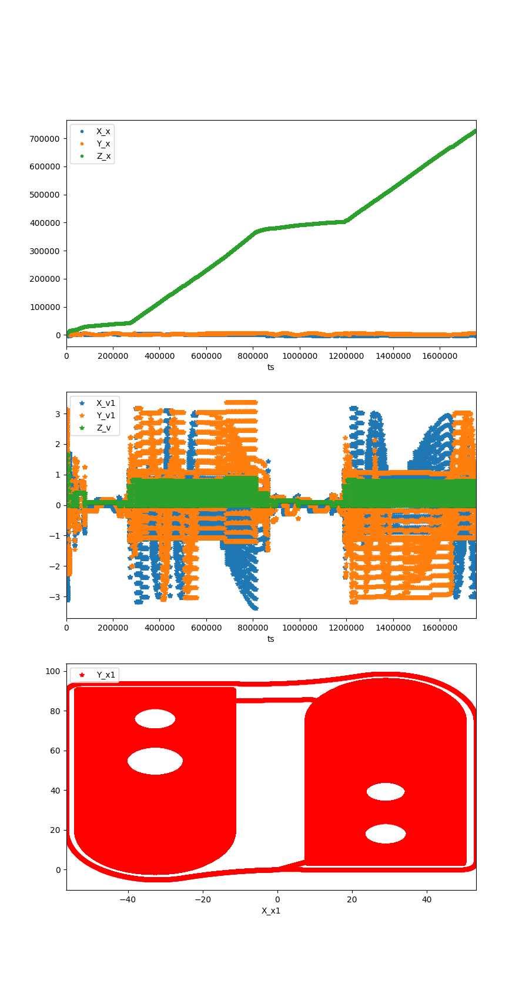

In [26]:
%matplotlib notebook

from valurap import path_planning
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

import imp
imp.reload(path_planning)

logging.basicConfig(level=logging.DEBUG)
logging.getLogger('valurp.path_planning').setLevel(logging.DEBUG)

lines = reader("test.gcode")
pg = path_gen(lines)

ext = 0
x = 0
y = 0

path = []
extras = []

gc_path = next(pg)
gc_path = next(pg)

stats = Counter()
segments = []
done = False
saved_path = None
for i in range(5000):

    if done:
        break
        
    if saved_path is None:
        gc_path = next(pg)
    else:
        gc_path = saved_path
        saved_path = None
        
    seg_len = len(gc_path[1])
    stats[seg_len] += 1

    if (len(path) + seg_len < 100):
        pass
    elif seg_len < 100:
        if len(path) > 0:
            path.append([x, y, 0])
            extras.append(ext)
            segments.append([path, extras])
        
        path = []
        extras = []
    else:
        if len(path) > 0:
            path.append([x, y, 0])
            extras.append(ext)
            segments.append([path, extras])
        
        saved_path = [None, [None] + gc_path[1][101:]]
        gc_path = [gc_path[0], gc_path[1][:101]]
        
        path = []
        extras = []

    if path == []:
        path = [[x,y,0]]
        extras = [ext]

    for p in gc_path[1][1:]:
        #print(p)
        if "Z" in p:
            done = True
            break
        if not "X" in p:
            continue
        if not "Y" in p:
            continue
        dx = p["X"]
        dy = p["Y"]
        de = p.get("E", 0)
        speed = p["F"] / 60.0

        x += dx
        y += dy
        path.append([x, y, speed])
        ext += de
        extras.append(ext)

path.append([x, y, 0])
extras.append(ext)
segments.append([path, extras])

for k,v in stats.items():
    print("s: {} {}".format(k,v))

for s, e in segments:
    print(len(s))

SLOW_LIMITS = path_planning.PathLimits(None, None, 3000, 3000, None, None, 0.1)

full_prog = []

for path, extras in segments[:10000]:
    if 1:
        print("initial path: ({})".format(len(path)))
        for i, p in enumerate(path[:30]):
            print(i, p)
            
    if len(path) == 2:
        continue


    pp = path_planning.PathPlanner(path, SLOW_LIMITS, extras=[["E", 837, extras]])
    plan, slowdowns, notes = pp.plan_with_slow_down()
    if 0:
        speedup_slowdowns = pp.plan_speedup(slowdowns, notes)
    else:
        speedup_slowdowns = slowdowns

    print(speedup_slowdowns)
    plan, errors, notes, extras_plan = pp.plan_path_in_floats(speedup_slowdowns, with_extras=True)
    #print("plan:", plan[:10])
    #print("extras_plan:", extras_plan[:10])

    int_plan = pp.plan_to_int(plan, extras_plan)
    #print(int_plan)
    pr_opt = pp.format(int_plan)
    full_prog.extend(pr_opt)

steps_opt = path_planning.emulate(full_prog, 0)
steps_opt = pd.DataFrame(steps_opt)
steps_opt["full_v"] = np.sqrt(steps_opt["X_v"]*steps_opt["X_v"] + steps_opt["Y_v"]*steps_opt["Y_v"])
steps_opt["X_v1"] = steps_opt["X_v"]
steps_opt["Y_v1"] = steps_opt["Y_v"]

fig, (ax, ax2, ax3) = plt.subplots(figsize=(9, 17), nrows=3, ncols=1)
steps_opt.plot(x = "ts", y = ["X_x", "Y_x", "Z_x"], style=".", ax=ax)
steps_opt.plot(x = "ts", y = ["X_v1", "Y_v1", "Z_v"], style="*", ax=ax2)

if 1:
    steps_opt["X_x1"] = steps_opt["X_x"]/80
    steps_opt["Y_x1"] = steps_opt["Y_x"]/80

    steps_opt.plot(x = "X_x1", y = "Y_x1", style="*", color="red", ax=ax3)
    